#LSTM AND BI-LSTM for Temperature Prediction

In [2]:
# pip install 

In [753]:
# import tensorflow as tf
import os
import pandas as pd
import numpy as np
import matplotlib as mpl
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader, random_split, Dataset,TensorDataset
# from torch.utils.data import DataLoader, random_split, Dataset
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import seaborn as sns
# from google.colab import files
# mpl.rcParams['figure.figsize'] = (12,8)
mpl.rcParams['axes.grid'] = True
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [754]:
os.getcwd()

'/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Temperature'

**Data Importation and Information**

In [755]:
# data for Abidjan
Abj_dt = pd.read_csv('/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/data/Abidjan_data.csv',parse_dates={'datetime': ['YEAR', 'MO','DY']})
# data for Kigali
Kgl_dt = pd.read_csv('/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks//data/Kigali_data.csv',parse_dates={'datetime': ['YEAR', 'MO','DY']})

# print(df.info())
# df.describe(),data_.describe()
# df.head(4) 

/tmp/ipykernel_1914949/3409575691.py:2: FutureWarning: Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.
  Abj_dt = pd.read_csv('/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/data/Abidjan_data.csv',parse_dates={'datetime': ['YEAR', 'MO','DY']})
/tmp/ipykernel_1914949/3409575691.py:4: FutureWarning: Support for nested sequences for 'parse_dates' in pd.read_csv is deprecated. Combine the desired columns with pd.to_datetime after parsing instead.
  Kgl_dt = pd.read_csv('/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks//data/Kigali_data.csv',parse_dates={'datetime': ['YEAR', 'MO','DY']})


In [756]:
##### No missing for both datasets ###
# Abj_dt.isna().sum()
# Kgl_dt.isnull().sum()
Abj_dt.columns


Index(['datetime', 'ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_SW_DWN',
       'ALLSKY_SFC_LW_DWN', 'T2M', 'T2MDEW', 'T2MWET', 'QV2M', 'RH2M',
       'PRECTOTCORR', 'PS'],
      dtype='object')

In [757]:
#Rename Columns
col_name_map = {
    "ALLSKY_SFC_SW_DWN": "ASWD",
    "CLRSKY_SFC_SW_DWN":"CSWD","ALLSKY_SFC_LW_DWN":"ALWD","PRECTOTCORR":"PREC"
}
# new_colnames=['datetime', 'ASWD', 'CSWD',
#        'ALWD', 'T2M', 'T2MDEW', 'T2MWET', 'QV2M', 'RH2M',
#        'PREC', 'PS']
# Rename the columns for both datasets
Abj_dt=Abj_dt.rename(columns=col_name_map)
Kgl_dt=Kgl_dt.rename(columns=col_name_map)



In [758]:
print(Abj_dt.info())
print(Kgl_dt.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5114 entries, 0 to 5113
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  5114 non-null   datetime64[ns]
 1   ASWD      5114 non-null   float64       
 2   CSWD      5114 non-null   float64       
 3   ALWD      5114 non-null   float64       
 4   T2M       5114 non-null   float64       
 5   T2MDEW    5114 non-null   float64       
 6   T2MWET    5114 non-null   float64       
 7   QV2M      5114 non-null   float64       
 8   RH2M      5114 non-null   float64       
 9   PREC      5114 non-null   float64       
 10  PS        5114 non-null   float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 439.6 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5114 entries, 0 to 5113
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   datetime  5114 non-null 

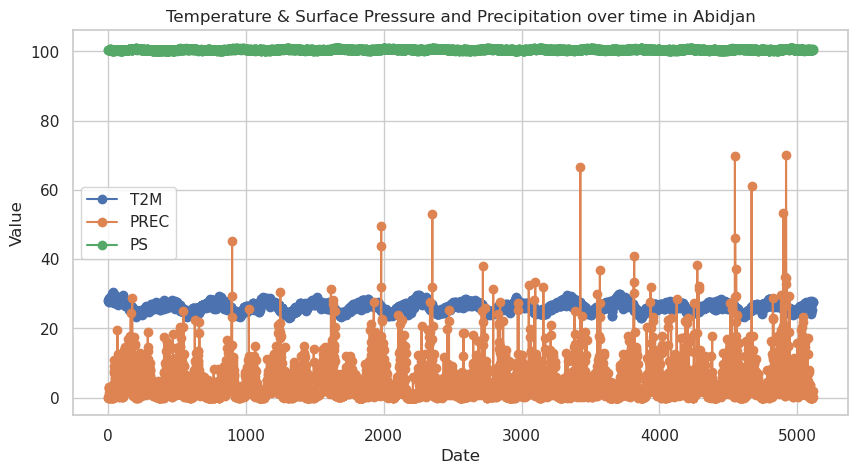

In [759]:
import pandas as pd
import matplotlib.pyplot as plt

# Select specific variables to plot
columns_to_plot = ['T2M', 'PREC','PS']

# Plot
Abj_dt[columns_to_plot].plot(figsize=(10, 5), marker='o')
plt.title('Temperature & Surface Pressure and Precipitation over time in Abidjan')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(columns_to_plot)
plt.grid(visible=True)
plt.show()


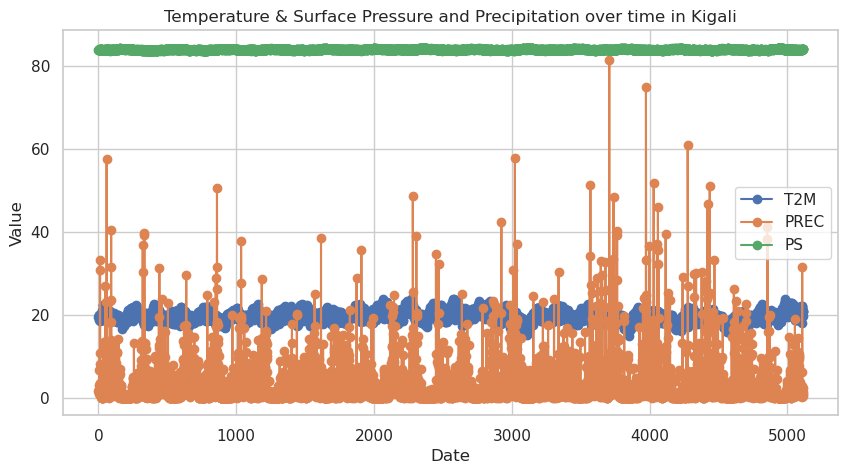

In [760]:
# Plot
Kgl_dt[columns_to_plot].plot(figsize=(10, 5), marker='o')
plt.title('Temperature & Surface Pressure and Precipitation over time in Kigali')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(columns_to_plot)
plt.grid(visible=True)
plt.show()

In [761]:
# # Plot
# df.plot(x='Date', y=columns_to_plot, figsize=(10, 5), marker='o')
# plt.title('Temperature & Humidity Over Time')
# plt.xlabel('Date')
# plt.ylabel('Value')
# plt.legend(columns_to_plot)
# plt.grid()
# plt.show()

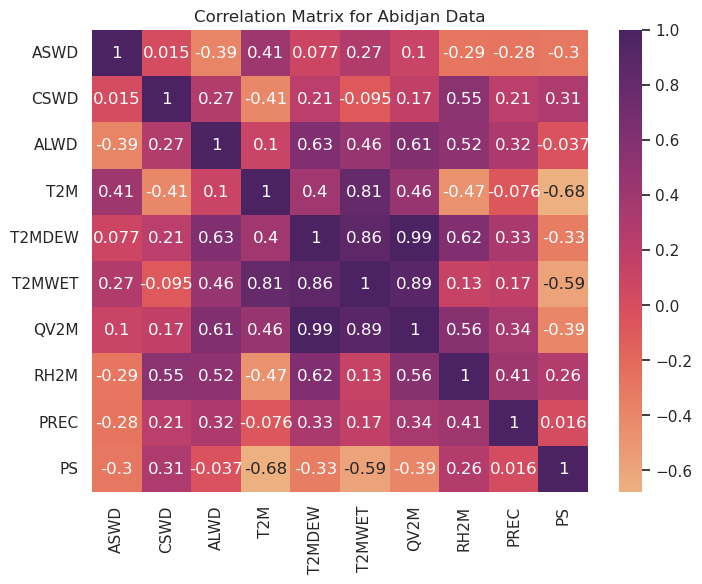

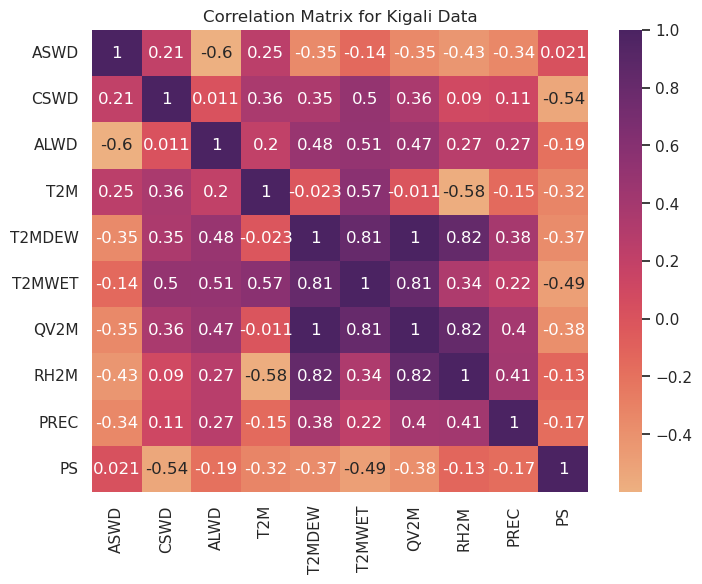

In [762]:
# df.columns,df_.columns
def displayHeatMap(dim1, dim2, title, df):
    fig=plt.figure(figsize=(dim1,dim2))
    plt.title(title)
    sns.heatmap(df, annot= True, cmap='flare')
# Define correlation matrix for both data
corr_Abj= Abj_dt.iloc[:,1:].corr()
corr_Kgl= Kgl_dt.iloc[:,1:].corr()
# Display the heatmap
displayHeatMap(8, 6,"Correlation Matrix for Abidjan Data",corr_Abj)
displayHeatMap(8, 6,"Correlation Matrix for Kigali Data",corr_Kgl)

In [763]:
Abj_dt=Abj_dt.set_index("datetime")
Kgl_dt=Kgl_dt.set_index("datetime")

In [764]:
# Abj_dt.columns

**Variable ploting**

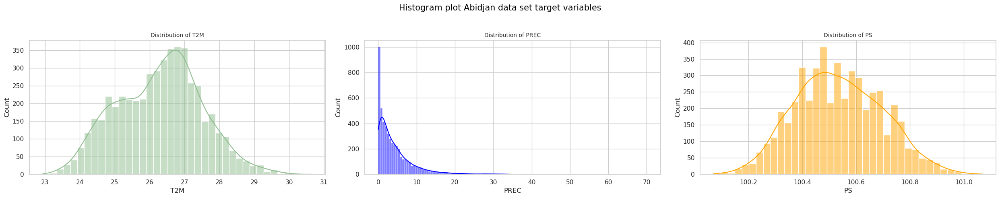

In [765]:
# df['Days'] = pd.to_datetime(df['Days'], dayfirst=True)
# df.index = pd.to_datetime(df['Days'],infer_datetime_format=True )
# plt.figure(figsize=(9,9))
# df.set_index('Days')[['T2M', 'WS2M', 'PREC', 'RH2M', 'QV2M',
#        'CSSWDW', 'T2MDEW', 'ALLSKYDW']].plot(subplots=True)
#plotting histograms of each category to idenitfy patterns in the data
import matplotlib.pyplot as plt
import seaborn as sns

def showDistributions(df, categories, per_column=True, color=["darkseagreen", "blue", "orange"], title="Original Data"):
    if per_column:
        fig, axes = plt.subplots(1, len(categories), figsize=(25, 5))

        # Ensure color list length matches categories
        if isinstance(color, str):  
            color = [color] * len(categories)  # Convert single color to list
        elif len(color) != len(categories):
            raise ValueError("The length of the color list must match the number of categories.")

        for i in range(len(categories)):
            sns.histplot(data=df, x=categories[i], kde=True, color=color[i], ax=axes[i])
            axes[i].set_title(f"Distribution of {categories[i]}",fontsize=10)

        plt.suptitle(title, fontsize=15, color="black")  # Use a single color
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout for the title

    else:
        fig, ax = plt.subplots(figsize=(8, 5))
        sns.histplot(data=df, x=categories[0], kde=True, color=color[0], ax=ax)  # Use first category for plotting
        ax.set_title(f"Distribution of {categories[0]}")

    plt.show()


showDistributions(Abj_dt,["T2M","PREC","PS"],title="Histogram plot Abidjan data set target variables")

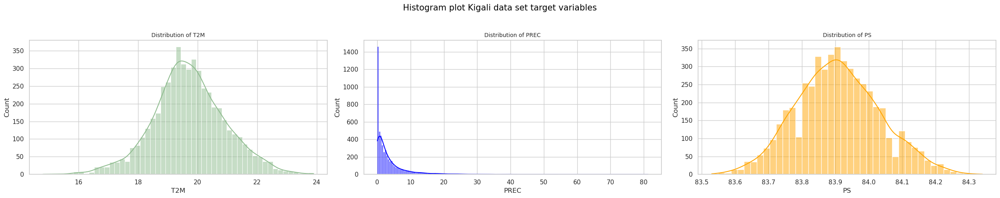

In [766]:
#Handle missing values
showDistributions(Kgl_dt,["T2M","PREC","PS"],title="Histogram plot Kigali data set target variables")
# df = df.fillna(method='ffill')a  # Forward fill for simplicity, or use df.dropna() to remove rows with NaNs
# print(df.isnull().sum())  # Verify no missing values remain


In [767]:
# scaler = MinMaxScaler(feature_range=(0,1))
# kgl=Kgl_dt[['PREC','PS']][:10]
# kgl[['PREC','PS']]=scaler.fit_transform(kgl)

In [717]:
## Define the TimeSeriesDataset class
class TimeSeriesDataset(Dataset):
    def __init__(self, dataframe, n_steps_in, n_steps_out,target_names):
        """
        Initialize the dataset with a pandas DataFrame.
        Parameters:
        - dataframe: Pandas DataFrame containing the time series data.
        - n_steps_in: Number of time steps for input.
        - n_steps_out: Number of time steps for output.
        -target_names: NAmes of the target variables.
        """
        self.dataframe = dataframe
        self.n_steps_in = n_steps_in
        self.n_steps_out = n_steps_out   
        self.target_names=target_names   
        # Prepare the input and output sequences
        self.X, self.y = self.sliding_window(self.dataframe, self.n_steps_in, self.n_steps_out,self.target_names)
    def sliding_window(self, dataframe, n_steps_in, n_steps_out,target_names):
        X, y = list(), list()  
        for i in range(len(dataframe)):
            end_idx = i + n_steps_in
            out_end_idx = end_idx + n_steps_out - 1
            # Ensure valid index range
            if out_end_idx >= len(dataframe):
                break
            # Extract X and y sequences
            seq_x = dataframe.iloc[i:end_idx, :].values  # X sequence
            seq_y = dataframe[target_names][end_idx:out_end_idx + 1].values  # y sequence (last column)| Redefine this!!!
            # Check if `seq_y` is shorter than `n_steps_out`
            if len(seq_y) < n_steps_out:
                pad_length = n_steps_out - len(seq_y)
                avg_value = np.mean(seq_y)  # Calculate the average of `seq_y`
                # Pad `seq_y` with the average value
                seq_y = np.pad(seq_y, (0, pad_length), 'constant', constant_values=avg_value)
            # Ensure `seq_y` is a 2D array
            if len(seq_y.shape) == 1:
                seq_y = seq_y.reshape(-1, 1)
            # Append the sequences to the list
            X.append(seq_x)
            y.append(seq_y)
        return np.array(X), np.array(y)
    def __len__(self):
        return len(self.X)
    def __getitem__(self, idx):
        # Return the input-output pair for the given index
        return torch.tensor(self.X[idx], dtype=torch.float32), torch.tensor(self.y[idx], dtype=torch.float32)
# dt

In [786]:
#################### Datapreprocessing For Temperature   #####################
# Sorting the dates
# Kgl_dt_input= Kgl_dt.sort_index()
# Abj_dt_input= Abj_dt.sort_index()
# Scalling
# scaler = MinMaxScaler()

def Make_tidydata(data, scaler_other, scaler_prec):
    data = data.sort_index()
    # Extract the precipitation column
    prec = data.pop("PREC") 
    # other_ys=data.pop(("T2M","PS")) 
    extracted_cols = data[["T2M", "PS"]].copy()  # make a copy if you want to keep it
    data.drop(columns=["T2M", "PS"], inplace=True)  # remove from original 
    data_concat = pd.concat([data, extracted_cols], axis=1)
    # Fit both scalers on the entire dataset BEFORE splitting
    prec_scaled = scaler_prec.fit_transform(prec.values.reshape(-1, 1))
    data_scaled = scaler_other.fit_transform(data_concat)
    # Convert scaled data back to DataFrame
    data_scaled = pd.DataFrame(data_scaled, columns=data_concat.columns, index=data.index)
    prec_scaled = pd.DataFrame(prec_scaled, columns=["PREC"], index=data.index)
    # Concatenate scaled data
    data_final = pd.concat([data_scaled, prec_scaled], axis=1)

    # Splitting the dataset into training, validation, and test sets
    train_size = int(len(data_final) * 0.8)
    val_size = int(train_size * 0.10)

    Xy_train = data_final.iloc[:train_size - val_size].copy()
    Xy_val = data_final.iloc[train_size - val_size:train_size].copy()
    Xy_test = data_final.iloc[train_size:].copy()

    return Xy_train, Xy_val, Xy_test
# Define the TimeSeriesDataset class
# class TimeSeriesDataset(Dataset):
#     def __init__(self, features, target, window_length):
#         self.features = features
#         self.target = target
#         self.window_length = window_length
#     def __len__(self):
#         return len(self.features) - self.window_length
#     def __getitem__(self, idx):
#         X = self.features[idx:idx + self.window_length]
#         y = self.target[idx + self.window_length]
#         return torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)    
# Create data loaders
def create_data_loaders(TimeSeriesDataset,Make_tidydata,df,target_names,scaler_other, scaler_prec,window_length,obs_length,batch_size):
    Xy_train,Xy_val,Xy_test=Make_tidydata(df,scaler_other, scaler_prec)
    # Creating time series data
    train_dataset = TimeSeriesDataset(Xy_train,obs_length, window_length,target_names)
    val_dataset = TimeSeriesDataset(Xy_val, obs_length, window_length,target_names)
    test_dataset = TimeSeriesDataset(Xy_test, obs_length, window_length,target_names)
    # Creating data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    return train_loader,val_loader,test_loader

# Create DataLoaders for Abidjan and Kigali  
batch_size = 64
window_length = 1
obs_length=14
scaler_other_abj, scaler_prec_abj=[MinMaxScaler(feature_range=(0,1)),MinMaxScaler(feature_range=(-1,1))]
scaler_other_kgl, scaler_prec_kgl=[MinMaxScaler(feature_range=(0,1)),MinMaxScaler(feature_range=(-1,1))]
target_names=['T2M','PS','PREC']
Abj_train_loader,Abj_val_loader,Abj_test_loader=create_data_loaders(TimeSeriesDataset,Make_tidydata,Abj_dt,target_names,scaler_other_abj, scaler_prec_abj,window_length,obs_length,batch_size)
Kgl_train_loader,Kgl_val_loader,Kgl_test_loader=create_data_loaders(TimeSeriesDataset,Make_tidydata,Kgl_dt,target_names,scaler_other_kgl, scaler_prec_kgl,window_length,obs_length,batch_size)

# Models 

In [798]:
########################################################################################################################
#####################################  Recurrent Network Model for    Temperature prediction       #################################
########################################################################################################################

#LSTM
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, dropout_prob):
        super(LSTMModel, self).__init__()       
        # Define LSTM layer
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)       
        # Define Dropout layer
        self.dropout = nn.Dropout(dropout_prob)   
        # Define Dense layer
        self.fc = nn.Linear(hidden_dim, output_dim)       
    def forward(self, x):
        # Forward pass through LSTM
        lstm_out, _ = self.lstm(x)     
        # _, (h_n, _) = self.lstm(x)  # Only use the last hidden state
        # h_n = h_n[-1]  
        # Apply dropout to LSTM output
        lstm_out = self.dropout(lstm_out[ :,-1, :])  # Use the output of the last time step   ||| We wiil try to extract the last hidden layer instead h_n[-1,:,:]    
        # Forward pass through Dense layer
        out = self.fc(lstm_out)
        return out
    
#GRU
class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, dropout_prob):
        super(GRUModel, self).__init__()       
        # Define LSTM layer
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)       
        # Define Dropout layer
        self.dropout = nn.Dropout(dropout_prob)   
        # Define Dense layer
        self.fc = nn.Linear(hidden_dim, output_dim)       
    def forward(self, x):
        # Forward pass through LSTM
        gru_out, _ = self.gru(x)      
        # Apply dropout to LSTM output
        gru_out = self.dropout(gru_out[:, -1, :])  # Use the output of the last time step       
        # Forward pass through Dense layer
        out = self.fc(gru_out)
        return out
#BiLSTM
class BiLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1, dropout=0.2):
        super(BiLSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers, 
                            bidirectional=True, batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)  # *2 for bidirectional

    def forward(self, x):
        h_lstm, _ = self.lstm(x)
        out = self.fc(h_lstm[:, -1, :])  # Use the output of the last time step
        return out
#BiGRU
class BiGRU(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1, dropout=0.2):
        super(BiGRU, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers=num_layers, 
                          bidirectional=True, batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)  # *2 for bidirectional

    def forward(self, x):
        h_gru, _ = self.gru(x)
        out = self.fc(h_gru[:, -1, :])  # Use the output of the last time step
        return out
# # Ensemble
# class MyEnsemble(nn.Module):
#     def __init__(self, input_dim, hidden_dim, output_dim, num_layers=2):
#         super(MyEnsemble, self).__init__()
#         self.lstm_model = LSTMModel(input_dim , hidden_dim, output_dim, dropout_prob=0.2).to(device)
#         self.gru_model = GRUModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2).to(device)
#         self.bilstm = BiLSTM(input_dim, hidden_dim, output_dim, num_layers).to(device)
#         self.bigrus=BiGRU(input_dim, hidden_dim, output_dim, num_layers).to(device)
#         self.weights = nn.Parameter(torch.ones(4))
#     def forward(self, x):
#         weights_normalized = F.softmax(self.weights, dim=0)
#         lstm_out = self.lstm_model(x)
#         gru_out = self.gru_model(x)
#         bilstm_out = self.bilstm(x)
#         bigru_out = self.bigrus(x)
#         # Combine the outputs (e.g., by averaging them)
#         ensemble_out = weights_normalized [0]*lstm_out + weights_normalized [1]*gru_out + weights_normalized [2]*bigru_out + weights_normalized [3]*bilstm_out 
#         return ensemble_out
# class MyEnsemble(nn.Module):
#     def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
#         super(MyEnsemble, self).__init__()
#         self.lstm_model = LSTMModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2)
#         self.gru_model = GRUModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2)
#         self.bilstm = BiLSTM(input_dim, hidden_dim, output_dim, num_layers)
#         self.bigrus = BiGRU(input_dim, hidden_dim, output_dim, num_layers)
#         self.combiner = nn.Sequential(
#             nn.Linear(output_dim * 4, output_dim*32),
#             nn.ReLU(),
#             nn.Linear(output_dim*32, output_dim))
#     def forward(self, x):
#         lstm_out = self.lstm_model(x)
#         gru_out = self.gru_model(x)
#         bilstm_out = self.bilstm(x)
#         bigru_out = self.bigrus(x)
#         # Concatenate model outputs along the feature dimension
#         combined = torch.cat([lstm_out, gru_out, bilstm_out, bigru_out], dim=-1)
#         return self.combiner(combined)
import torch.nn.functional as F

class MyEnsemble(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(MyEnsemble, self).__init__()
        
        self.lstm_model = LSTMModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2)
        self.gru_model = GRUModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2)
        self.bilstm = BiLSTM(input_dim, hidden_dim, output_dim, num_layers)
        self.bigrus = BiGRU(input_dim, hidden_dim, output_dim, num_layers)
        self.weights = nn.Parameter(torch.ones(4))
        combined_dim = output_dim * 4

        self.combiner = nn.Sequential(
            nn.Linear(combined_dim, combined_dim * 2),
            nn.LayerNorm(combined_dim * 2),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(combined_dim * 2, combined_dim),
            nn.LayerNorm(combined_dim),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(combined_dim, output_dim)
        )

    def forward(self, x):
        lstm_out = self.lstm_model(x)
        gru_out = self.gru_model(x)
        bilstm_out = self.bilstm(x)
        bigru_out = self.bigrus(x)
        weights_normalized = F.softmax(self.weights, dim=0)
        # For classification: use final timestep (adjust if your models return sequences)
        if lstm_out.ndim == 3:
            lstm_out = lstm_out[:, -1, :]
            gru_out = gru_out[:, -1, :]
            bilstm_out = bilstm_out[:, -1, :]
            bigru_out = bigru_out[:, -1, :]

        combined = torch.cat([weights_normalized [0]*lstm_out, weights_normalized [1]*gru_out, weights_normalized [2]*bilstm_out, weights_normalized [3]*bigru_out], dim=-1)
        return self.combiner(combined)


# Early Stopping Function

In [788]:
import numpy as np
import torch

class EarlyStopping:
    def __init__(self, patience=50, mode='min', verbose=False, delta=0, save_path=None):
        self.patience = patience
        self.mode = mode
        self.verbose = verbose
        self.delta = delta  # Added delta to ignore small improvements
        self.save_path = save_path  # Path to save the best model
        self.best_score = np.inf if mode == 'min' else -np.inf
        self.early_stop = False
        self.counter = 0

    def __call__(self, score, model=None):
        if self.mode == 'min':
            # Check if the score has decreased significantly
            if score < self.best_score - self.delta:
                self.best_score = score
                self.counter = 0
                if self.verbose:
                    print(f'Validation loss decreased ({self.best_score:.6f} --> {score:.6f}). Saving model...')
                if model and self.save_path:
                    torch.save(model.state_dict(), self.save_path)
            else:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True
                    if self.verbose:
                        print(f'Early stopping triggered after {self.patience} epochs with no improvement.')

        elif self.mode == 'max':
            # Check if the score has increased significantly
            if score > self.best_score + self.delta:
                self.best_score = score
                self.counter = 0
                if self.verbose:
                    print(f'Validation metric increased ({self.best_score:.6f} --> {score:.6f}). Saving model...')
                if model and self.save_path:
                    torch.save(model.state_dict(), self.save_path)
            else:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True
                    if self.verbose:
                        print(f'Early stopping triggered after {self.patience} epochs with no improvement.')


# Model Initialization

In [726]:
# # Initialize models
# input_dim = Abj_dt.shape[1]
# hidden_dim = 94
# output_dim = len(target_names)
# num_layers = 2


In [727]:
# optimizer_lstm 

In [32]:
# t=torch.Tensor([2,1])
# p=torch.Tensor([2,1])
# torch.nn.MSELoss()(t,p)
# # t.item()

tensor(0.)

# Training Recurrent-Based Functions

In [789]:

# Initialize early stopping
patience=50
# Define the loss function and optimizer
criterion = [torch.nn.MSELoss() for i in range(len(target_names))]
# class Sum_Mse():
#     def __init__(self,data1, data2,mse):
#         self.mse=[]
# class LineSumMSE(nn.Module):
#     def __init__(self):
#         super(LineSumMSE, self).__init__()
#     def forward(self, output, target):
#         squared_diff = (output-target)**2
#         line_sums = squared_diff.sum(dim=1)
#         mse_loss = line_sums.mean()
#         return mse_loss
    
# criterion = LineSumMSE( )
 
#Define metrics
def rmse(predictions, targets):
    return torch.sqrt(torch.mean((predictions - targets) ** 2,0))
def mse(predictions, targets):
    return torch.mean((predictions - targets) ** 2,0)
def mae(predictions, targets):
    return torch.mean(torch.abs(predictions - targets),0)
# Training function
def training_function(model,train_loader,val_loader,optimizer,num_epochs=160):
    train_losses=[]
    val_losses = []
    final_losses=[]
    early_stopping = EarlyStopping(patience=patience, mode='min', verbose=True)
    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        running_loss = 0.0
        running_mse = 0.0
        running_mae = 0.0  
        # Training phase
        for X_batch, y_batch in train_loader:
            X_batch,y_batch=X_batch.to(device),y_batch.to(device).squeeze()
            optimizer.zero_grad()
            # output1,output2,output3 = model(X_batch)
            # y1,y2,y3=y_batch
            # loss
            loss=0
            for i in range(y_batch.shape[1]):
                o_i=model(X_batch)[:,i]
                y_i=y_batch[:,i]
                loss_i=criterion[i](o_i,y_i)
                loss+=loss_i
            # print("output size:",outputs.shape,"y_batch:",y_batch.shape )
            # loss = criterion(outputs, y_batch)    
            # loss=torch.mean((outputs-y_batch)**2,axis=0)
            # print()
            loss.backward()
            optimizer.step()
            # print("loss:",loss,"loss shape:",loss.shape)
            running_loss += loss * X_batch.size(0)  
            outputs = model(X_batch)    
            running_mse += mse(outputs, y_batch) * X_batch.size(0)
            running_mae += mae(outputs, y_batch) * X_batch.size(0)
        # Cumulative training loss 
        epoch_train_loss = running_loss / len(train_loader.dataset)
        epoch_train_mse = running_mse / len(train_loader.dataset)
        epoch_train_mae = running_mae / len(train_loader.dataset)
        train_losses.append(epoch_train_mse.detach())
        # Validation phase 
        model.eval() # Set model to validation model
        val_loss = 0.0
        val_mse = 0.0
        val_mae = 0.0
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch,y_batch=X_batch.to(device),y_batch.to(device).squeeze()
                
                outputs = model(X_batch)
                # print("y_batch.shape:",y_batch.shape,outputs.shape)
                # o_l2=torch.norm(outputs)
                # y_l2=torch.norm(y_batch)
                # print("output_norm:",o_l2,"y_norm:",y_l2 )
                # loss = criterion(outputs, y_batch)
                # loss_=torch.mean((outputs-y_batch)**2,axis=0)
                # val_loss += loss_* X_batch.size(0)
                val_mse += mse(outputs, y_batch) * X_batch.size(0)
                val_mae += mae(outputs, y_batch) * X_batch.size(0)
        # Cumulative validation loss 
        # epoch_val_loss = val_loss / len(val_loader.dataset)
        epoch_val_mse = val_mse / len(val_loader.dataset)
        epoch_val_mae = val_mae / len(val_loader.dataset)
        val_losses.append(epoch_val_mse.detach())
        if (epoch+1)%5==0:
            # Print losses and metrics
            print(f'Epoch {epoch+1}/{num_epochs}')
            print(f'Combined Loss:{epoch_train_loss:.4f}, Training Loss: {epoch_train_mse}, MAE: {epoch_train_mae}') #,
            print(f'Validation Loss: {epoch_val_mse}, MAE: {epoch_val_mae}') # MSE: {epoch_val_loss}
            # print(f'Training Loss: {epoch_train_loss}, MSE: {epoch_train_mse}, MAE: {epoch_train_mae}') #:.4f
            # print(f'Validation Loss: {epoch_val_loss}, MSE: {epoch_val_mse}, MAE: {epoch_val_mae}')
            print('------------------------------------')  
        # Check early stopping
        early_stopping(torch.mean(epoch_val_mse).item())
        if early_stopping.early_stop:
            print('Early stopping')
            break
        #[epoch_train_loss,epoch_train_mse,epoch_train_mae]
        # final_losses.append([epoch_train_loss.detach(),epoch_train_mse.detach(),epoch_train_mae.detach(),epoch_val_mse,epoch_val_mae])
    train_losses = np.vstack([tensor.detach().cpu().numpy() for tensor in train_losses])
    val_losses = np.vstack([tensor.detach().cpu().numpy() for tensor in val_losses])
    return train_losses,val_losses

In [29]:
# # [2,2]*3
# # np.sum([0.0561, 0.0518, 0.0677])/3
# histopry_lstm_ = [[item.numpy() for item in row] for row in ]
# histopry_lstm_

In [30]:
# l=[[0.0561, 0.0518, 0.0677],[0.0561, 0.0518, 0.1]]
# a,b=l
# np.array(history_lstm)
# history_lstm
# epoch_train_mse,epoch_val_mse=history_lstm

In [31]:
# epoch_train_mse
# a,b,c=epoch_train_mse.T
# a,b,c

In [32]:
#print(epoch_train_mse)

In [38]:
# anp.array()
# epoch_train_mse
# list(torch.tensor([0.0553]))

In [31]:
#Ensemble model
# history_ens=training_function(ens_model,Abj_train_loader,Abj_val_loader,optimizer_ens ,num_epochs=2)
# history_lstm=training_function(model_lstm,Abj_train_loader,Abj_val_loader,optimizer_lstm ,num_epochs=10)
os.getcwd()

'/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Temperature'

* Make the plots of the lurning curves for each models and per city.
* Write a for loop to automate the process evoked above and another for loop for the predictions per models and per city.

In [409]:
# np.mean([0.2672, 0.0064, 0.2475]),np.mean([0.2672, 0.0064, 0.2475])

path= "/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Models"
if os.path.exists(path):
    print("Path exists!")
else:
    print("Path does not exist!")

Path exists!


In [799]:
# import os
# import torch
# import torch.optim as optim

# # Ensure the directory exists
# path = "./models"
# os.makedirs(path, exist_ok=True)

# Data Loaders
dt_loaders = [[Kgl_train_loader, Kgl_val_loader], [Abj_train_loader, Abj_val_loader]]


# Labels
model_name = ["LSTM", "GRU", "BiLSTM", "BiGRU", "Ensemble Learning"]
data_name = ["Kigali", "Abidjan"]

# Training history storage
history_container = [[], []]
model_container={"Kigali":[],"Abidjan":[]}
# Loop through data loaders
for idx, data in enumerate(dt_loaders):
    # Model Definitions
    models = [
        # LSTMModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2).to(device),
        # GRUModel(input_dim, hidden_dim, output_dim, dropout_prob=0.2).to(device),
        # BiLSTM(input_dim, hidden_dim, output_dim, num_layers).to(device),
        # BiGRU(input_dim, hidden_dim, output_dim, num_layers).to(device),
        MyEnsemble(input_dim, hidden_dim, output_dim, num_layers).to(device),
    ]
    
    # Create optimizers for each model
    optimizers = [optim.Adam(model.parameters(), lr=0.001) for model in models]

    for idx_m, (model, opt) in enumerate(zip(models, optimizers)):
        history = training_function(model, data[0], data[1], opt, num_epochs=100)
        history_container[idx].append(history)
        model_container[data_name[idx]].append(model)
        # # Save model
        # model_path = os.path.join(path, f"model_{model_name[idx_m]}_{data_name[idx]}.pt")
        # torch.save(model.state_dict(), model_path)  # Save model state_dict instead of full model




Validation loss decreased (0.037124 --> 0.037124). Saving model...
Validation loss decreased (0.033849 --> 0.033849). Saving model...
Validation loss decreased (0.031500 --> 0.031500). Saving model...
Validation loss decreased (0.031336 --> 0.031336). Saving model...
Epoch 5/100
Combined Loss:0.1679, Training Loss: tensor([0.0600, 0.0506, 0.0599], device='cuda:0', grad_fn=<DivBackward0>), MAE: tensor([0.1925, 0.1802, 0.1912], device='cuda:0', grad_fn=<DivBackward0>)
Validation Loss: tensor([0.0174, 0.0201, 0.0541], device='cuda:0'), MAE: tensor([0.0975, 0.1126, 0.1348], device='cuda:0')
------------------------------------
Validation loss decreased (0.030558 --> 0.030558). Saving model...
Validation loss decreased (0.030481 --> 0.030481). Saving model...
Validation loss decreased (0.029965 --> 0.029965). Saving model...
Validation loss decreased (0.027579 --> 0.027579). Saving model...
Epoch 10/100
Combined Loss:0.1070, Training Loss: tensor([0.0420, 0.0265, 0.0376], device='cuda:0', g

In [53]:
# data[cpt]
# history_container[0][0]
# import copy
# model_container_copy=copy.deepcopy(model_container)

{'Kigali': [LSTMModel(
    (lstm): LSTM(10, 94, batch_first=True)
    (dropout): Dropout(p=0.2, inplace=False)
    (fc): Linear(in_features=94, out_features=3, bias=True)
  ),
  GRUModel(
    (gru): GRU(10, 94, batch_first=True)
    (dropout): Dropout(p=0.2, inplace=False)
    (fc): Linear(in_features=94, out_features=3, bias=True)
  ),
  BiLSTM(
    (lstm): LSTM(10, 94, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
    (fc): Linear(in_features=188, out_features=3, bias=True)
  ),
  BiGRU(
    (gru): GRU(10, 94, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
    (fc): Linear(in_features=188, out_features=3, bias=True)
  ),
  MyEnsemble(
    (lstm_model): LSTMModel(
      (lstm): LSTM(10, 94, batch_first=True)
      (dropout): Dropout(p=0.2, inplace=False)
      (fc): Linear(in_features=94, out_features=3, bias=True)
    )
    (gru_model): GRUModel(
      (gru): GRU(10, 94, batch_first=True)
      (dropout): Dropout(p=0.2, inplace=False)
      (fc): 

In [162]:
#LSTM
# history_lstm=training_function(model_lstm,train_loader,val_loader,optimizer_lstm,num_epochs=400)
# history_container

In [173]:
#GRU
# history_gru=training_function(model_gru,train_loader,val_loader,optimizer_gru,num_epochs=400)


In [174]:
#BiLSTM
# history_bilstm=training_function(model_bilstm,train_loader,val_loader,optimizer_bilstm,num_epochs=400)


In [175]:
#BiGRU
# history_bigru=training_function(model_bigrus, train_loader, val_loader,optimizer_bigrus, num_epochs=400)

In [146]:
# history_container[0]
# hist_per_data_Mdls[i]

In [120]:
# train_losses[:,j]

array([0.0709204 , 0.06240274, 0.05778573], dtype=float32)

### Learning plot of each models

In [791]:
# Assume these are your histories
# all_history = [history_lstm, history_gru, history_bilstm, history_bigru]
# all_history=[history_ens]
data_name=["Kigali","Abidjan"]
model_name=["LSTM","GRU","BiLSTM","BiGRU","Ensemble Learning"]
# Create a figure and a set of subplots
 # One subplot per model
# axs=axs.flatten()
# Loop through each history and corresponding axis
# for dt_idx in range(len(history_container)):

def plot_L_curves(hist_per_data_Mdls,target_names,model_name,data_name:str):
    # hist_per_data_Mdls=history_container[dt_idx]
    
    fig, axs = plt.subplots(5,3, figsize=(14, 12)) 
    for j, name in enumerate(target_names):
        for i, history in enumerate(hist_per_data_Mdls):
            
            train_losses, val_losses= hist_per_data_Mdls[i]
            epochs=[i for i in range(len(train_losses))]
            axs[i,j].plot(epochs,train_losses[:,j], label='Training Loss')
            axs[i,j].plot(epochs,val_losses[:,j], label='Validation Loss')
            axs[i,j].set_title(f'{data_name} {target_names[j]} using {model_name[i]}',fontsize=10)
            axs[i,j].set_xlabel('Epochs')
            axs[i,j].set_ylabel('Loss')
            axs[i,j].legend()
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
# dt_idx=0
# hist_per_data_Mdls=history_container[dt_idx]
# plot_L_curves(hist_per_data_Mdls,target_names,model_name,data_name[dt_idx])


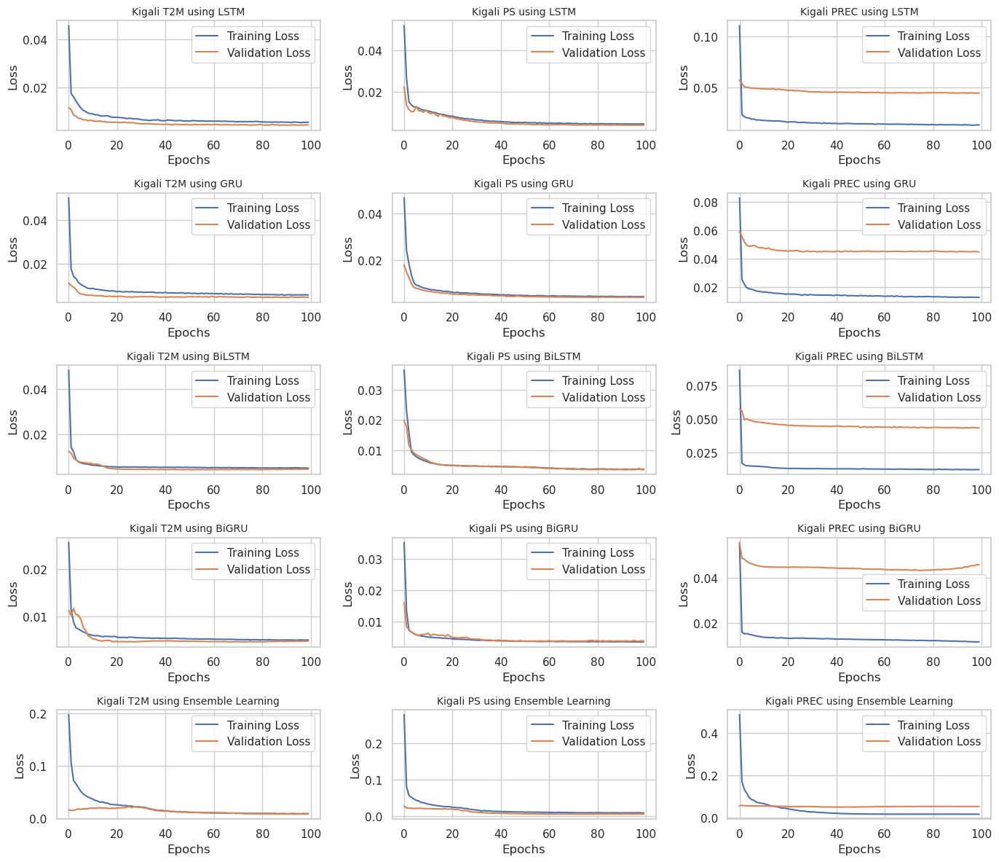

In [792]:
plot_L_curves(history_container[0],target_names,model_name,data_name[0])
# history_container[1]
# data_name[1]

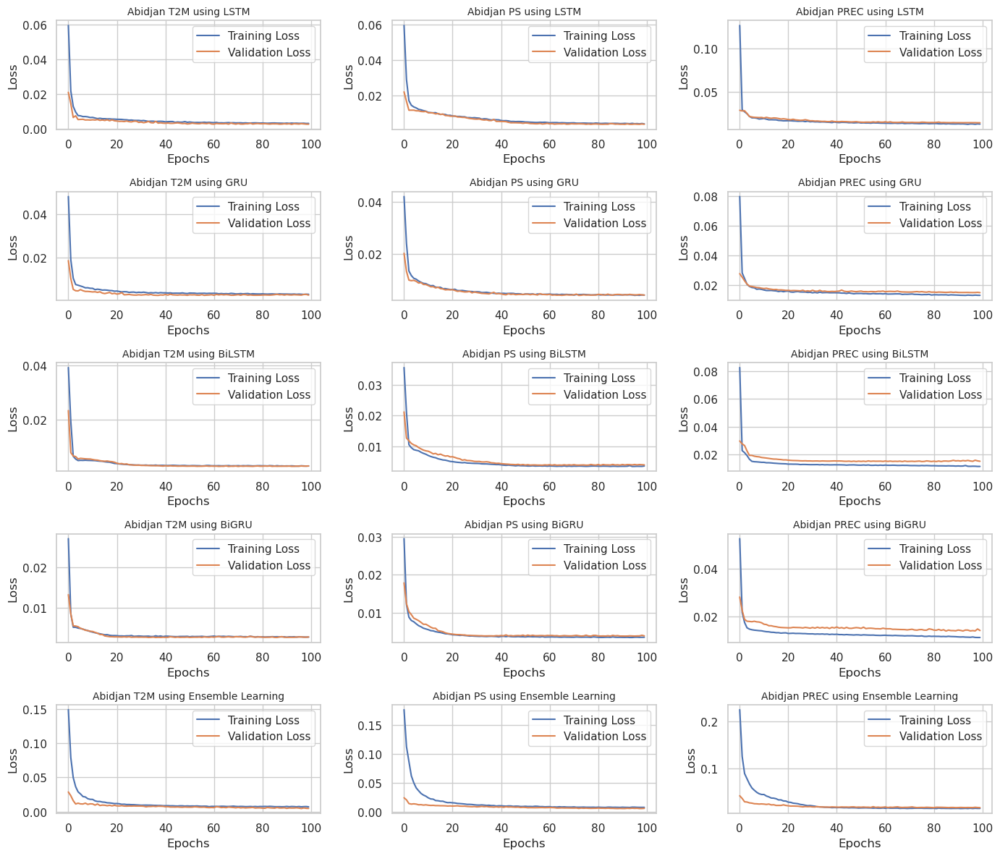

In [793]:
plot_L_curves(history_container[1],target_names,model_name,data_name[1])

In [73]:
# import torch

# # Example data: Rows are samples, columns are variables
# y_true = torch.tensor([[3.0, -0.5, 2.0, 7.0], 
#                        [4.0, 1.0, 2.0, 8.0], 
#                        [5.0, 0.5, 1.5, 7.5]])  # Actual values
# y_pred = torch.tensor([[2.5, 0.0, 2.1, 7.8], 
#                        [4.2, 1.1, 2.3, 7.6], 
#                        [4.8, 0.4, 1.8, 7.3]])  # Predicted values



# print("R^2 scores across variables:", r2_scores)


R^2 scores across variables: tensor([ 0.8350,  0.7686, -0.1400, -0.6800])


# Predictions

In [781]:
import torch
import torch.nn.functional as F
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def mean_absolute_percentage_error(y_pred,y_true): 
    return torch.mean(torch.abs((y_true - y_pred) / (y_true+0.000001)),dim=0) * 100
def r2_squared(y_pred,y_true):
    # Compute mean of y_true along rows (axis=0), for each variable
    y_mean = torch.mean(y_true, dim=0)  # Shape: (variables,)
    # Compute residual sum of squares (SS_res) for each variable
    ss_res = torch.sum((y_true - y_pred) ** 2, dim=0)  # Shape: (variables,)
    # Compute total sum of squares (SS_tot) for each variable
    ss_tot = torch.sum((y_true - y_mean) ** 2, dim=0)  # Shape: (variables,)
    # Compute R^2 for each variable
    r2_scores = 1 - (ss_res / ss_tot)  # Shape: (variables,)
    # print((ss_res / ss_tot) )
    # ls=[]
    # for i in range(3):
    return r2_scores
scaler_dict={"Kigali":[scaler_other_kgl, scaler_prec_kgl],"Abidjan":[scaler_other_abj, scaler_prec_abj]}

# import numpy as np
# import pandas as pd
# import torch

def evaluate_model(model_container, test_loader_list, scaler_dict, device, target_names=['T2M', 'PS', 'PREC']):
    metrics_list = []
    
    for idx, (city, models) in enumerate(model_container.items()):
        
        test_loader = test_loader_list[idx]  # Fetch the correct test loader
        scaler_other, scaler_prec= scaler_dict[city]  # Use a dictionary lookup instead of hardcoding indices
        
        for model in models:
            model_name = model.__class__.__name__  # Get model class name as identifier
            model.to(device)
            model.eval()
            
            total_loss = 0.0
            y_true_list = []
            y_pred_list = []
            
            with torch.no_grad():
                for X_batch, y_batch in test_loader:
                    X_batch, y_batch = X_batch.to(device), y_batch.squeeze().to(device)
                    outputs = model(X_batch)
                    
                    # Compute loss
                    loss = torch.nn.functional.mse_loss(outputs, y_batch)
                    total_loss += loss.item() * X_batch.size(0)
                    
                    y_true_list.append(y_batch.cpu().numpy())
                    y_pred_list.append(outputs.cpu().numpy())
            
            avg_loss = total_loss / len(test_loader.dataset)
            
            # Convert lists to NumPy arrays
            y_true = np.concatenate(y_true_list)
            y_pred = np.concatenate(y_pred_list)

            # Extract the precipitation variables
            prec_y=y_true[:,-1]
            prec_pred=y_pred [:,-1]
            
            # Inverse transform
            dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2] - 3)) # -3 because we exclude the precipitation
            actuals_padded = np.hstack([dummy_features, y_true[:,:-1]])
            predictions_padded = np.hstack([dummy_features, y_pred[:,:-1]])
            # inverse the concatenated matrix with the two variables (T2M and PS)
            actuals__other = scaler_other.inverse_transform(actuals_padded)[:, -2:]
            predictions__other= scaler_other.inverse_transform(predictions_padded)[:, -2:]
            # inverse the precipitation variable from predicted and actual values
            prec_pred_var=scaler_prec.inverse_transform(prec_pred.reshape(-1,1))
            prec_actual_var=scaler_prec.inverse_transform(prec_y.reshape(-1,1))
            # Concatenate
            actuals_=np.concatenate((actuals__other, prec_actual_var),axis=1)
            predictions_= np.concatenate((predictions__other,prec_pred_var),axis=1)
            # Compute metrics for each target variable separately
            for i, var_name in enumerate(target_names):
                actual = actuals_[:, i]
                pred = predictions_[:, i]
                
                mse_ = np.mean((actual - pred) ** 2)
                rmse_ = np.sqrt(mse_)
                mae_ = np.mean(np.abs(actual - pred))
                r2_ = 1 - (np.sum((actual - pred) ** 2) / np.sum((actual - np.mean(actual)) ** 2))

                # Handle potential division by zero in MAPE
                mask = actual != 0
                mape_ = np.mean(np.abs((actual[mask] - pred[mask]) / actual[mask])) * 100 if mask.any() else np.nan

                # Store metrics for each variable
                metrics_list.append({
                    "City": city,
                    "Model": model_name,
                    "Variable": var_name,
                    "MSE": mse_,
                    "RMSE": rmse_,
                    "MAE": mae_,
                    "R²": r2_,
                    "MAPE": mape_
                })
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_list)
    return metrics_df


In [794]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
scaler_dict={"Kigali":[scaler_other_kgl, scaler_prec_kgl],"Abidjan":[scaler_other_abj, scaler_prec_abj]}

def evaluate_and_plot(model_container, test_loader_list, scaler_dict, device, target_names=['T2M', 'PS', 'PREC']):
    metrics_list = []
    
    for idx, (city, models) in enumerate(model_container.items()):
        # test_loader = test_loader_list[idx]  # Fetch the correct test loader
        # scaler_ = scaler_dict[city]  # Use a dictionary lookup instead of hardcoding indices
        test_loader = test_loader_list[idx]  # Fetch the correct test loader
        scaler_other, scaler_prec= scaler_dict[city]  # Use a dictionary lookup instead of hardcoding indices
        
        for model in models:
            model_name = model.__class__.__name__  # Get model class name as identifier
            model.to(device)
            model.eval()
            
            y_true_list = []
            y_pred_list = []
            
            with torch.no_grad():
                for X_batch, y_batch in test_loader:
                    X_batch, y_batch = X_batch.to(device), y_batch.squeeze().to(device)
                    outputs = model(X_batch)

                    y_true_list.append(y_batch.cpu().numpy())
                    y_pred_list.append(outputs.cpu().numpy())
            
            # Convert lists to NumPy arrays
            y_true = np.concatenate(y_true_list)
            y_pred = np.concatenate(y_pred_list)

            # Extract the precipitation variables
            prec_y=y_true[:,-1]
            prec_pred=y_pred [:,-1]
            
            # Inverse transform
            dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2] - 3)) # -3 because we exclude the precipitation
            actuals_padded = np.hstack([dummy_features, y_true[:,:-1]])
            predictions_padded = np.hstack([dummy_features, y_pred[:,:-1]])
            # inverse the concatenated matrix with the two variables (T2M and PS)
            actuals__other = scaler_other.inverse_transform(actuals_padded)[:, -2:]
            predictions__other= scaler_other.inverse_transform(predictions_padded)[:, -2:]
            # inverse the precipitation variable from predicted and actual values
            prec_pred_var=scaler_prec.inverse_transform(prec_pred.reshape(-1,1))
            prec_actual_var=scaler_prec.inverse_transform(prec_y.reshape(-1,1))
            # Concatenate
            actuals_=np.concatenate((actuals__other, prec_actual_var),axis=1)
            predictions_= np.concatenate((predictions__other,prec_pred_var),axis=1)
            # # Inverse transform
            # dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2] - 3))
            # actuals_padded = np.hstack([dummy_features, y_true])
            # predictions_padded = np.hstack([dummy_features, y_pred])
            
            # actuals_ = scaler_.inverse_transform(actuals_padded)[:, -3:]
            # predictions_ = scaler_.inverse_transform(predictions_padded)[:, -3:]

            # Create a figure with subplots
            fig, axes = plt.subplots(len(target_names), 2, figsize=(12, 10))  
            fig.suptitle(f"{city} - {model_name} Predictions vs. Actuals", fontsize=14, fontweight="bold")

            for i, var_name in enumerate(target_names):
                actual = actuals_[:, i]
                pred = predictions_[:, i]

                # Compute metrics
                mse_ = np.mean((actual - pred) ** 2)
                rmse_ = np.sqrt(mse_)
                mae_ = np.mean(np.abs(actual - pred))
                r2_ = 1 - (np.sum((actual - pred) ** 2) / np.sum((actual - np.mean(actual)) ** 2))

                # Handle potential division by zero in MAPE
                mask = actual != 0
                mape_ = np.mean(np.abs((actual[mask] - pred[mask]) / actual[mask])) * 100 if mask.any() else np.nan

                # Store metrics
                metrics_list.append({
                    "City": city,
                    "Model": model_name,
                    "Variable": var_name,
                    "MSE": round(mse_,4),
                    "RMSE": round(rmse_,4),
                    "MAE": round(mae_,4),
                    "R²": round(r2_,4),
                    "MAPE": round(mape_,4)
                })

                # --- Subplot 1: Line Plot ---
                ax1 = axes[i, 0]
                ax1.plot(actual, label="Actual", color="blue", alpha=0.7)
                ax1.plot(pred, label="Predicted", color="red", linestyle="dashed", alpha=0.7)
                ax1.set_title(f"{var_name} - Time Series")
                ax1.set_xlabel("Time Step")
                ax1.set_ylabel(var_name)
                ax1.legend()

                # --- Subplot 2: Histogram ---
                ax2 = axes[i, 1]
                sns.histplot(actual, label="Actual", color="blue", kde=True, bins=30, alpha=0.5, ax=ax2)
                sns.histplot(pred, label="Predicted", color="red", kde=True, bins=30, alpha=0.5, ax=ax2)
                ax2.set_title(f"{var_name} - Distribution")
                ax2.set_xlabel(var_name)
                ax2.set_ylabel("Frequency")
                ax2.legend()

            plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit suptitle
            plt.show()
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_list)
    return metrics_df


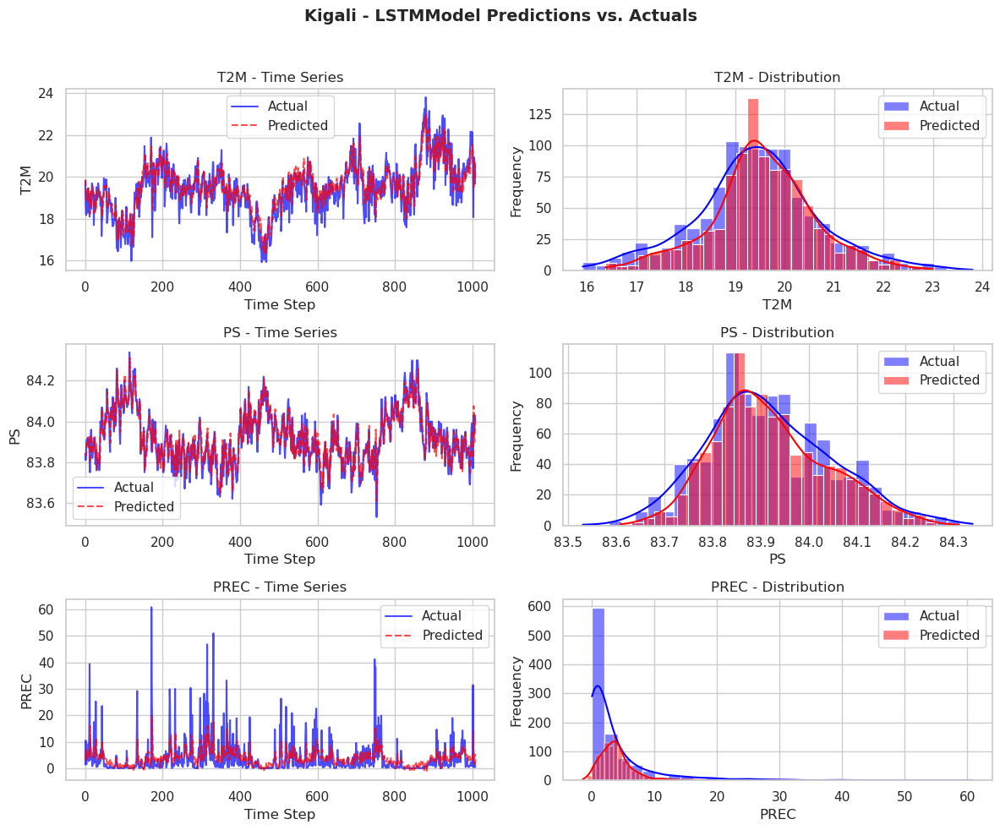

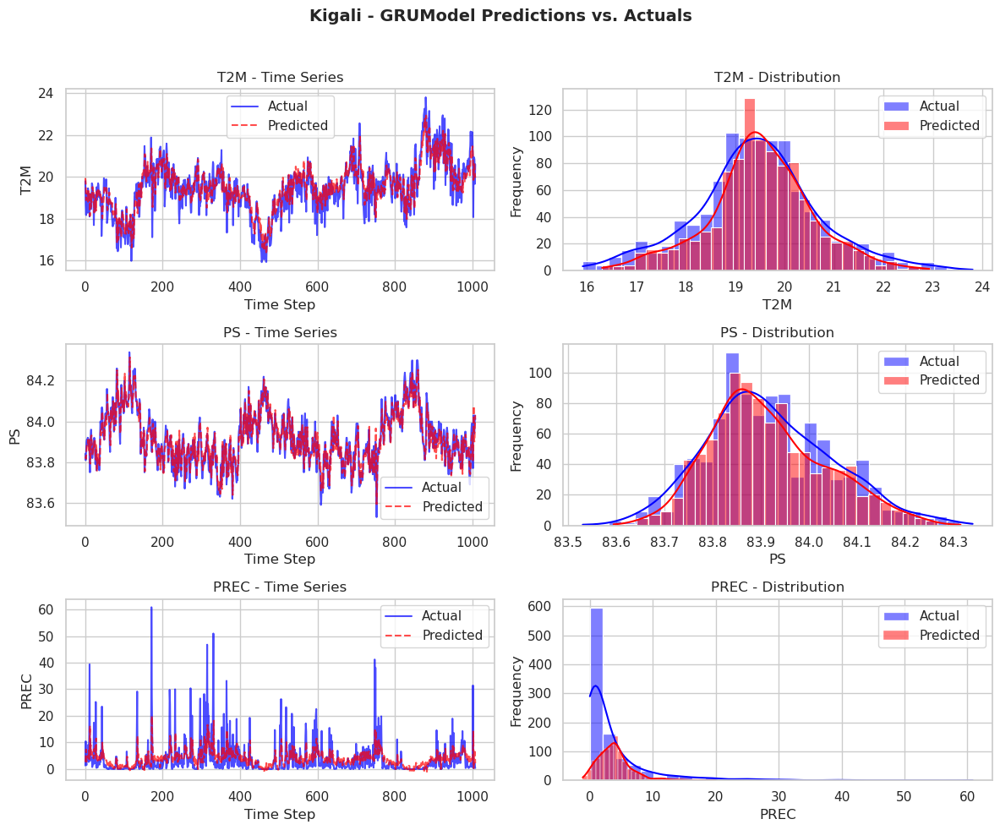

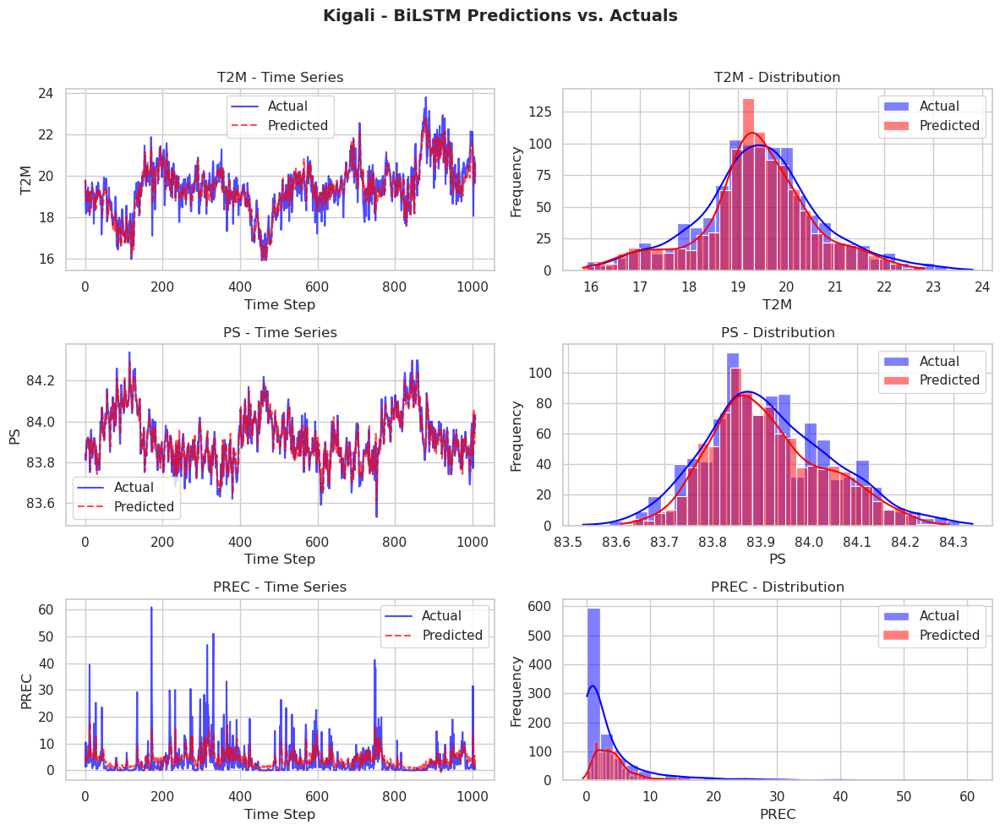

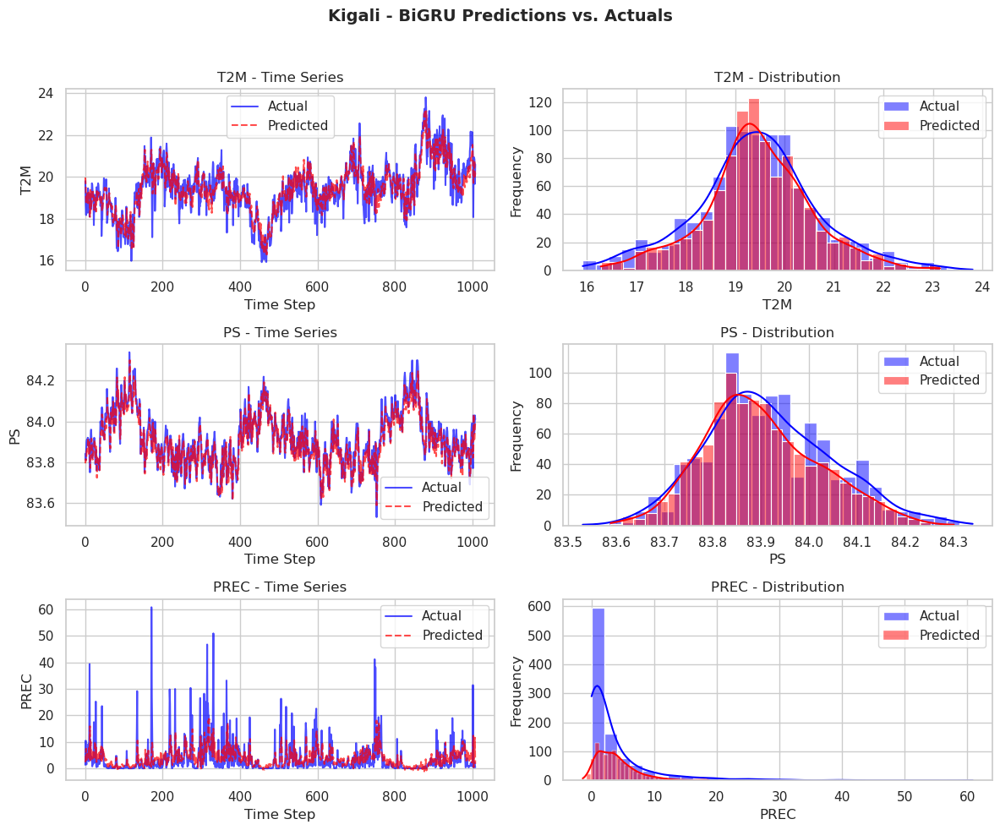

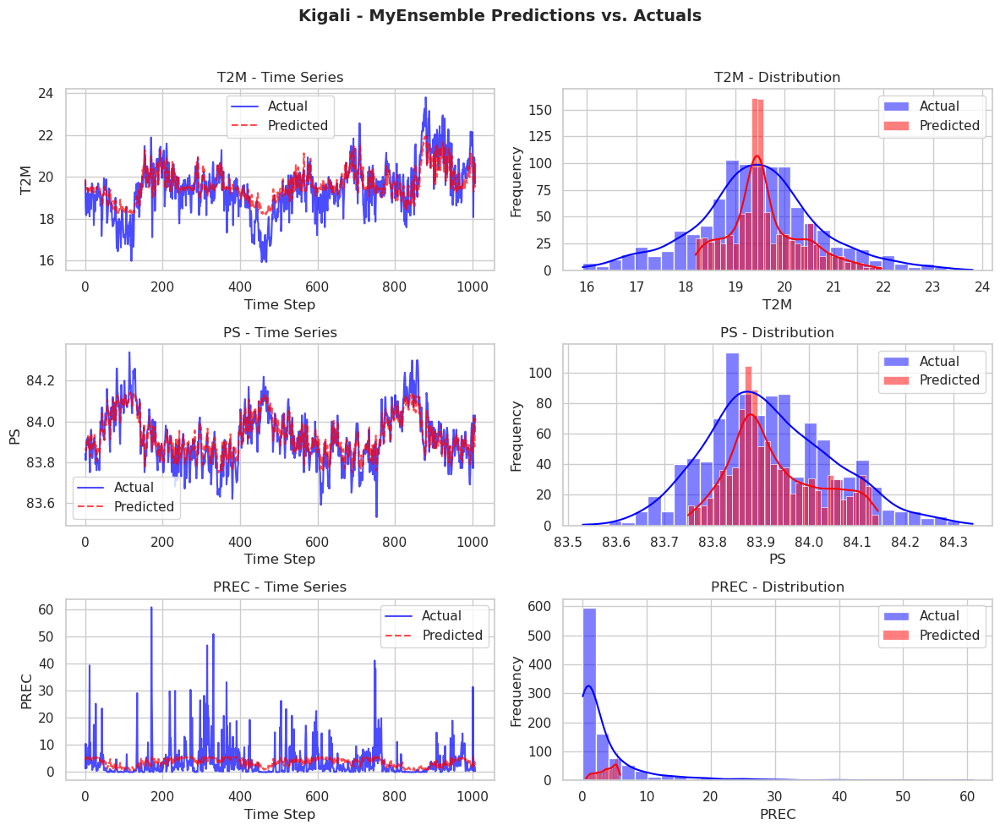

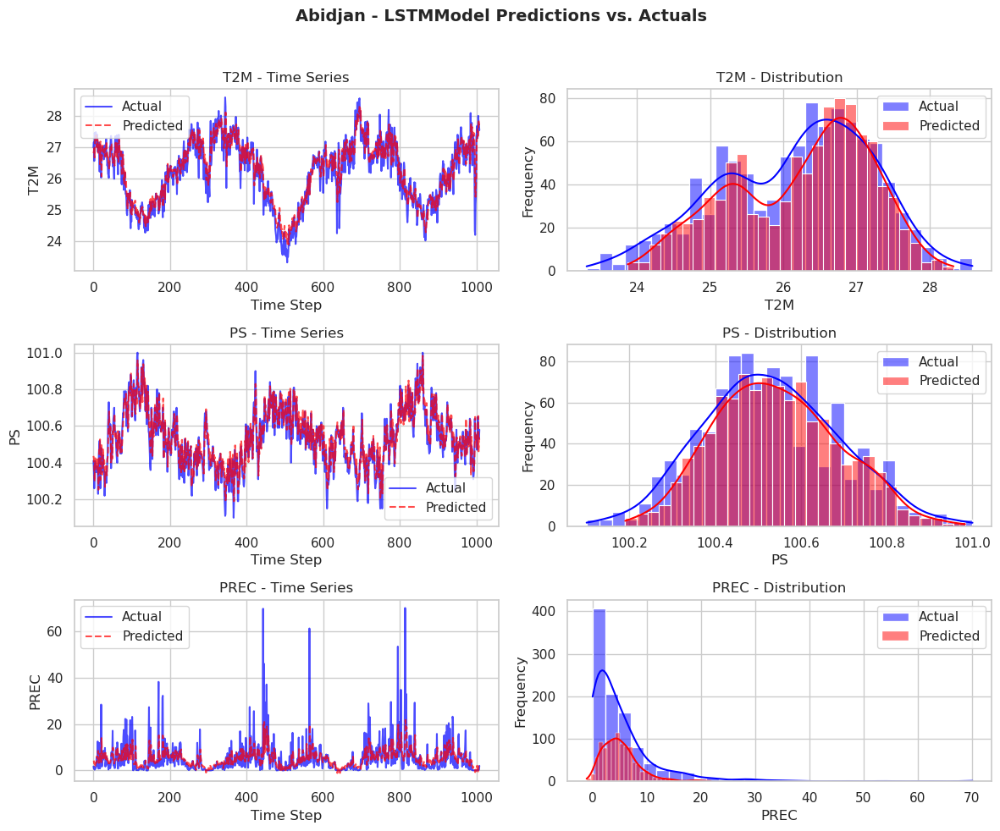

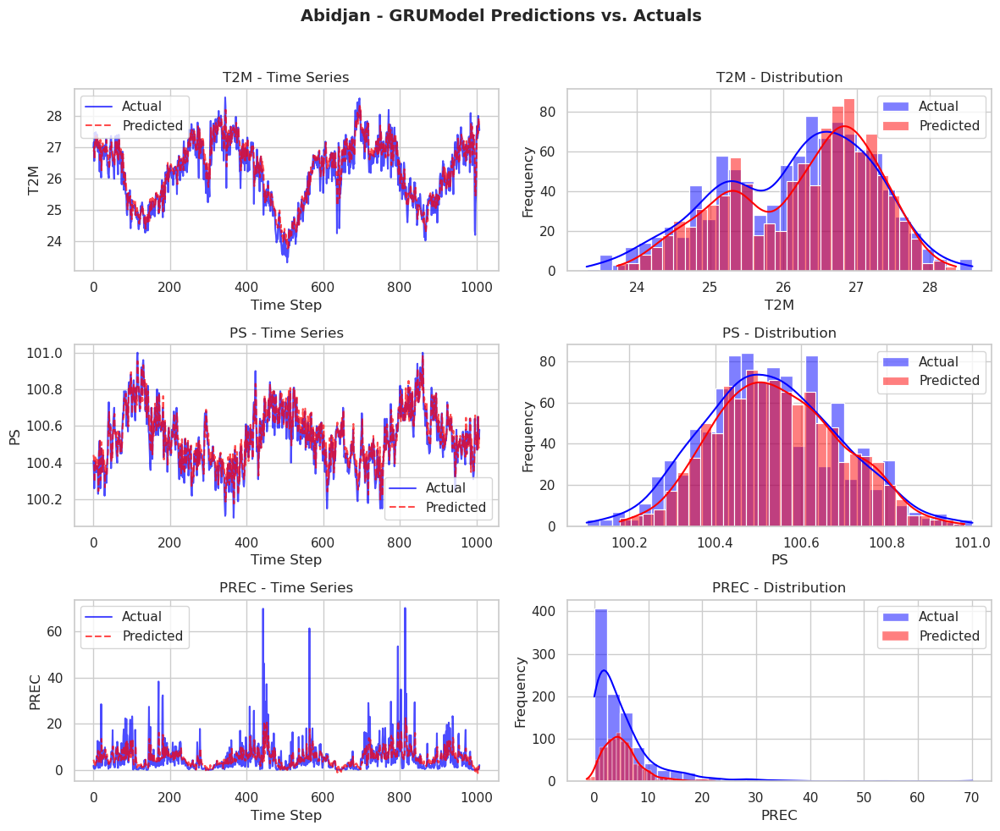

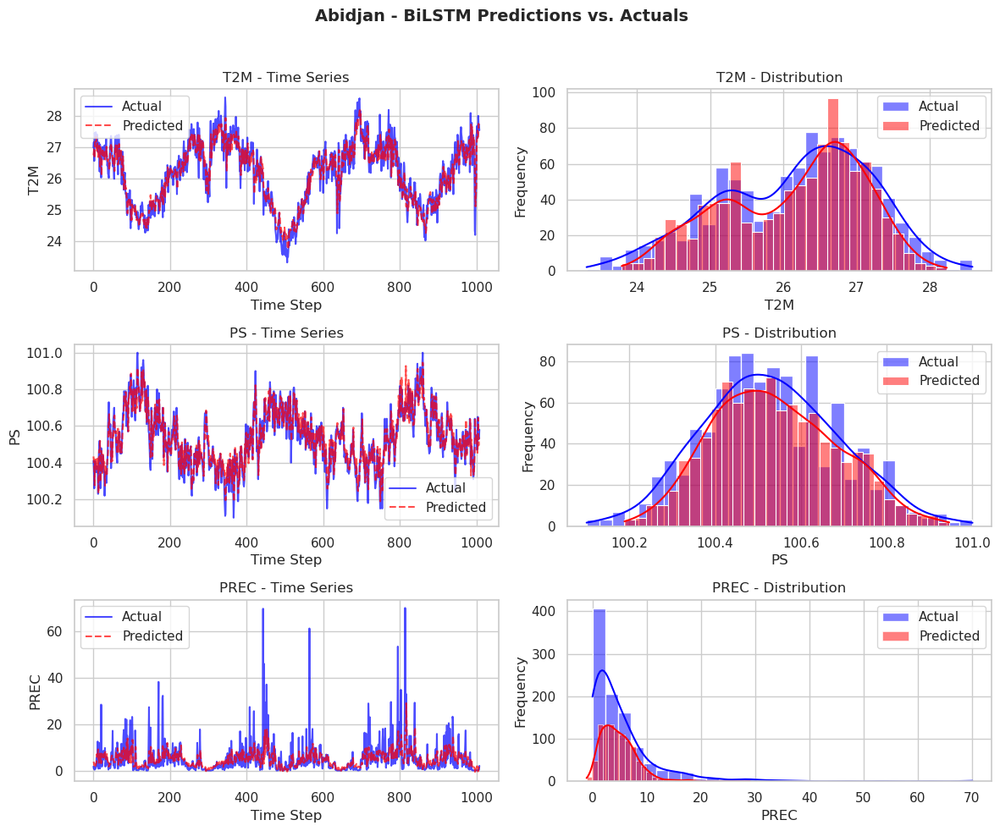

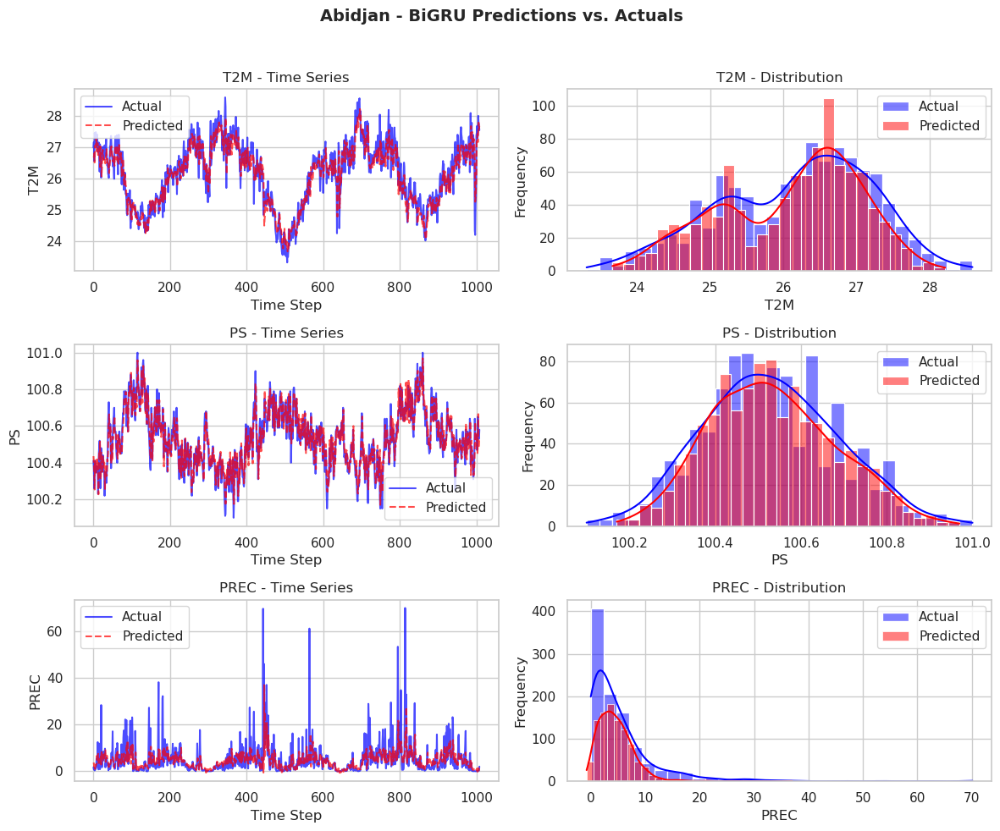

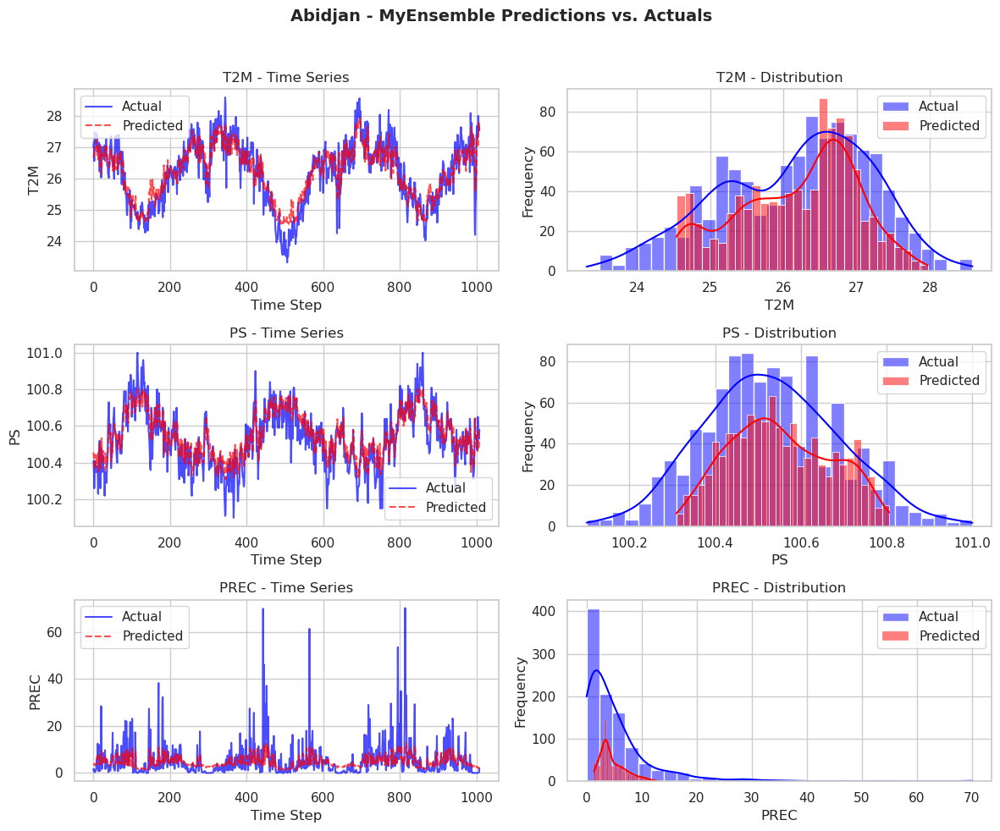

In [795]:
# # metrics_dic={"Abidjan":[]}
# all_metrics={"Kigali":{"lstm":[],"gru":[],"bilstm":[],"bigru":[],"ens_learn":[]},"Abidjan":{"lstm":[],"gru":[],"bilstm":[],"bigru":[],"ens_learn":[]}}
# test_loaders=[Kgl_test_loader,Abj_test_loader]
# for idx_dt, (idx_names, models_names)  in enumerate(all_metrics.items()):
#     for idx_m,(names, metrics_list) in enumerate(models_names .items()):
#         # print(evaluate_model(models[idx_m], test_loaders[idx_dt]))
#         metrics_list.append(evaluate_model(models[idx_m], test_loaders[idx_dt],scaler[idx_dt]))
#         # print(names,metrics_list)
#     # for mdl in models:
#     # break 
# all_metrics  
scaler_dict={"Kigali":[scaler_other_kgl, scaler_prec_kgl],"Abidjan":[scaler_other_abj, scaler_prec_abj]}
test_loader_list=[Kgl_test_loader,Abj_test_loader]
all_metrics=evaluate_and_plot(model_container, test_loader_list, scaler_dict, device)
all_metrics.to_csv("all_metrics_rnn.csv")

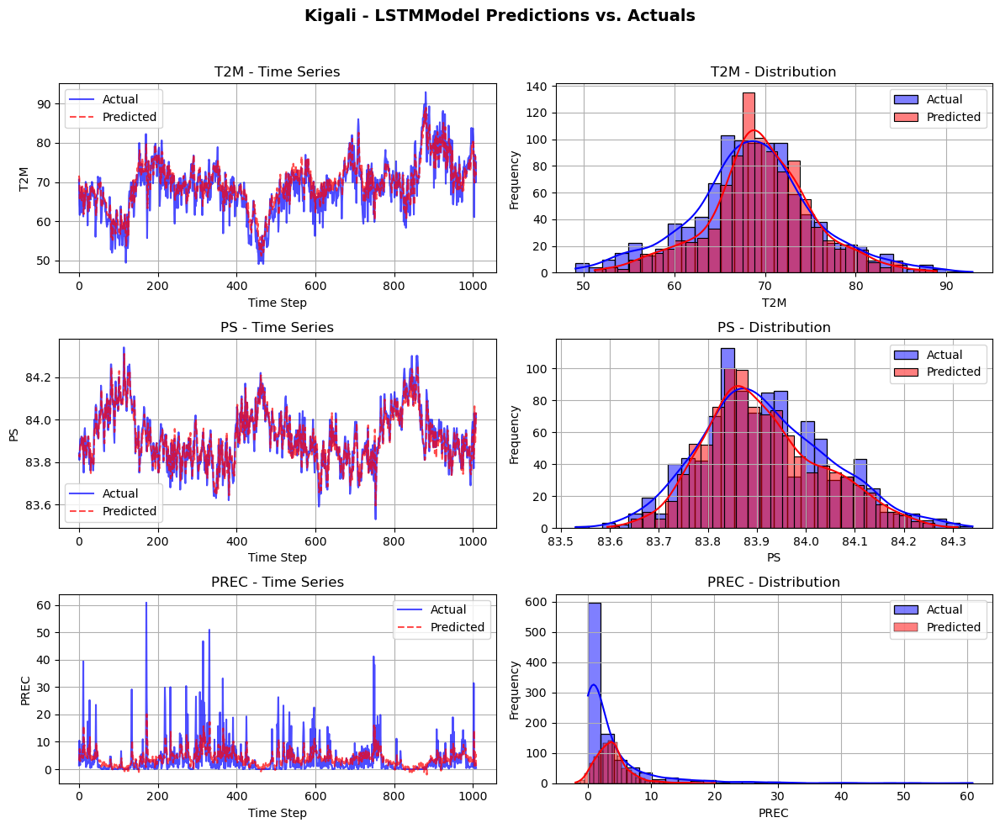

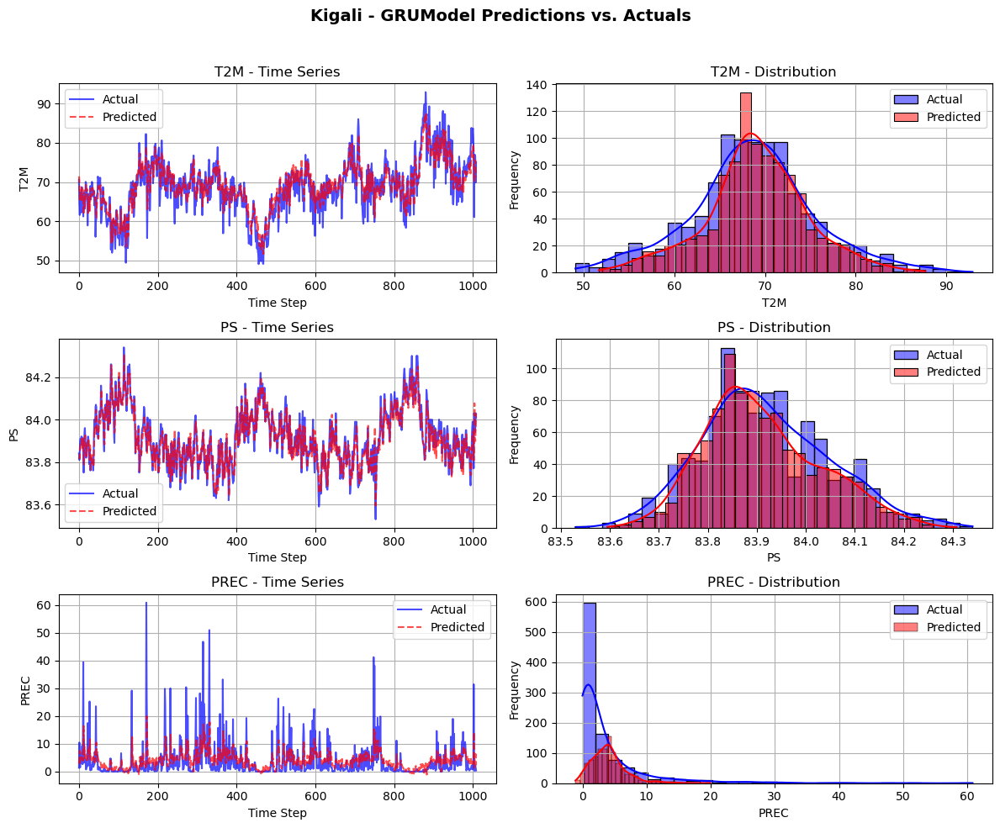

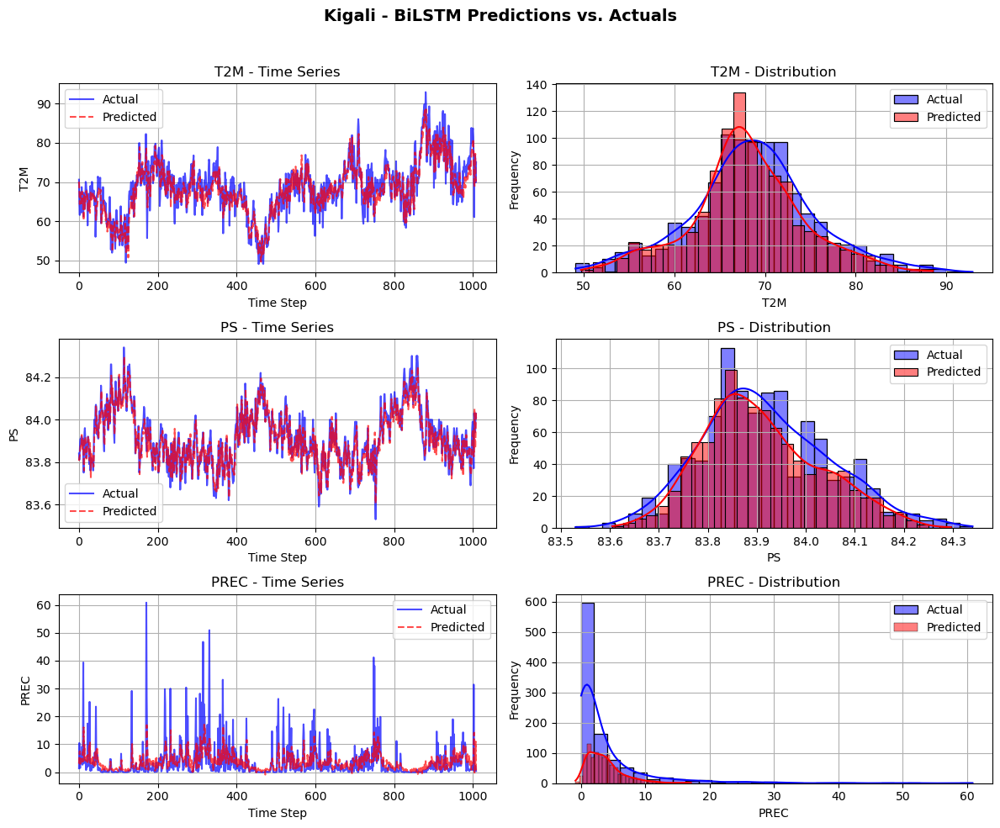

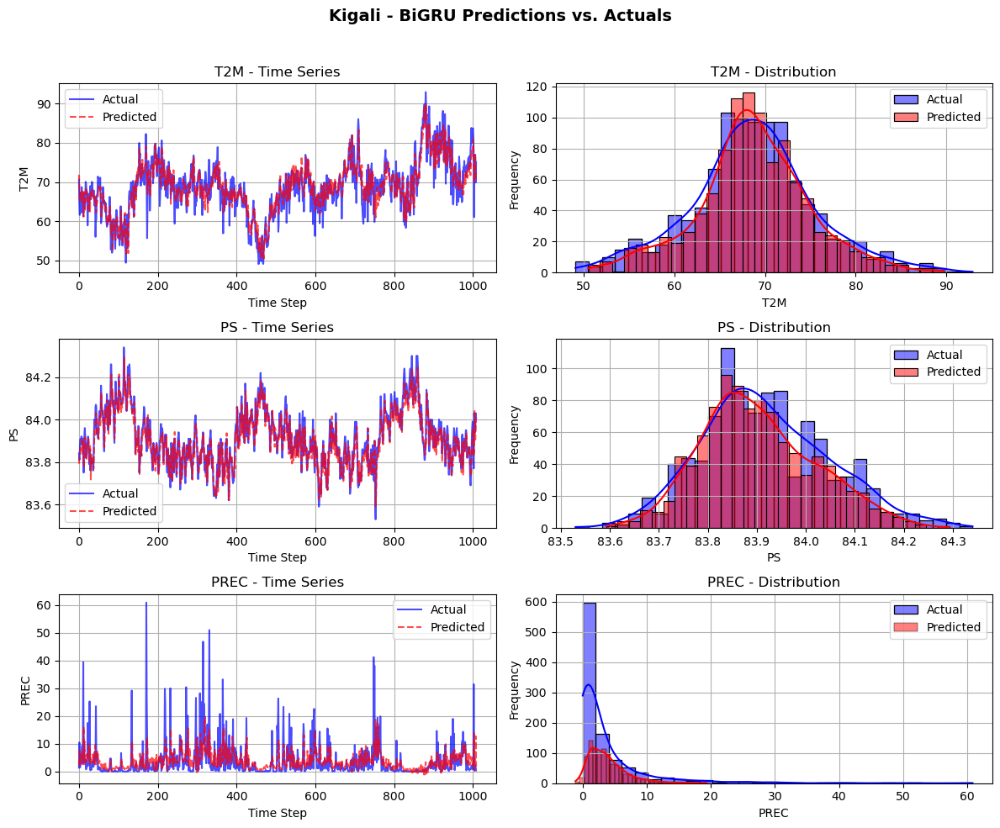

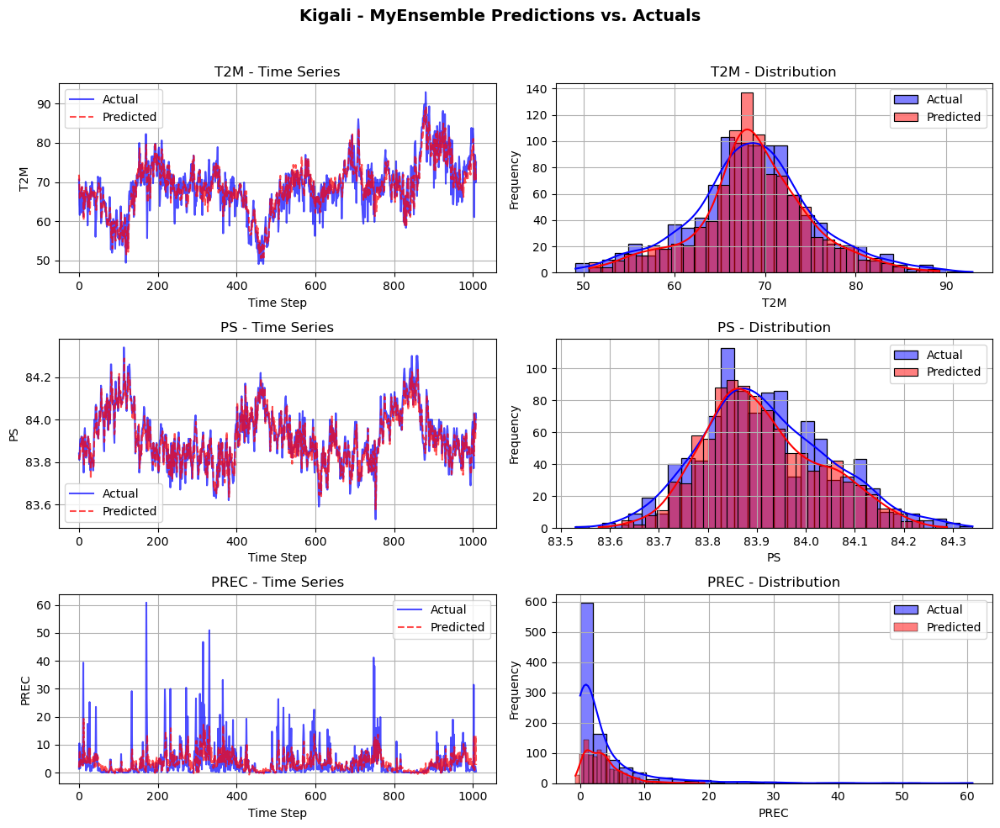

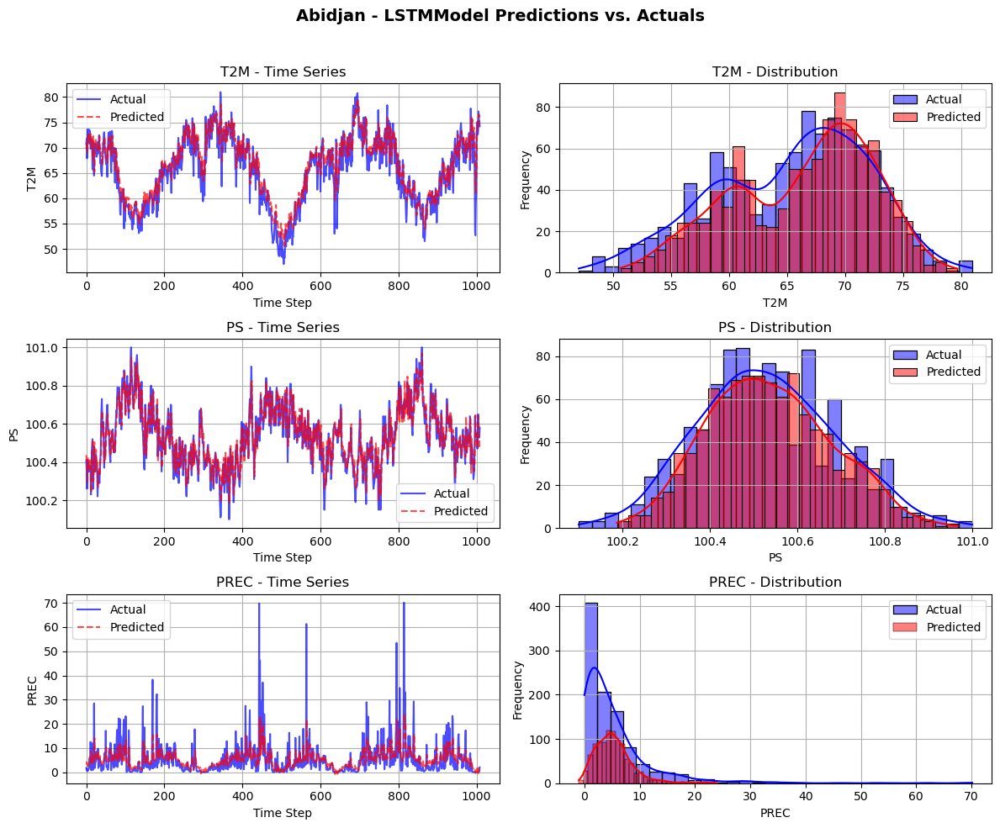

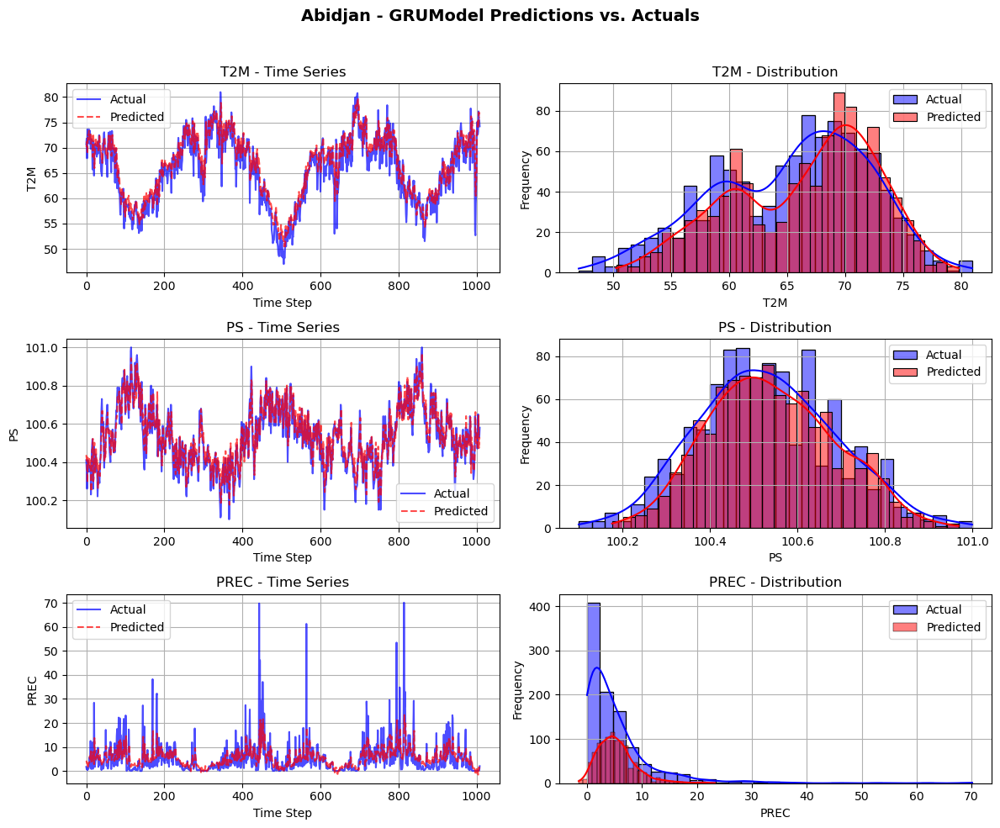

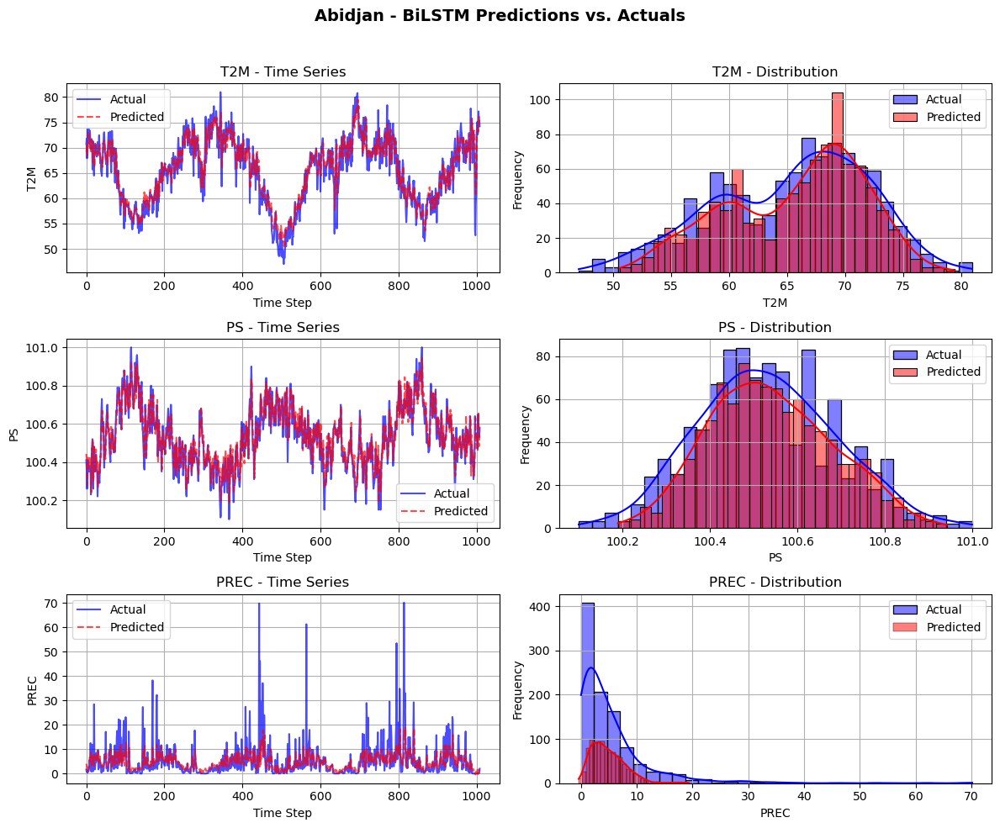

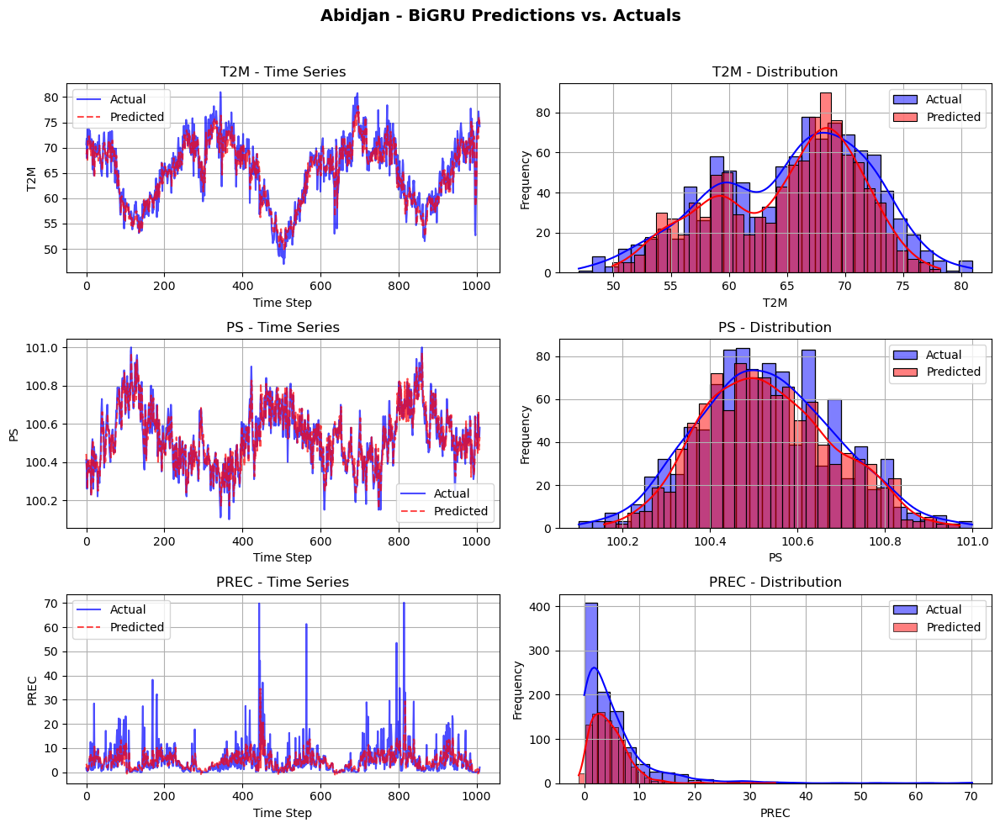

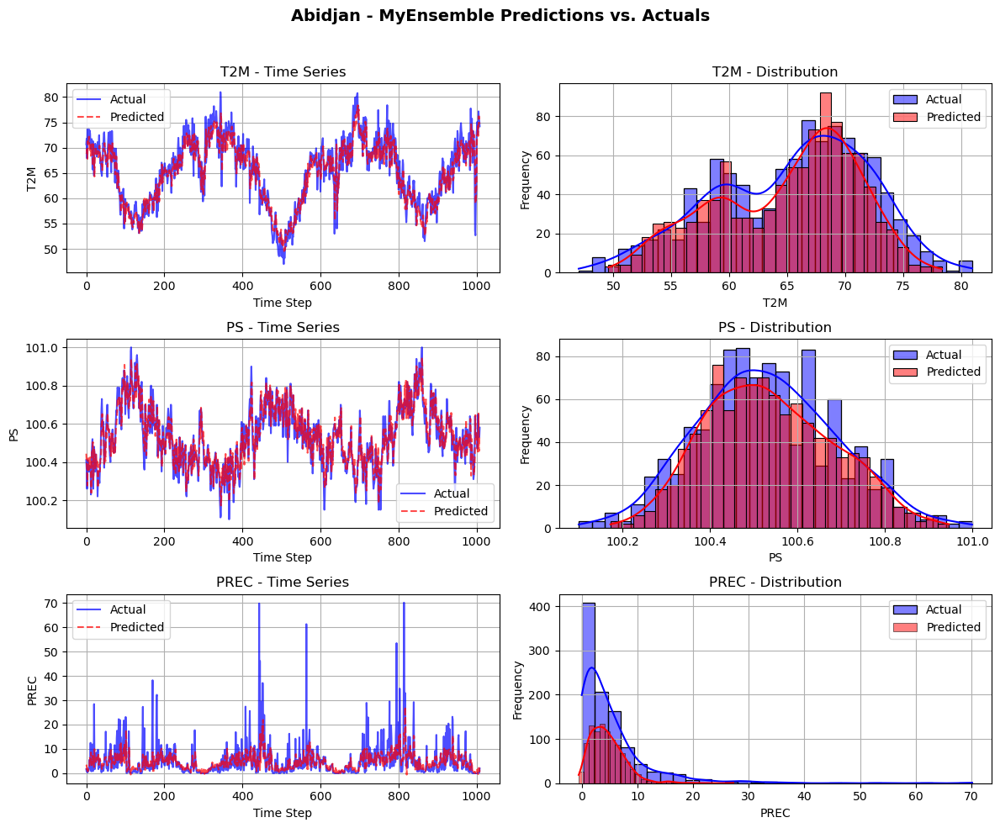

,City,Model,Variable,MSE,RMSE,MAE,R²,MAPE
0,Kigali,LSTMModel,T2M,12.4869,3.5337,2.7118,0.7416,4.0670
1,Kigali,LSTMModel,PS,0.0024,0.0491,0.0385,0.8593,0.0459
2,Kigali,LSTMModel,PREC,29.4953,5.4310,3.0459,0.2145,842.8203
3,Kigali,GRUModel,T2M,12.0403,3.4699,2.6750,0.7509,3.9882
4,Kigali,GRUModel,PS,0.0025,0.0496,0.0390,0.8564,0.0464
5,Kigali,GRUModel,PREC,29.4448,5.4263,3.1399,0.2158,902.8840
6,Kigali,BiLSTM,T2M,11.8499,3.4424,2.6935,0.7548,3.9444
7,Kigali,BiLSTM,PS,0.0025,0.0498,0.0393,0.8552,0.0468
8,Kigali,BiLSTM,PREC,29.0966,5.3941,2.9134,0.2251,714.2877
9,Kigali,BiGRU,T2M,11.8098,3.4365,2.6424,0.7556,3.9065


In [442]:
# # metrics_dic={"Abidjan":[]}
# all_metrics={"Kigali":{"lstm":[],"gru":[],"bilstm":[],"bigru":[],"ens_learn":[]},"Abidjan":{"lstm":[],"gru":[],"bilstm":[],"bigru":[],"ens_learn":[]}}
# test_loaders=[Kgl_test_loader,Abj_test_loader]
# for idx_dt, (idx_names, models_names)  in enumerate(all_metrics.items()):
#     for idx_m,(names, metrics_list) in enumerate(models_names .items()):
#         # print(evaluate_model(models[idx_m], test_loaders[idx_dt]))
#         metrics_list.append(evaluate_model(models[idx_m], test_loaders[idx_dt],scaler[idx_dt]))
#         # print(names,metrics_list)
#     # for mdl in models:
#     # break 
# all_metrics       
evaluate_and_plot(model_container, test_loader_list, scaler_dict, device)

In [110]:
# result=pd.DataFrame([metrics_lstm,metrics_gru,metrics_bilstm,metrics_bigrus],columns=['MAPE (%)','R²','MAE','RMSE','MSE'],index=['LSTM','GRU','BiLSTM','BiGRU'])
# result


### Kolmogorov Arnold Networks

In [313]:
import torch
import torch.nn.functional as F
import math


class KANLinear(torch.nn.Module):
    def __init__(
        self,
        in_features,
        out_features,
        grid_size=5,
        spline_order=3,
        scale_noise=0.1,
        scale_base=1.0,
        scale_spline=1.0,
        enable_standalone_scale_spline=True,
        base_activation=torch.nn.SiLU,
        grid_eps=0.02,
        grid_range=[-1, 1],
    ):
        super(KANLinear, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.grid_size = grid_size
        self.spline_order = spline_order

        h = (grid_range[1] - grid_range[0]) / grid_size
        grid = (
            (
                torch.arange(-spline_order, grid_size + spline_order + 1) * h
                + grid_range[0]
            )
            .expand(in_features, -1) # Create n grid for n features
            .contiguous() #ensures that the tensor is stored in memory in a contiguous manner, which improves performance for operations that require sequential memory access.
        )
        self.register_buffer("grid", grid)

        self.base_weight = torch.nn.Parameter(torch.Tensor(out_features, in_features))
        self.spline_weight = torch.nn.Parameter(
            torch.Tensor(out_features, in_features, grid_size + spline_order)
        )
        if enable_standalone_scale_spline:
            self.spline_scaler = torch.nn.Parameter(
                torch.Tensor(out_features, in_features)
            )
# We don't know out_features (Guess:2*in_features +1), the reason behind the per-batch structuration of self.spline_weight and the structuration of self.base_weight
        self.scale_noise = scale_noise
        self.scale_base = scale_base
        self.scale_spline = scale_spline
        self.enable_standalone_scale_spline = enable_standalone_scale_spline
        self.base_activation = base_activation()
        self.grid_eps = grid_eps
        self.reset_parameters()
# The parameters abbove are not really known
    def reset_parameters(self):
        torch.nn.init.kaiming_uniform_(self.base_weight, a=math.sqrt(5) * self.scale_base)
        with torch.no_grad():
            noise = (
                (
                    torch.rand(self.grid_size + 1, self.in_features, self.out_features)
                    - 1 / 2
                )
                * self.scale_noise
                / self.grid_size
            )
            self.spline_weight.data.copy_(
                (self.scale_spline if not self.enable_standalone_scale_spline else 1.0)
                * self.curve2coeff(
                    self.grid.T[self.spline_order : -self.spline_order],
                    noise,
                ) # Provide initial best values to the self.spline_weight (either scaled or not )
            )
            if self.enable_standalone_scale_spline:
                # torch.nn.init.constant_(self.spline_scaler, self.scale_spline)
                torch.nn.init.kaiming_uniform_(self.spline_scaler, a=math.sqrt(5) * self.scale_spline)

    def b_splines(self, x: torch.Tensor):
        """
        Compute the B-spline bases for the given input tensor.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_features).

        Returns:
            torch.Tensor: B-spline bases tensor of shape (batch_size, in_features, grid_size + spline_order).
        """
        assert x.dim() == 2 and x.size(1) == self.in_features

        grid: torch.Tensor = (
            self.grid
        )  # (in_features, grid_size + 2 * spline_order + 1)
        x = x.unsqueeze(-1)
        bases = ((x >= grid[:, :-1]) & (x < grid[:, 1:])).to(x.dtype)
        for k in range(1, self.spline_order + 1):
            bases = (
                (x - grid[:, : -(k + 1)])
                / (grid[:, k:-1] - grid[:, : -(k + 1)])
                * bases[:, :, :-1]
            ) + (
                (grid[:, k + 1 :] - x)
                / (grid[:, k + 1 :] - grid[:, 1:(-k)])
                * bases[:, :, 1:]
            )

        assert bases.size() == (
            x.size(0),
            self.in_features,
            self.grid_size + self.spline_order,
        )
        return bases.contiguous()

    def curve2coeff(self, x: torch.Tensor, y: torch.Tensor):
        """
        Compute the coefficients of the curve that interpolates the given points.
        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_features).
            y (torch.Tensor): Output tensor of shape (batch_size, in_features, out_features).
        Returns:
            torch.Tensor: Coefficients tensor of shape (out_features, in_features, grid_size + spline_order).
        """
        assert x.dim() == 2 and x.size(1) == self.in_features
        assert y.size() == (x.size(0), self.in_features, self.out_features)
        A = self.b_splines(x).transpose(
            0, 1
        )  # (in_features, batch_size, grid_size + spline_order)
        B = y.transpose(0, 1)  # (in_features, batch_size, out_features)
        # print("A shape:", A.shape)  # Should be (batch, n, m)
        # print("B shape:", B.shape)  # Should be (batch, n, out_features)

        solution = torch.linalg.lstsq(
            A, B
        ).solution  # (in_features, grid_size + spline_order, out_features)
        result = solution.permute(
            2, 0, 1
        )  # (out_features, in_features, grid_size + spline_order)

        assert result.size() == (
            self.out_features,
            self.in_features,
            self.grid_size + self.spline_order,
        )
        return result.contiguous()

    @property
    def scaled_spline_weight(self):
        return self.spline_weight * (
            self.spline_scaler.unsqueeze(-1)
            if self.enable_standalone_scale_spline
            else 1.0
        )
    def forward(self, x: torch.Tensor):
        assert x.size(-1) == self.in_features
        original_shape = x.shape
        x = x.reshape(-1, self.in_features)

        base_output = F.linear(self.base_activation(x), self.base_weight)
        spline_output = F.linear(
            self.b_splines(x).view(x.size(0), -1),
            self.scaled_spline_weight.view(self.out_features, -1),
        )
        output = base_output + spline_output

        output = output.reshape(*original_shape[:-1], self.out_features)
        return output

    @torch.no_grad()
    def update_grid(self, x: torch.Tensor, margin=0.01):
        assert x.dim() == 2 and x.size(1) == self.in_features
        batch = x.size(0)

        splines = self.b_splines(x)  # (batch, in, coeff)
        splines = splines.permute(1, 0, 2)  # (in, batch, coeff)
        orig_coeff = self.scaled_spline_weight  # (out, in, coeff)
        orig_coeff = orig_coeff.permute(1, 2, 0)  # (in, coeff, out)
        unreduced_spline_output = torch.bmm(splines, orig_coeff)  # (in, batch, out)
        unreduced_spline_output = unreduced_spline_output.permute(
            1, 0, 2
        )  # (batch, in, out)

        # sort each channel individually to collect data distribution
        x_sorted = torch.sort(x, dim=0)[0]
        grid_adaptive = x_sorted[
            torch.linspace(
                0, batch - 1, self.grid_size + 1, dtype=torch.int64, device=x.device
            )
        ]

        uniform_step = (x_sorted[-1] - x_sorted[0] + 2 * margin) / self.grid_size
        grid_uniform = (
            torch.arange(
                self.grid_size + 1, dtype=torch.float32, device=x.device
            ).unsqueeze(1)
            * uniform_step
            + x_sorted[0]
            - margin
        )

        grid = self.grid_eps * grid_uniform + (1 - self.grid_eps) * grid_adaptive
        grid = torch.concatenate(
            [
                grid[:1]
                - uniform_step
                * torch.arange(self.spline_order, 0, -1, device=x.device).unsqueeze(1),
                grid,
                grid[-1:]
                + uniform_step
                * torch.arange(1, self.spline_order + 1, device=x.device).unsqueeze(1),
            ],
            dim=0,
        )

        self.grid.copy_(grid.T)
        self.spline_weight.data.copy_(self.curve2coeff(x, unreduced_spline_output))

    def regularization_loss(self, regularize_activation=1.0, regularize_entropy=1.0):
        """
        Compute the regularization loss.

        This is a dumb simulation of the original L1 regularization as stated in the
        paper, since the original one requires computing absolutes and entropy from the
        expanded (batch, in_features, out_features) intermediate tensor, which is hidden
        behind the F.linear function if we want an memory efficient implementation.

        The L1 regularization is now computed as mean absolute value of the spline
        weights. The authors implementation also includes this term in addition to the
        sample-based regularization.
        """
        l1_fake = self.spline_weight.abs().mean(-1)
        regularization_loss_activation = l1_fake.sum()
        p = l1_fake / regularization_loss_activation
        regularization_loss_entropy = -torch.sum(p * p.log())
        return (
            regularize_activation * regularization_loss_activation
            + regularize_entropy * regularization_loss_entropy
        )


class KAN(torch.nn.Module):
    def __init__(
        self,
        layers_hidden,
        grid_size=5,
        spline_order=3,
        scale_noise=0.1,
        scale_base=1.0,
        scale_spline=1.0,
        base_activation=torch.nn.SiLU,
        grid_eps=0.02,
        grid_range=[-1, 1],
    ):
        super(KAN, self).__init__()
        self.grid_size = grid_size
        self.spline_order = spline_order

        self.layers = torch.nn.ModuleList()
        for in_features, out_features in zip(layers_hidden, layers_hidden[1:]):
            self.layers.append(
                KANLinear(
                    in_features,
                    out_features,
                    grid_size=grid_size,
                    spline_order=spline_order,
                    scale_noise=scale_noise,
                    scale_base=scale_base,
                    scale_spline=scale_spline,
                    base_activation=base_activation,
                    grid_eps=grid_eps,
                    grid_range=grid_range,
                )
            )

    def forward(self, x: torch.Tensor, update_grid=False):
        for layer in self.layers:
            if update_grid:
                layer.update_grid(x)
            x = layer(x)
        return x

    def regularization_loss(self, regularize_activation=1.0, regularize_entropy=1.0):
        return sum(
            layer.regularization_loss(regularize_activation, regularize_entropy)
            for layer in self.layers
        )

In [323]:
# scaler = MinMaxScaler(feature_range=(0,1))
def Make_tidydata_for_kan(data,scaler,data_type="full"):
    if data_type=="full":
        data= data.sort_index()
        data[data.columns] = scaler.fit_transform(data[data.columns])
        # print("data:",data.shape)
    # Splitting the dataset into training, validation, and test sets
    train_size = int(len(data)*0.8)
    val_size =int(train_size*0.10)
    #Train_val_test sets
    Xy_train = data[:train_size-val_size]
    Xy_val= data[train_size-val_size:train_size]
    Xy_test=data[train_size:]
    return [Xy_train,Xy_val,Xy_test]


In [331]:


def data_loading(Xy):
    # Define the data 
    X,y=Xy.values[:,:-1],Xy.values[:,-1]
    X = torch.tensor(X, dtype=torch.float32)  # Convert to float32
    y = torch.tensor(y, dtype=torch.float32)  # Convert to float32
    # Create DataLoader
    batch_size = 64
    _dataset = TensorDataset(X, y.reshape(-1, 1))
    _loader = DataLoader(_dataset, batch_size=batch_size, shuffle=True)
    return  _loader 

In [332]:
os.path.exists("/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Models")
# os.getcwd()

True

In [371]:
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler

var_to_pred = ['T2M','PS','PREC']

def train_test_loop_per_var(data, epochs,scaler, city="Kigali",layers_hidden=[9, 19,39, 1]):
    models = {}
    training_losses = {var: [] for var in var_to_pred}
    val_losses = {var: [] for var in var_to_pred}
    test_loaders = {var: [] for var in var_to_pred}
    dict_dates={var: [] for var in var_to_pred}
    for idx, var_name in enumerate(var_to_pred):
        # Work on a copy to avoid modifying the original data
        data_copy = data.copy()
        target_col = data_copy.pop(var_name)
        data_copy.insert(len(data_copy.columns), var_name, target_col)
        # 
        dates=data_copy.index.astype(str).tolist()
        # Create loaders
        list_data = Make_tidydata_for_kan(data_copy,scaler[idx])
        dict_dates[var_name].extend(Make_tidydata_for_kan(dates, scaler[idx],data_type="dates"))
        # train_loader, val_loader, test_loader = data_loading(np.array(list_data))
        train_loader, val_loader, test_loader = [data_loading(data) for data in list_data]

        test_loaders[var_name]=test_loader
        # Model Definition
        Kan_network = KAN(layers_hidden=layers_hidden).to(torch.float32)

        # Define loss and optimizer
        criterion = nn.MSELoss()  # Regression loss
        optimizer = torch.optim.Adam(Kan_network.parameters(), lr=0.001)
        Kan_network.train()
        # Epoch loop
        for epoch in range(epochs):
            epoch_train_loss = 0
            epoch_val_loss = 0

            # Training loop
            for X_batch, y_batch in train_loader:
                optimizer.zero_grad()
                #reg=sum(torch.norm(p) ** 2 for p in Kan_network.parameters()) 
                y_pred = Kan_network(X_batch, update_grid=False)  # Only update grid on first epoch
                loss = criterion(y_pred, y_batch) #+0.001*reg
                loss.backward()
                optimizer.step()
                epoch_train_loss += loss.item()

            loss_cum_train = epoch_train_loss / len(train_loader)
            training_losses[var_name].append(loss_cum_train)

            # Validation loop
            with torch.no_grad():
                for X_batch, y_batch in val_loader:
                    y_pred_ = Kan_network(X_batch, update_grid=False)  # No need to update grid in validation
                    loss = criterion(y_pred_, y_batch)
                    epoch_val_loss += loss.item()
                
                loss_cum_val = epoch_val_loss / len(val_loader)
                val_losses[var_name].append(loss_cum_val)

            if epoch % 50 == 0:
                print(f"Epoch [{epoch}/{epochs}], Variable: {var_name} MSE Train Loss: {loss_cum_train:.4f}")
                print(f"MSE Validation Loss: {loss_cum_val:.4f}")

        print(f"Training complete for {var_name} {city}! 🚀")
        models[var_name] = Kan_network
        torch.save(Kan_network,f"/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Models/{city}_Kan_network_{var_name}.pt")
    return models,test_loaders, training_losses, val_losses,dict_dates


In [370]:
# Kan_network.parameter
# # 

In [382]:
# Scaler
scaler1 = [MinMaxScaler(feature_range=(-1,1) if i==1 else (0,1)) for i in [0,1,2]]
scaler2 = [MinMaxScaler(feature_range=(-1,1) if i==1 else (0,1)) for i in [0,1,2]]
# Training for Abidjan data
data_Abj, epochs=Abj_dt,100
models_Abj,test_loaders_Abj, training_losses_Abj, val_losses_Abj,dict_dates_Abj=train_test_loop_per_var(data_Abj, epochs,scaler1, city="Abidjan",layers_hidden=[9, 19, 1])
# Training for Kigali data
data_Kgl=Kgl_dt
models_Kgl,test_loaders_Kgl, training_losses_Kgl, val_losses_Kgl,dict_dates_Kgl=train_test_loop_per_var(data_Kgl, epochs,scaler2,city="Kigali", layers_hidden=[9, 19, 1])

Epoch [0/100], Variable: T2M MSE Train Loss: 0.0519
MSE Validation Loss: 0.0255
Epoch [50/100], Variable: T2M MSE Train Loss: 0.0001
MSE Validation Loss: 0.0000
Training complete for T2M Abidjan! 🚀
Epoch [0/100], Variable: PREC MSE Train Loss: 0.4331
MSE Validation Loss: 0.1107
Epoch [50/100], Variable: PREC MSE Train Loss: 0.0102
MSE Validation Loss: 0.0152
Training complete for PREC Abidjan! 🚀
Epoch [0/100], Variable: PS MSE Train Loss: 0.0899
MSE Validation Loss: 0.0270
Epoch [50/100], Variable: PS MSE Train Loss: 0.0117
MSE Validation Loss: 0.0155
Training complete for PS Abidjan! 🚀
Epoch [0/100], Variable: T2M MSE Train Loss: 0.0641
MSE Validation Loss: 0.0265
Epoch [50/100], Variable: T2M MSE Train Loss: 0.0000
MSE Validation Loss: 0.0000
Training complete for T2M Kigali! 🚀
Epoch [0/100], Variable: PREC MSE Train Loss: 0.4876
MSE Validation Loss: 0.1589
Epoch [50/100], Variable: PREC MSE Train Loss: 0.0106
MSE Validation Loss: 0.0387
Training complete for PREC Kigali! 🚀
Epoch [0/

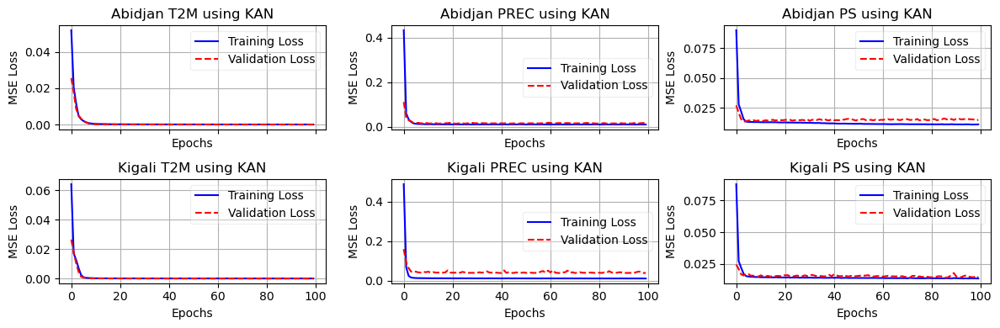

In [383]:
import matplotlib.pyplot as plt

# Define city-specific data
cities = ["Abidjan", "Kigali"]
training_losses = [training_losses_Abj, training_losses_Kgl]
val_losses = [val_losses_Abj, val_losses_Kgl]

# Create subplots
fig, axes = plt.subplots( len(cities),len(var_to_pred), figsize=(12, 4), sharex=True, sharey=False)

for row, (city, train_loss, val_loss) in enumerate(zip(cities, training_losses, val_losses)):
    for col, var in enumerate(var_to_pred):
        ax = axes[row, col]
        
        # Plot training & validation loss
        ax.plot(train_loss[var], label="Training Loss", color="blue")
        ax.plot(val_loss[var], label="Validation Loss", color="red", linestyle="--")
        
        ax.set_title(f"{city} {var} using KAN")
        ax.set_xlabel("Epochs")
        ax.set_ylabel("MSE Loss")
        ax.legend(framealpha=0.3)
        # Adjust text transparency
        if var=="PREC" and city in ["Kigali","Abidjan"]:
            ax.legend(framealpha=0.3,loc="center right")
            # legend = ax.legend(framealpha=0.3)  # Set background transparency
            # for text in legend.get_texts():
            #     text.set_alpha(0.9)  
        ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


In [240]:
# models_Kgl

In [374]:
dict_m={"Abidjan":[models_Abj,test_loaders_Abj,dict_dates_Abj], "Kigali": [models_Kgl,test_loaders_Kgl, dict_dates_Kgl]}
cities = ["Abidjan", "Kigali"]
scalers=[scaler1,scaler2]

In [670]:

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def kan_prediction_plots(dict_m, cities, scalers,model_name="KAN",var_to_pred = None,obs_length=14):
    metrics_list = []
    for idx_d,city in enumerate(cities):
         # Create subplots for visualization
        scaler=scalers[idx_d]
        fig, axes = plt.subplots( 3,2, figsize=(12, 10))
        fig.suptitle(f"{city}  {model_name} Predictions vs. Actuals ", fontsize=14, fontweight="bold")
        for col, var_name in enumerate(var_to_pred):
            model = dict_m[city][0][var_name]
            model.eval()  
            test_loader = dict_m[city][1][var_name][0]
            dates = dict_m[city][2][var_name][-1][obs_length:]
            
            y_true_list = []
            y_pred_list = []
            
            with torch.no_grad():
                for X_batch, y_batch in test_loader:
                    X_batch, y_batch = X_batch.to(device), y_batch.to(device).squeeze()
                    if model_name!="KAN":
                        output,_ = model(X_batch)
                        outputs=output[:, -1,:].reshape(-1, 1)
                    else:
                        outputs= model(X_batch)

                    y_true_list.append(y_batch.cpu().numpy())
                    y_pred_list.append(outputs.cpu().numpy())

            # Convert lists to NumPy arrays
            y_true = np.concatenate(y_true_list)
            y_pred = np.concatenate(y_pred_list)
            # print(y_true .shape, y_pred.shape)
            # Inverse transform
            dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2]-1 ))
            actuals_padded = np.hstack([dummy_features, y_true.reshape(-1, 1)])
            predictions_padded = np.hstack([dummy_features, y_pred.reshape(-1, 1)])
            # print("actuals_padded shape:",actuals_padded.shape, "Xbatch shape:", X_batch.shape,"predictions_padded shape:",predictions_padded.shape)
            actuals_ = scaler[col].inverse_transform(actuals_padded)[:, -1]
            predictions_ = scaler[col].inverse_transform(predictions_padded)[:, -1]
            # print( predictions_ [:10],actuals_ [:10]) 
            # Compute metrics
            mse_ = np.mean((actuals_ - predictions_) ** 2)
            rmse_ = np.sqrt(mse_)
            mae_ = np.mean(np.abs(actuals_ - predictions_))
            r2_ = 1 - (np.sum((actuals_ - predictions_) ** 2) / np.sum((actuals_ - np.mean(actuals_)) ** 2))

            mask = actuals_ != 0
            mape_ = np.mean(np.abs((actuals_[mask] - predictions_[mask]) / actuals_[mask])* 100) if mask.any() else np.nan

            # Store metrics
            metrics_list.append({
                "City": city,
                "Model": f"{model_name}",
                "Variable": var_name,
                "MSE": round(mse_,4),
                "RMSE": round(rmse_,4),
                "MAE": round(mae_,4),
                "R²": round(r2_,4),
                "MAPE": round(mape_,4)
            })
            # --- Subplot 1: Line Plot ---
            # dates=
            axes[col,0].plot(dates, actuals_, label="Actual", color="blue", alpha=0.7)
            axes[col,0].plot(dates, predictions_, label="Predicted", color="red", linestyle="dashed", alpha=0.7)
            axes[col,0].set_title(f"{var_name} - Time Series")
            axes[col,0].set_xlabel("Time Step")
            axes[col,0].set_ylabel(var_name)
            axes[col,0].legend(framealpha=0.5)
            axes[col,0].xaxis.set_major_locator(mdates.DayLocator(interval=200))  # Show every 7th day
            axes[col,0].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))  # Format: YYYY-MM-DD
            # axes[col, 0].tick_params(axis="x", rotation=45)  # ✅ Correct


            # --- Subplot 2: Histogram ---
            sns.histplot(actuals_, label="Actual", color="blue", kde=True, bins=30, alpha=0.5, ax=axes[col,1])
            sns.histplot(predictions_, label="Predicted", color="red", kde=True, bins=30, alpha=0.5, ax=axes[col,1])
            axes[col,1].set_title(f"{var_name} - Distribution")
            axes[col,1].set_xlabel(var_name)
            axes[col,1].set_ylabel("Frequency")
            axes[col,1].legend(framealpha=0.5)
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit suptitle
        plt.savefig(f"{city}_{var_name}_{model_name}.png")
        plt.show()
        # print(idx_d)
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_list)
    return metrics_df


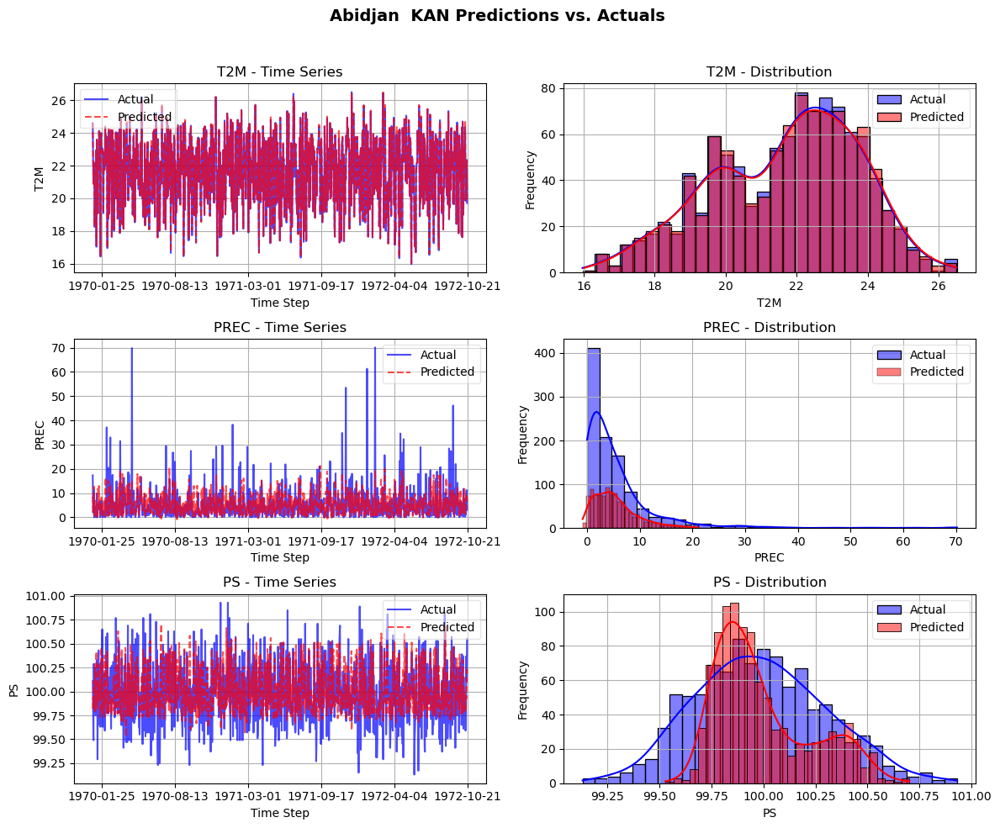

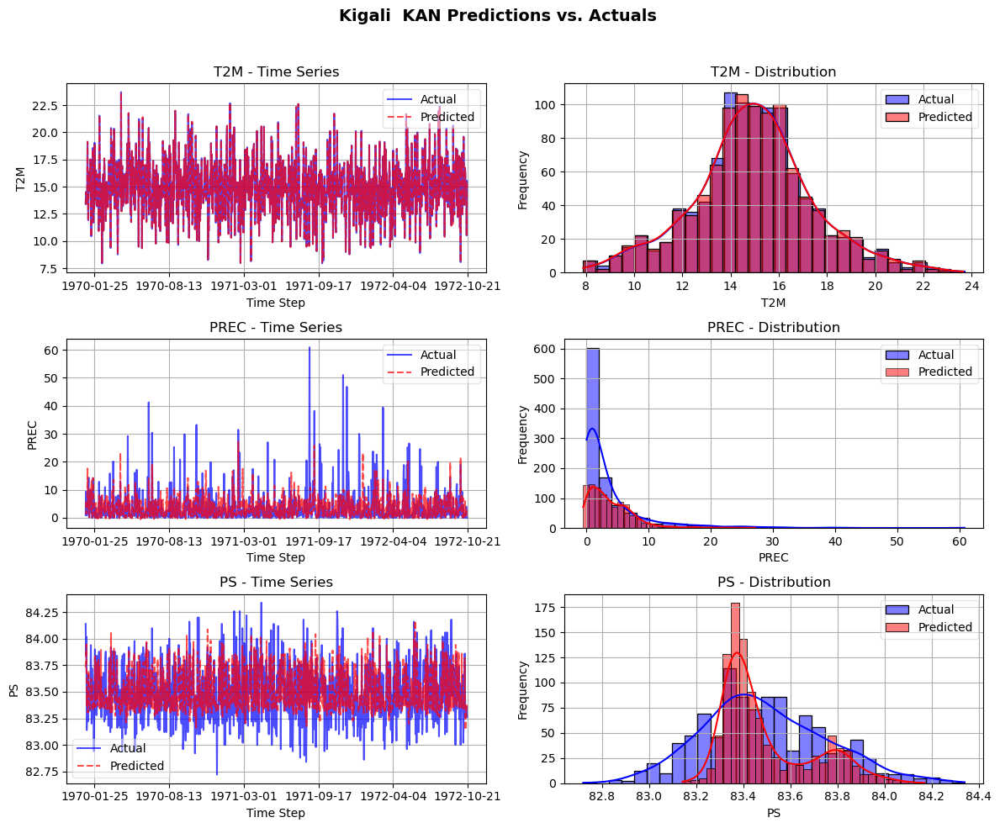

In [458]:
# models_Abj

kan_metrics=kan_prediction_plots(dict_m, cities,scalers)
kan_metrics.to_csv("kan_metrics.csv")

In [155]:
# dict_dates_Kgl['T2M'][-1]


### Robustness

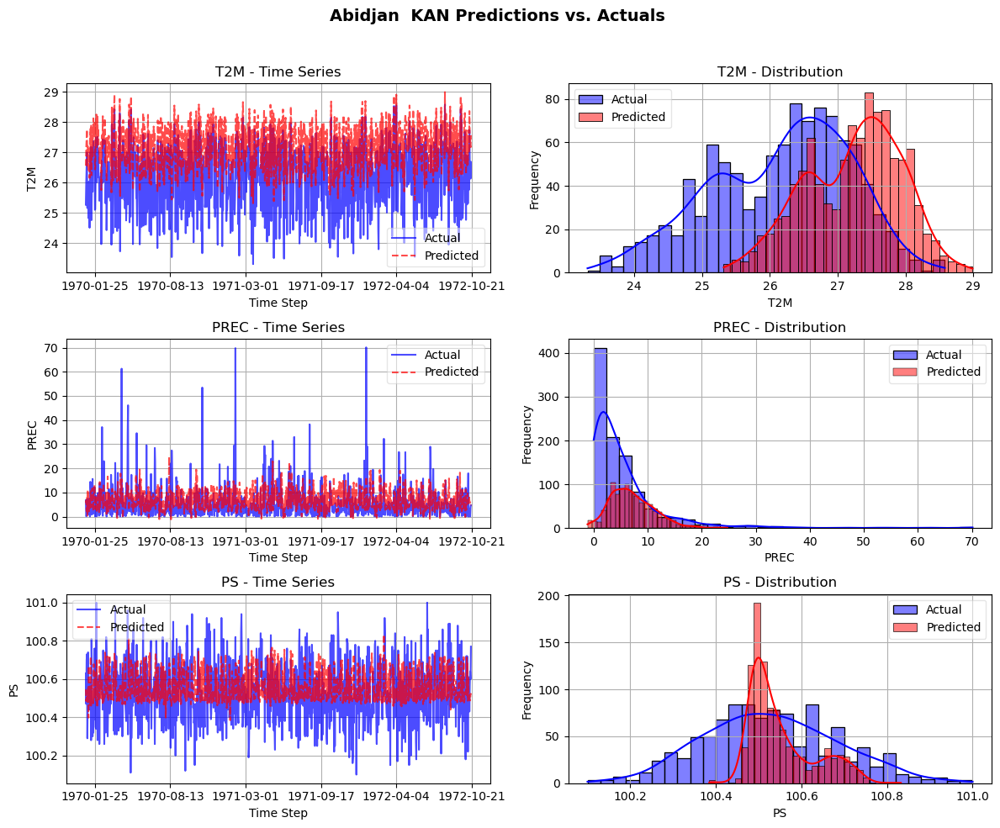

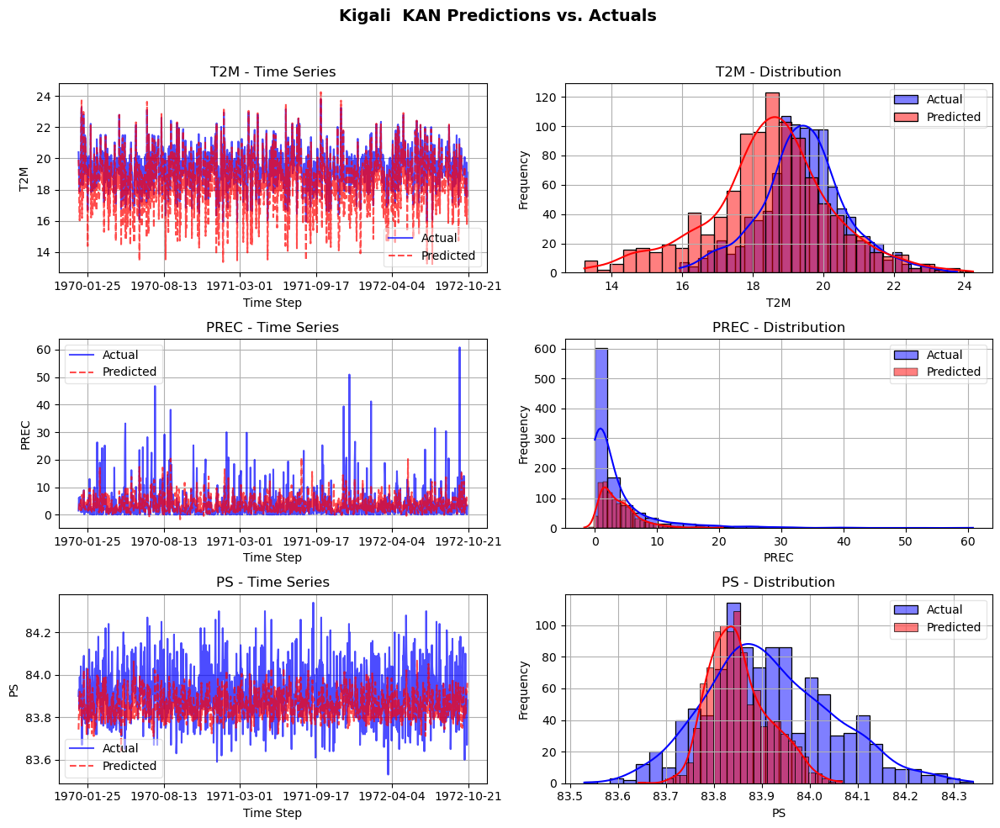

In [449]:
dict_mixed={"Abidjan":[models_Kgl,test_loaders_Abj,dict_dates_Abj], "Kigali": [models_Abj,test_loaders_Kgl, dict_dates_Kgl]}
cities = ["Abidjan", "Kigali"]
scalers=[scaler1,scaler2]
robust_kan_=kan_prediction_plots(dict_mixed, cities,scalers)
robust_kan_.to_csv("Robustness_kan_metrics.csv")

In [446]:
import copy
model_container_copy=copy.deepcopy(model_container)
container_prime={"Kigali":[],"Abidjan":[]}
container_prime["Kigali"].extend(model_container_copy["Abidjan"])
container_prime["Abidjan"].extend(model_container_copy["Kigali" ])
container_prime                            

{'Kigali': [LSTMModel(
    (lstm): LSTM(10, 94, batch_first=True)
    (dropout): Dropout(p=0.2, inplace=False)
    (fc): Linear(in_features=94, out_features=3, bias=True)
  ),
  GRUModel(
    (gru): GRU(10, 94, batch_first=True)
    (dropout): Dropout(p=0.2, inplace=False)
    (fc): Linear(in_features=94, out_features=3, bias=True)
  ),
  BiLSTM(
    (lstm): LSTM(10, 94, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
    (fc): Linear(in_features=188, out_features=3, bias=True)
  ),
  BiGRU(
    (gru): GRU(10, 94, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
    (fc): Linear(in_features=188, out_features=3, bias=True)
  ),
  MyEnsemble(
    (lstm_model): LSTMModel(
      (lstm): LSTM(10, 94, batch_first=True)
      (dropout): Dropout(p=0.2, inplace=False)
      (fc): Linear(in_features=94, out_features=3, bias=True)
    )
    (gru_model): GRUModel(
      (gru): GRU(10, 94, batch_first=True)
      (dropout): Dropout(p=0.2, inplace=False)
      (fc): 

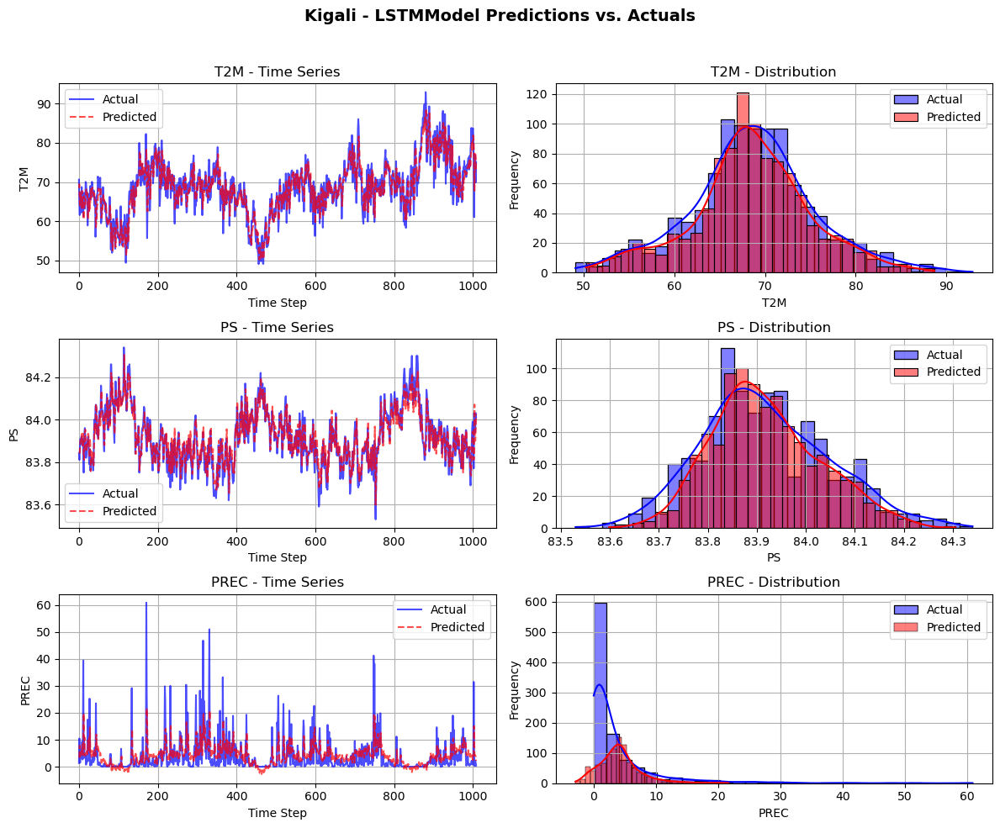

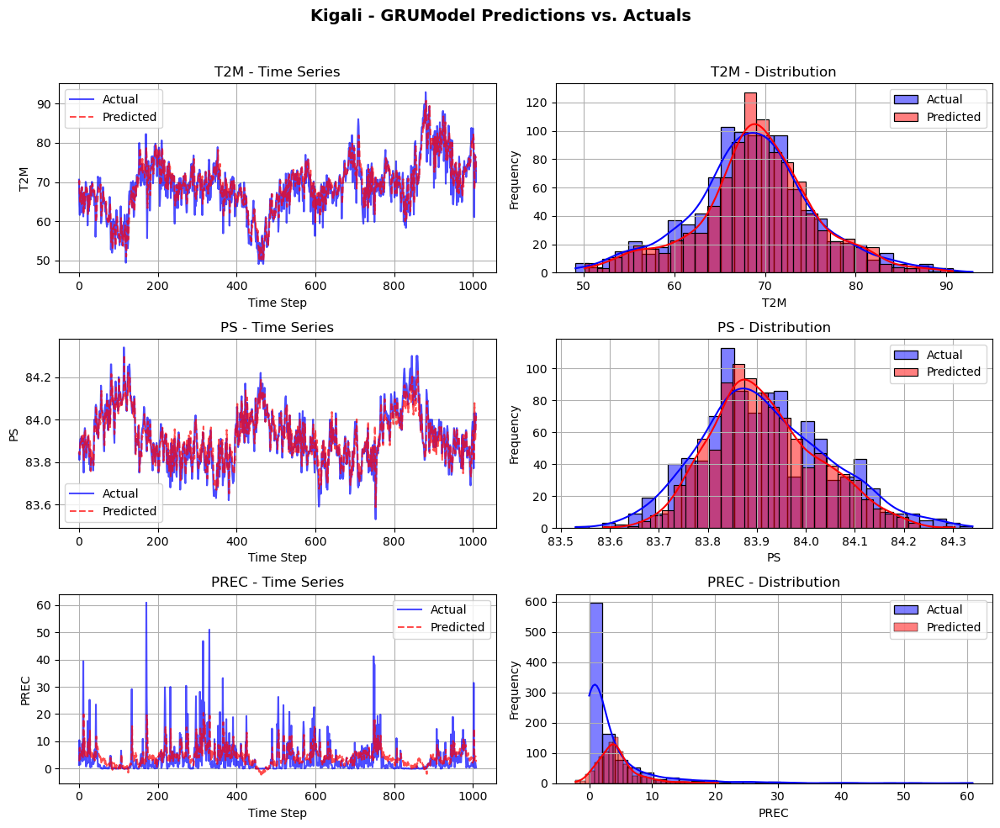

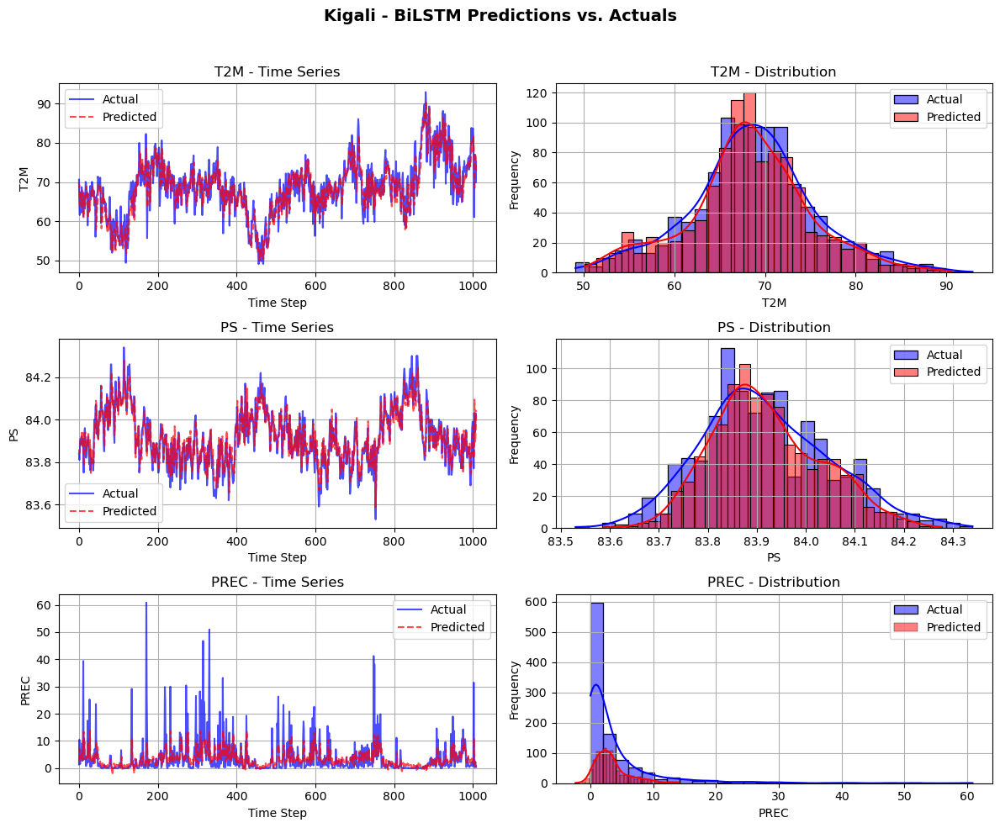

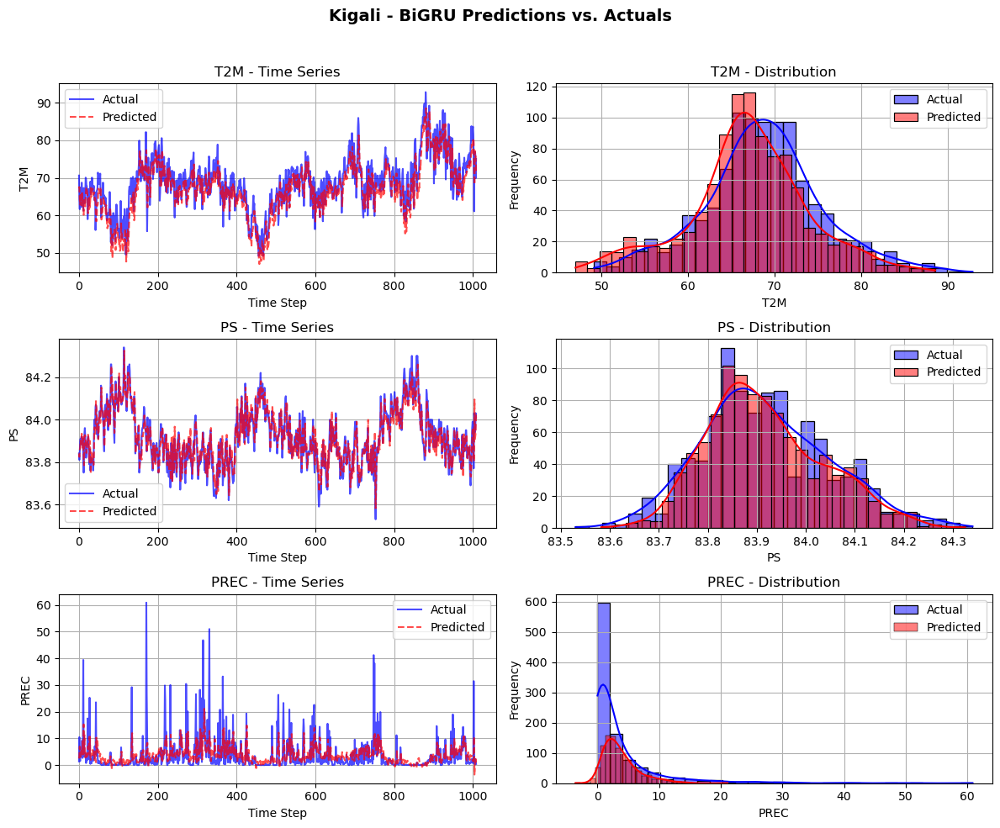

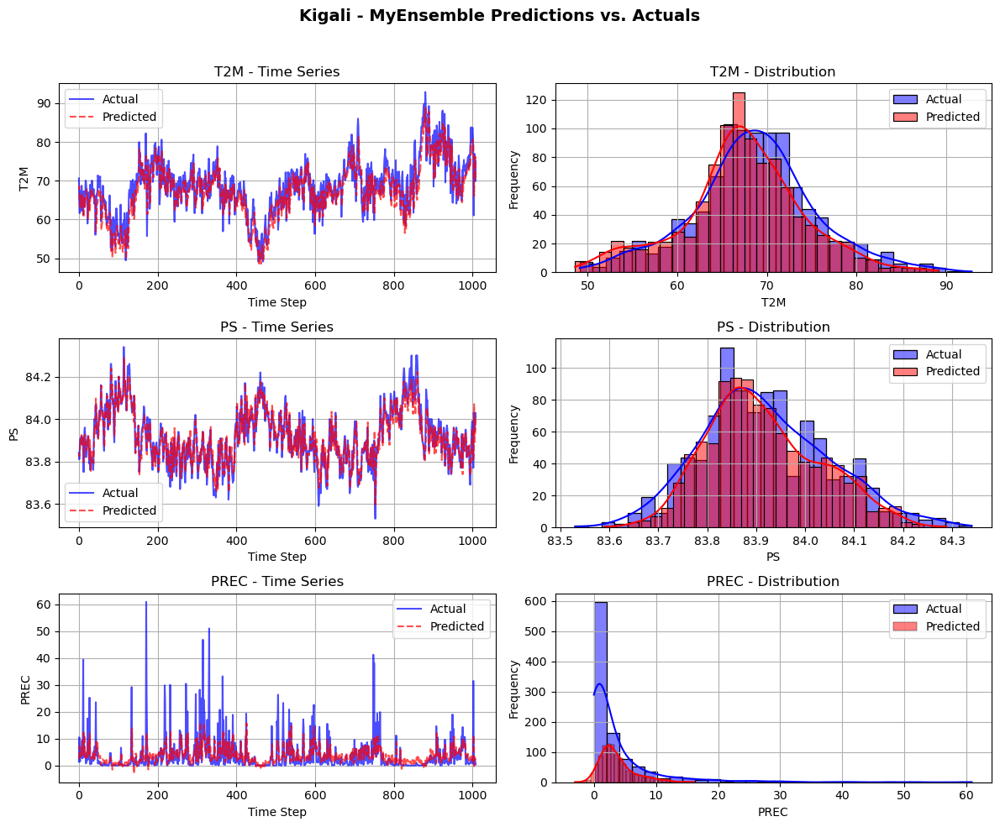

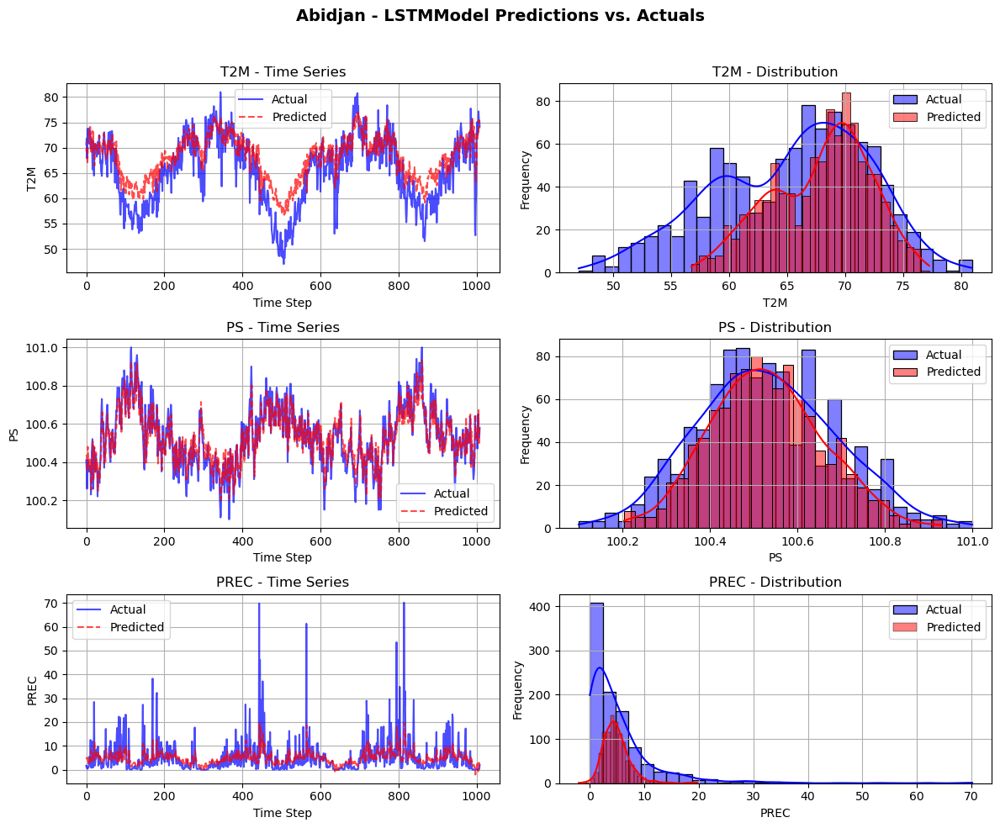

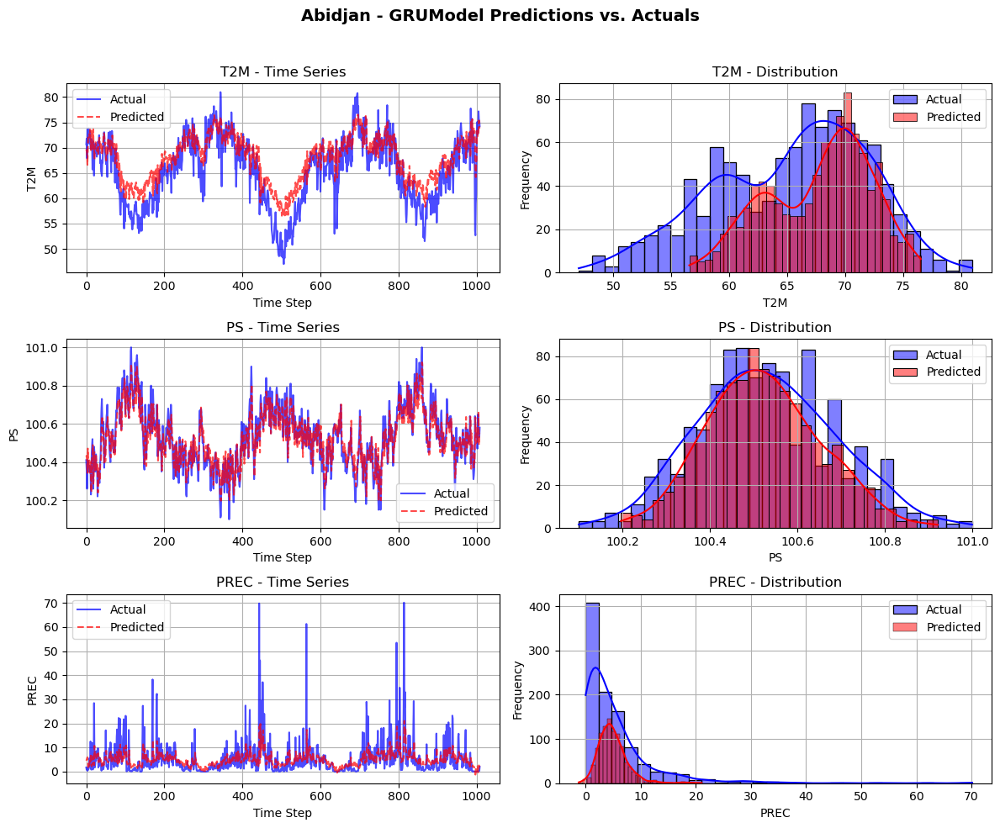

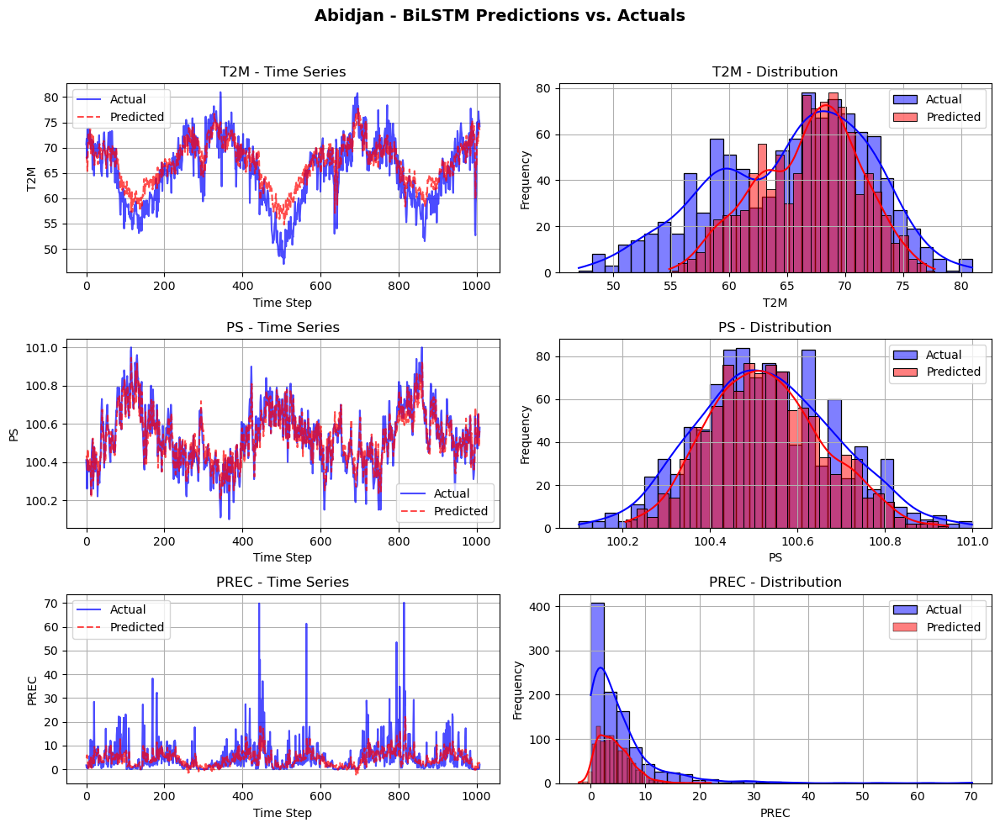

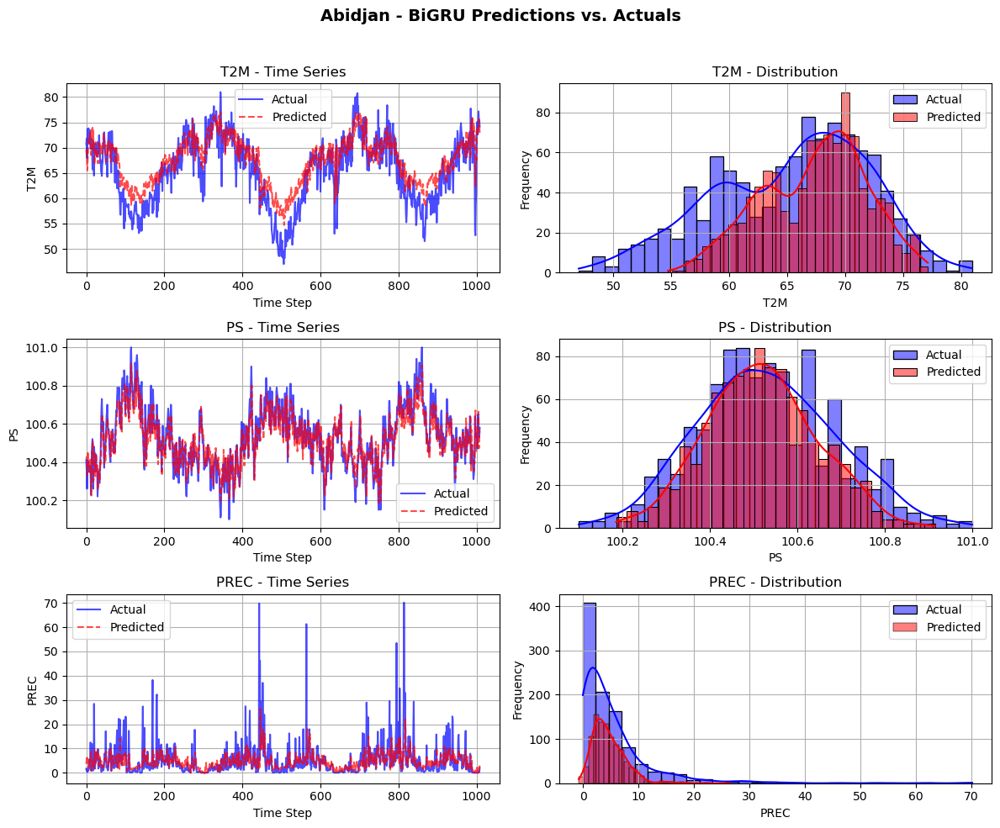

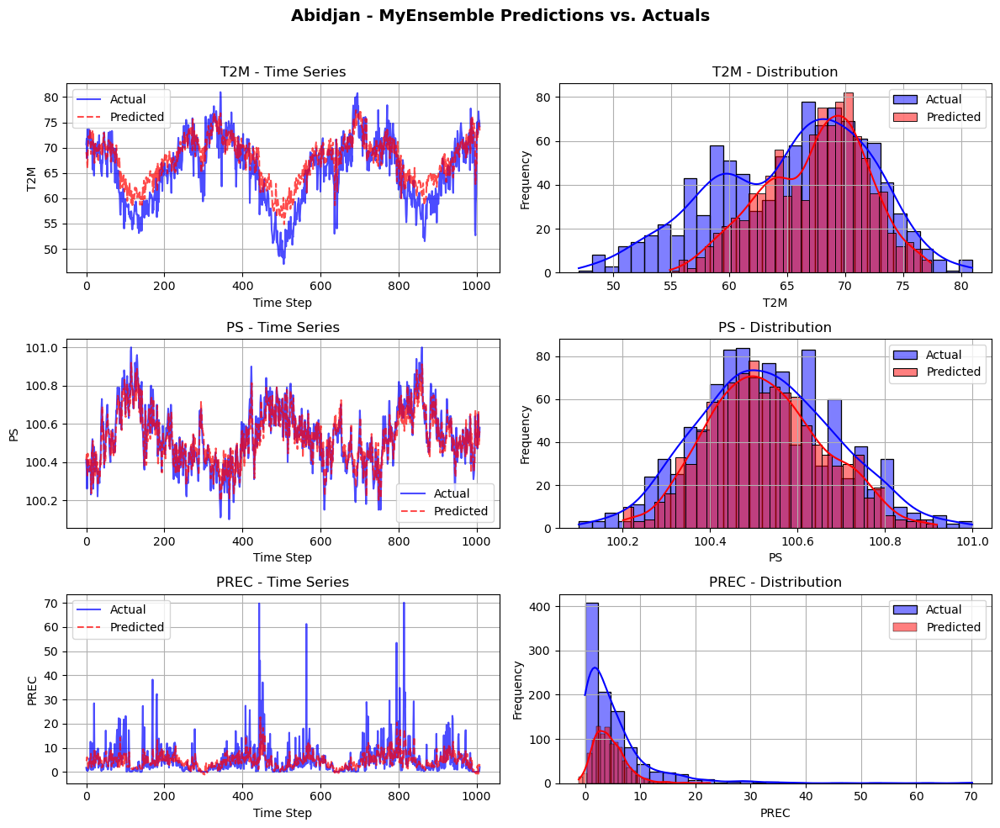

In [448]:
scaler_dict={"Kigali":[scaler_other_kgl, scaler_prec_kgl],"Abidjan":[scaler_other_abj, scaler_prec_abj]}
test_loader_list=[Kgl_test_loader,Abj_test_loader]
robustness_all_metrics=evaluate_and_plot(container_prime , test_loader_list, scaler_dict, device)
robustness_all_metrics.to_csv("robustness_all_metrics_rnn.csv")

### TKAN

In [672]:

import torch
import torch.nn as nn
import torch.nn.functional as F

class FixedSplineActivation(nn.Module):
    def __init__(self, exponent: float = 1.0, max_exponent: float = 9.0):
        super(FixedSplineActivation, self).__init__()
        self.exponent = torch.tensor(exponent, dtype=torch.float32)
        self.max_exponent = torch.tensor(max_exponent, dtype=torch.float32)
        self.epsilon = torch.finfo(torch.float32).eps
        self.exponent = torch.clamp(self.exponent, -self.max_exponent, self.max_exponent)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        inputs_safe = torch.clamp(inputs, self.epsilon, 1.0)
        return torch.pow(inputs_safe, self.exponent)

    def extra_repr(self) -> str:
        return f'exponent={{self.exponent}}, max_exponent={{self.max_exponent}}'

class PowerSplineActivation(nn.Module):
    def __init__(self, initial_exponent: float = 1.0, epsilon: float = 1e-7, max_exponent: float = 9.0, trainable: bool = True):
        super(PowerSplineActivation, self).__init__()
        self.epsilon = epsilon
        self.max_exponent = torch.tensor(max_exponent, dtype=torch.float32)
        self.trainable = trainable

        self.exponent = nn.Parameter(torch.tensor(initial_exponent, dtype=torch.float32), requires_grad=trainable)
        self.bias = nn.Parameter(torch.zeros(1), requires_grad=trainable)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        clipped_exponent = torch.clamp(self.exponent, -self.max_exponent, self.max_exponent)
        x_safe = torch.clamp(inputs + self.bias, self.epsilon, 1.0)
        return torch.pow(x_safe, clipped_exponent)

    def extra_repr(self) -> str:
        return f'initial_exponent={{self.exponent}}, epsilon={{self.epsilon}}, max_exponent={{self.max_exponent}}, trainable={{self.trainable}}'

class LinspaceInitializer:
    def __init__(self, start: float, stop: float, num: int):
        self.start = start
        self.stop = stop
        self.num = num

    def __call__(self, shape):
        return torch.linspace(self.start, self.stop, self.num).reshape(shape)

    def __repr__(self):
        return f'LinspaceInitializer(start={{self.start}}, stop={{self.stop}}, num={{self.num}})'

class BSplineActivation(nn.Module):
    def __init__(self, num_bases: int = 10, order: int = 3):
        super(BSplineActivation, self).__init__()
        self.num_bases = num_bases
        self.order = order
        # self.w = nn.Parameter(torch.empty(1))
        self.w = nn.Parameter(torch.empty(1, 1))  # 2D tensor
# nn.init.xavier_uniform_(self.w)
# understand this code
        self.coefficients = nn.Parameter(torch.zeros(num_bases))
        self.bases = nn.Parameter(LinspaceInitializer(0.0, 1.0, num_bases)([num_bases]), requires_grad=False)
        # self.w = nn.Parameter(torch.empty(1))
        nn.init.xavier_uniform_(self.w)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        silu = inputs * torch.sigmoid(inputs)
        if torch.isnan(inputs).any():
            print("NaN in inputs!")

        spline_output = self.compute_spline(inputs)
        return self.w * (silu + spline_output)

    def compute_spline(self, x: torch.Tensor) -> torch.Tensor:
        safe_x = torch.clamp(x, torch.finfo(x.dtype).eps, 1.0)
        expanded_x = safe_x.unsqueeze(-1)+1e-4
        basis_function_values = torch.pow(torch.abs(expanded_x - self.bases), self.order)
        spline_values = torch.sum(self.coefficients * basis_function_values, dim=-1)
        return spline_values

    def extra_repr(self) -> str:
        return f'num_bases={{self.num_bases}}, order={{self.order}}'

class DropoutRNNCell:
    def __init__(self, dropout: float = 0.0, recurrent_dropout: float = 0.0):
        self.dropout = dropout
        self.recurrent_dropout = recurrent_dropout
        self._dropout_mask = None
        self._recurrent_dropout_mask = None

    def get_dropout_mask(self, step_input):
        if self._dropout_mask is None and self.dropout > 0:
            self._dropout_mask = F.dropout(torch.ones_like(step_input), p=self.dropout, training=True)
        return self._dropout_mask

    def get_recurrent_dropout_mask(self, step_input):
        if self._recurrent_dropout_mask is None and self.recurrent_dropout > 0:
            self._recurrent_dropout_mask = F.dropout(torch.ones_like(step_input), p=self.recurrent_dropout, training=True)
        return self._recurrent_dropout_mask

    def reset_dropout_mask(self):
        self._dropout_mask = None

    def reset_recurrent_dropout_mask(self):
        self._recurrent_dropout_mask = None

class TKANCell(nn.Module, DropoutRNNCell):
    def __init__(self, units,input_shape, sub_kan_output_dim, sub_kan_input_dim,  tkan_activations=None, activation="tanh", recurrent_activation="sigmoid", 
                 use_bias=True, dropout=0.0, recurrent_dropout=0.0,training=False):
        super(TKANCell, self).__init__()
        DropoutRNNCell.__init__(self, dropout, recurrent_dropout)
        self.input_dim=input_shape[-1]
        self.units = units
        self.activation = getattr(torch, activation)
        self.recurrent_activation = getattr(torch, recurrent_activation)
        self.use_bias = use_bias
        # self.tkan_sub_layers = tkan_sub_layers
        self.sub_kan_output_dim = sub_kan_output_dim
        self.sub_kan_input_dim = sub_kan_input_dim
        # Note: recurrent_regularizer and recurrent_constraint are not directly supported in PyTorch
        # sub_tkan_recurrent_kernel_input
        self.kernel = nn.Parameter(torch.Tensor(self.input_dim, 3 * units)).to(device)
        self.recurrent_kernel = nn.Parameter(torch.Tensor(units, 3 * units)).to(device)
        self.bias = nn.Parameter(torch.Tensor(3 * units)).to(device) if use_bias else None

        self.tkan_sub_layers = nn.ModuleList(tkan_activations)#or [BSplineActivation(3)
        num_sub_layers = len(self.tkan_sub_layers)
        

        # Define parameters equivalent to add_weight calls in TensorFlow/Keras
        self.sub_tkan_kernel = nn.Parameter(torch.Tensor(num_sub_layers, sub_kan_output_dim * 2)).to(device)
        self.sub_tkan_recurrent_kernel_inputs = nn.Parameter(
            torch.Tensor(num_sub_layers,self.input_dim , sub_kan_input_dim).to(device)
        )
        self.sub_tkan_recurrent_kernel_states = nn.Parameter(
            torch.Tensor(num_sub_layers, sub_kan_output_dim, sub_kan_input_dim).to(device) # It is three dimensional because we concatenate the L (num_sub_layers) sublayer outputs with shape (Kan_out,Kan_in)
        )
        self.aggregated_weight = nn.Parameter(
            torch.Tensor(num_sub_layers * sub_kan_output_dim, units).to(device) # (L*Kan_out) units output dimension
        )
        self.aggregated_bias = nn.Parameter(torch.Tensor(units)).to(device)
        
        self._init_parameters()
        

    def _init_parameters(self):
        nn.init.xavier_uniform_(self.kernel)
        nn.init.xavier_uniform_(self.sub_tkan_recurrent_kernel_states )
        nn.init.xavier_uniform_(self.sub_tkan_kernel)
        nn.init.orthogonal_(self.recurrent_kernel)
        nn.init.orthogonal_(self.sub_tkan_recurrent_kernel_inputs)  
        nn.init.xavier_uniform_(self.aggregated_weight)

        if self.use_bias:
            nn.init.zeros_(self.bias)
            nn.init.zeros_(self.aggregated_bias)

    def forward(self, inputs, states):
        # print(inputs.size())
        batch_size,_ = inputs.size()
        h_tm1, c_tm1, *sub_states = states  # The * operator here means "pack any remaining elements into a list"

        dp_mask = self.get_dropout_mask(inputs)
        rec_dp_mask = self.get_recurrent_dropout_mask(h_tm1)

        if self.training and self.dropout > 0.0:
            inputs = inputs * dp_mask
        if self.training and self.recurrent_dropout > 0.0:
            h_tm1 = h_tm1 * rec_dp_mask
        # Process each sub-layer
        # Preallocate tensors for sub-layer outputs and new states
        if self.use_bias:
            x = self.recurrent_activation(torch.matmul(inputs, self.kernel) +
                                  torch.matmul(h_tm1, self.recurrent_kernel) +
                                  self.bias)
        else:
            x = self.recurrent_activation(torch.matmul(inputs, self.kernel) +
                                          torch.matmul(h_tm1, self.recurrent_kernel))
        x_i, x_f, x_c = torch.chunk(x, 3, dim=-1)
        # Initialize lists to store outputs and new states
        sub_outputs = []
        new_sub_states = []
        # cpt
        # Loop over the sub-layers and corresponding sub-states
        # print("len:",len(self.tkan_sub_layers))
        for idx, (sub_layer, sub_state) in enumerate(zip(self.tkan_sub_layers, sub_states)):
            # print(sub_layer[:2])
            # Get the kernels for input and state from the corresponding lists
            sub_kernel_x = self.sub_tkan_recurrent_kernel_inputs[idx]
            sub_kernel_h = self.sub_tkan_recurrent_kernel_states[idx]
            # print("shapes:",inputs.size(),sub_kernel_x.size(),sub_state.size(),sub_kernel_h.size(),( sub_state @ sub_kernel_h.T).size(),(inputs @ sub_kernel_x).size())
            # Compute the aggregated input: inputs @ sub_kernel_x + sub_state @ sub_kernel_h
            # shapes=[a.shape for a in sub_states]
            # print("inputs.shape, sub_kernel_x.shape,sub_state.shape, sub_kernel_h.shape:",inputs.shape, sub_kernel_x.shape,sub_state.shape, sub_kernel_h.shape,self.sub_kan_output_dim)
            agg_input = inputs @ sub_kernel_x + sub_state @ sub_kernel_h
            # if torch.isnan(inputs).any():
            #     print("NaN in inputs!")
            # print("sub_kernel_x:",sub_kernel_x[:2],"sub_kernel_h:",sub_kernel_h[:2])
            # dim=(64,10)*(10,skid)+(64,skod)*(skod,skid)=(64,skid)
            # Pass through the sub-layer
            sub_output = sub_layer(agg_input)#dim=(64,skod)
            # print(sub_output.shape,sub_output[:4])
            # Split the sub-kernel into two parts along dimension 0
            # (Assuming the first dimension is even so that it can be split equally)
            sub_recurrent_kernel_h, sub_recurrent_kernel_x = torch.chunk(self.sub_tkan_kernel[idx], 2, dim=-1) # each has dimension (skod)
            # print("shapes:",sub_recurrent_kernel_h.size(),sub_output.size(),sub_output.size(),sub_recurrent_kernel_x.size())
            # Compute the new sub-state
            # " Next Task : Check the dimension of the sub_state "
            new_sub_state = sub_recurrent_kernel_h*sub_output  + sub_state * sub_recurrent_kernel_x
                                #dim=(64,skod)*(skod)  +  (64,skod)*((skod)
            # Append the computed sub_output and new_sub_state to the lists
            sub_outputs.append(sub_output)
            new_sub_states.append(new_sub_state)
            # print(len(new_states)
        # Stack the sub-layer outputs into a single tensor.
        # If each sub_output has shape (batch_size, sub_dim), stacking along dim=1 yields:
        # shape (batch_size, num_sub_layers, sub_dim)
        sub_outputs = torch.stack(sub_outputs, dim=1) # (bs, skod*num_sub_layers)
        
        # Reshape to aggregate sub-layer outputs: (batch_size, -1)
        batch_size = inputs.shape[0]
        aggregated_sub_output = sub_outputs.reshape(batch_size, -1)
        
        # Aggregate using weights and bias
        aggregated_input = torch.matmul(aggregated_sub_output, self.aggregated_weight) + self.aggregated_bias
                            #(bs, skod*num_sub_layers) @ (skod*num_sub_layers,units)+    ( units)
        #aggregated_input has (bs, units=1)
        xo = self.recurrent_activation(aggregated_input) #(bs, units=1)

        c = x_f * c_tm1 + x_i * x_c

        # # Compute the TKAN cell's new states
        h = xo * self.activation(c) #(?bs,units=1)

        # Prepare output and new states
        new_states = [h, c] + list(torch.unbind(torch.stack(new_sub_states)))
        return h, new_states    

    def get_initial_state(self, batch_size, device):
        h = torch.zeros(batch_size, self.units, device=device)
        c = torch.zeros(batch_size, self.units, device=device)
        sub_states = [torch.zeros(batch_size, self.sub_kan_output_dim, device=device) for _ in range(len(self.tkan_sub_layers))]
        return [h, c] + list(sub_states)

class TKAN(nn.Module):
    def __init__(self, units, input_shape,  sub_kan_output_dim, sub_kan_input_dim, tkan_activations=None, activation="tanh", recurrent_activation="sigmoid", use_bias=True, 
                 dropout=0.0, recurrent_dropout=0.0):
        super(TKAN, self).__init__()
        self.cell = TKANCell(units,input_shape, sub_kan_output_dim, sub_kan_input_dim, tkan_activations, activation, recurrent_activation, use_bias, dropout, recurrent_dropout)

    def forward(self, inputs, initial_state=None):
        # print("input size:",inputs.size())
        batch_size, seq_len, _ = inputs.size()
        device = inputs.device
        if initial_state is None:
            initial_state = self.cell.get_initial_state(batch_size, device)
        
        states = initial_state
        outputs = []
        for t in range(seq_len):
            output, states = self.cell(inputs[:, t, :], states)
            outputs.append(output.unsqueeze(1))
        
        return torch.cat(outputs, dim=1), states #final ouput (bs, seq_len)


In [582]:

# sub_kan_input_dim

# tkan_layer 


In [812]:
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler

# var_to_pred = ['T2M','PS','PREC']

# Create DataLoaders for Abidjan and Kigali  
batch_size = 64
window_length = 1
obs_length=14
# scaler_other_abj, scaler_prec_abj=[MinMaxScaler(feature_range=(0,1)),MinMaxScaler(feature_range=(-1,1))]
# scaler_other_kgl, scaler_prec_kgl=[MinMaxScaler(feature_range=(0,1)),MinMaxScaler(feature_range=(-1,1))]
# target_names=['T2M','PS','PREC']
def Make_tidydata_t(data,scaler,var_name,data_type="full"):
    if data_type=="full":
        # Scaling process 
        target_col=data.pop(var_name)
        data.insert(len(data.columns), var_name, target_col)
        data= data.sort_index()
        data[data.columns] = scaler.fit_transform(data[data.columns])
    # Splitting the dataset into training, validation, and test sets
    train_size = int(len(data)*0.8)
    val_size =int(train_size*0.10)
    #Train_val_test sets
    Xy_train = data[:train_size-val_size]
    Xy_val= data[train_size-val_size:train_size]
    Xy_test=data[train_size:]
    return Xy_train,Xy_val,Xy_test

# Create data loaders
def create_data_loaders_t(TimeSeriesDataset,Make_tidydata_t,df,target_names,scaler,window_length,obs_length,batch_size):
    Xy_train,Xy_val,Xy_test=Make_tidydata_t(df,scaler,target_names)
    # Creating time series data
    train_dataset = TimeSeriesDataset(Xy_train,obs_length, window_length,target_names)
    val_dataset = TimeSeriesDataset(Xy_val, obs_length, window_length,target_names)
    test_dataset = TimeSeriesDataset(Xy_test, obs_length, window_length,target_names)
    # Creating data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    return train_loader,val_loader,test_loader
def train_test_loop_per_var_t(data, epochs,scaler,units, input_shape, sub_kan_output_dim, sub_kan_input_dim, city="Kigali", 
                  tkan_activations=[BSplineActivation(3)],var_to_pred =  ['T2M','PS','PREC']): #,'PS','PREC'
    models = {}
    training_losses = {var: [] for var in var_to_pred}
    val_losses = {var: [] for var in var_to_pred}
    test_loaders = {var: [] for var in var_to_pred}
    dict_dates={var: [] for var in var_to_pred}
    
    for idx, var_name in enumerate(var_to_pred):
        # Work on a copy to avoid modifying the original data
        # # data_copy = data.copy() # Reinitialization
        # data= data.sort_index()
        # target_col = data.pop(var_name)
        # data.insert(len(data.columns), var_name, target_col)
        
        # # 
        dates=data.index.astype(str).tolist()
        scaler_=scaler[idx]
        # Create loaders
        # list_data = Make_tidydata_for_kan(data_copy,scaler[idx])
        dict_dates[var_name].extend(Make_tidydata_t(dates, scaler_,data_type="dates"))
        # test_loaders[var_name]=test_loader
        train_loader,val_loader,test_loader=create_data_loaders_t(TimeSeriesDataset,Make_tidydata_t,data,var_name,scaler_,window_length,obs_length,batch_size)
        test_loaders[var_name].append(test_loader)
        # Model Definition
        model= TKAN(units, input_shape, sub_kan_output_dim, sub_kan_input_dim, 
                  tkan_activations=tkan_activations)

        # Define loss and optimizer
        criterion = nn.MSELoss()  # Regression loss
        optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
        
        # Epoch loop
        for epoch in range(epochs):
            model.to(device).train()
            epoch_train_loss = 0
            epoch_val_loss = 0
            
            # Training loop
            for X_batch, y_batch in train_loader:
                X_batch, y_batch=X_batch.to(device), y_batch.to(device).reshape(-1,1)
                # print(X_batch.shape, y_batch_.shape)
                optimizer.zero_grad()
                #reg=sum(torch.norm(p) ** 2 for p in TKan_network.parameters()) 
                y_pred_,_ = model(X_batch)  # Only update grid on first epoch
                y_pred=y_pred_[:, -1,:].reshape(-1,1)
                # print(y_pred.shape)
                loss = criterion(y_pred, y_batch) #+0.001*reg
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
                epoch_train_loss += loss.item()

            loss_cum_train = epoch_train_loss / len(train_loader)
            training_losses[var_name].append(loss_cum_train)

            # Validation loop
            with torch.no_grad():
                for X_batch, y_batch in val_loader:
                    X_batch, y_batch=X_batch.to(device), y_batch.to(device).reshape(-1,1)
                    output,_ = model(X_batch)  # No need to update grid in validation
                    y_pred=output[:, -1,:].reshape(-1,1)
                    loss = criterion(y_pred, y_batch)
                    epoch_val_loss += loss.item()
                
                loss_cum_val = epoch_val_loss / len(val_loader)
                val_losses[var_name].append(loss_cum_val)

            if (epoch+1) % 50 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Variable: {var_name} MSE Train Loss: {loss_cum_train:.4f} ")#{y_batch.shape}{y_pred.shape}
                print(f"MSE Validation Loss: {loss_cum_val:.4f}")

        print(f"Training complete for {var_name} {city}! 🚀")
        models[var_name] =model
        
        torch.save(model,f"/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Models/{city}_TKan_network_{var_name}.pt")
    return models,test_loaders, training_losses, val_losses,dict_dates


In [814]:
input_shape=Abj_dt.shape
sub_kan_input_dim=input_shape[-1]
sub_kan_output_dim=sub_kan_input_dim
units=1
# # Scaler
# ,Abj_test_loader=
# Kgl_test_loader
scaler_t1 = [MinMaxScaler(feature_range= (0,1)) for _ in range(1)] #(-1,1) if i==2 else
scaler_t2 = [MinMaxScaler(feature_range=(0,1)) for _ in range(1)] #(-1,1) if i==2 else 
# Training for Abidjan data
epochs=100
models_Abj_t,test_loaders_Abj_t, training_losses_Abj_t, val_losses_Abj_t, dict_dates_Abj_t=train_test_loop_per_var_t(Abj_dt, epochs,scaler_t1, units,input_shape, sub_kan_output_dim, sub_kan_input_dim, city="Abidjan",
                                                                                                                    var_to_pred =  ['PS'])
# Training for Kigali data
# data_Kgl=Kgl_dt
models_Kgl_t,test_loaders_Kgl_t, training_losses_Kgl_t, val_losses_Kgl_t,dict_dates_Kgl_t=train_test_loop_per_var_t(Kgl_dt, epochs,scaler_t2,units, input_shape, sub_kan_output_dim, sub_kan_input_dim,city="Kigali",
                                                                                                                   var_to_pred =  ['PS'])

Epoch [50/100], Variable: PS MSE Train Loss: 0.0096 
MSE Validation Loss: 0.0080
Epoch [100/100], Variable: PS MSE Train Loss: 0.0090 
MSE Validation Loss: 0.0075
Training complete for PS Abidjan! 🚀
Epoch [50/100], Variable: PS MSE Train Loss: 0.0519 
MSE Validation Loss: 0.0436
Epoch [100/100], Variable: PS MSE Train Loss: 0.0519 
MSE Validation Loss: 0.0436
Training complete for PS Kigali! 🚀


In [669]:
# models_Abj_t
test_loaders_Abj_t
# [MinMaxScaler(feature_range= (0,1)) for _ in range(3)]

{'T2M': [<torch.utils.data.dataloader.DataLoader at 0x7f6c23217020>],
 'PS': [<torch.utils.data.dataloader.DataLoader at 0x7f6c23214c20>],
 'PREC': [<torch.utils.data.dataloader.DataLoader at 0x7f6c232149e0>]}

In [816]:
dict_m_t={"Abidjan":[models_Abj_t,test_loaders_Abj_t,dict_dates_Abj_t], "Kigali": [models_Kgl_t,test_loaders_Kgl_t, dict_dates_Kgl_t]}
cities = ["Abidjan", "Kigali"]
scalers_t=[scaler_t1,scaler_t2]

metrics=kan_prediction_plots(dict_m_t, cities,scalers_t,model_name="TKAN",var_to_pred =  ['PS']).to_csv("TKAN metrics.csv") #,'PS','PREC'['T2M','PS','PREC']

In [821]:
# models_Abj_t,test_loaders_Abj_t

# # Пример данных
# inputs = torch.rand((32, 10, 8))  # batch_size=32, sequence_length=10, input_size=8
#targets = torch.randint(0, 2, (32, 4)).float()  # Пример целей для обучения

var_to_pred =  ['T2M','PS','PREC'] #,'PS','PREC'
models = {}
scaler_dic={}
training_losses = {var: [] for var in var_to_pred}
val_losses = {var: [] for var in var_to_pred}
test_loaders = {var: [] for var in var_to_pred}
dict_dates={var: [] for var in var_to_pred}
city="Abidjan"
input_shape=Abj_dt.shape
sub_kan_input_dim=input_shape[-1]
sub_kan_output_dim=sub_kan_input_dim
units=1
epochs = 100
epoch_val_loss=0.0
for idx, var_name in enumerate(var_to_pred):
    # tkan_layer 
    dates=Abj_dt.index.astype(str).tolist()
    scaler=MinMaxScaler(feature_range= (0,1))
    model= TKAN(units, input_shape, sub_kan_output_dim, sub_kan_input_dim, 
                      tkan_activations=[BSplineActivation(3)]).to(device) #, FixedSplineActivation(3)
       # Setting up the optimizer and loss function
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    #criterion = nn.BCELoss()
    criterion = nn.MSELoss()
    # list_data = Make_tidydata_for_kan(data_copy,scaler[idx])
    dict_dates[var_name].extend(Make_tidydata_t(dates, scaler, var_name,data_type="dates"))
    # test_loaders[var_name]=test_loader
    train_loader,val_loader,test_loader=create_data_loaders_t(TimeSeriesDataset,Make_tidydata_t,Abj_dt,var_name,scaler,window_length,obs_length,batch_size)
    scaler_dic[var_name]=scaler
    test_loaders[var_name].append(test_loader)
 
    # # Training loop
    for epoch in range(epochs): 
        model.train()
        epoch_loss = 0
        epoch_train_loss = 0
        epoch_val_loss = 0
                
        for X_batch, y_batch in train_loader:
            X_batch, y_batch=X_batch.to(device), y_batch.to(device).reshape(-1,1)
            optimizer.zero_grad()   # Reset gradients
            # with torch.autograd.detect_anomaly(check_nan=True):
            outputs, _  = model(X_batch)
            outputs = outputs[:, -1]
            
            # print("ybatch:",y_batch.shape, "output:",outputs.shape)
            loss = criterion(outputs, y_batch)
            # with torch.autograd.set_detect_anomaly(True):
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            epoch_train_loss += loss.item()
        # with torch.no_grad():
        #     grad = torch.cat([p.grad.view(-1) for p in model.parameters() if p.grad is not None])
        loss_cum_train = epoch_train_loss / len(train_loader)
        training_losses[var_name].append(loss_cum_train)
               
         # Validation loop
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch, y_batch=X_batch.to(device), y_batch.to(device).reshape(-1,1)
                output,_ = model(X_batch)  # No need to update grid in validation
                y_pred=output[:, -1,:].reshape(-1,1)
                loss = criterion(y_pred, y_batch)
                epoch_val_loss += loss.item()
            
            loss_cum_val = epoch_val_loss / len(val_loader)
            val_losses[var_name].append(loss_cum_val)
        
        if (epoch+1) % 50 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Variable: {var_name} MSE Train Loss: {loss_cum_train:.4f} ")#{y_batch.shape}{y_pred.shape}
            print(f"MSE Validation Loss: {loss_cum_val:.4f}")
        # print(outputs[:4], y_batch[:4])
        # if epoch % 10 == 0:  # Print loss every 10 epochs
            # print(f"Epoch [{epoch}/{epochs}], Loss: {epoch_loss / len(Abj_train_loader)} min gradient:{torch.min(grad)} max gradient:{torch.max(grad)}") #:.4f
    models[var_name] =model
    torch.save(model,f"/home/akazan/Weather/Deep-Learning-for-Weather-Prediction/notebooks/Models/{city}_TKan_network_{var_name}.pt")     
    print(f"Training complete for {var_name} {city}! 🚀")

Epoch [100/100], Variable: T2M MSE Train Loss: 0.0000 
MSE Validation Loss: 0.0027
Training complete for T2M Abidjan! 🚀
Epoch [100/100], Variable: PS MSE Train Loss: 0.0000 
MSE Validation Loss: 0.0215
Training complete for PS Abidjan! 🚀
Epoch [100/100], Variable: PREC MSE Train Loss: 0.0000 
MSE Validation Loss: 0.0048
Training complete for PREC Abidjan! 🚀


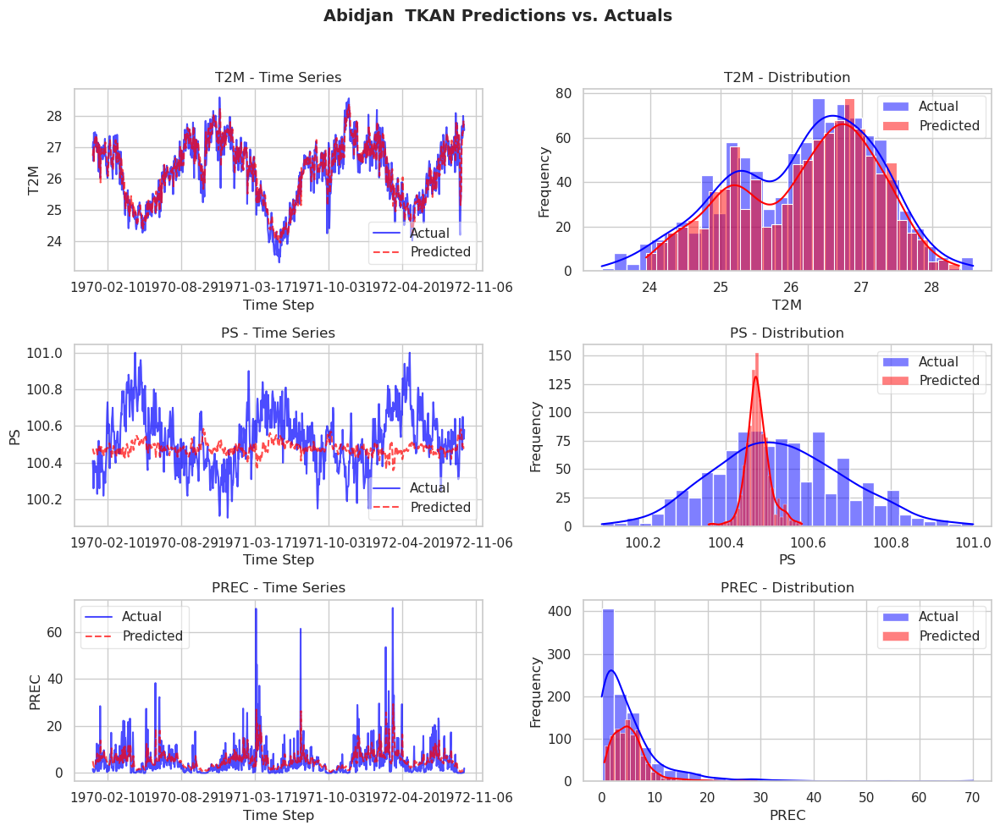

In [826]:

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def kan_prediction_plots_t(test_loaders,models,  dict_dates, scalers,var_to_pred = ['T2M','PS','PREC'] ,city="Abidjan",model_name="TKAN",obs_length=14):
    metrics_list = []
    # for idx_d,city in enumerate(cities):
         # Create subplots for visualization
    
    fig, axes = plt.subplots( 3,2, figsize=(12, 10))
    fig.suptitle(f"{city}  {model_name} Predictions vs. Actuals ", fontsize=14, fontweight="bold")
    for col, var_name in enumerate(var_to_pred):
        model = models[var_name]
        model.eval()  
        test_loader = test_loaders[var_name][0]
        dates =dict_dates[var_name][-1][obs_length:]
        scaler=scalers[var_name]
        
        y_true_list = []
        y_pred_list = []
        
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device).squeeze()
                if model_name!="KAN":
                    output,_ = model(X_batch)
                    outputs=output[:, -1,:].reshape(-1, 1)
                else:
                    outputs= model(X_batch)

                y_true_list.append(y_batch.cpu().numpy())
                y_pred_list.append(outputs.cpu().numpy())

        # Convert lists to NumPy arrays
        y_true = np.concatenate(y_true_list)
        y_pred = np.concatenate(y_pred_list)
        # print(y_true .shape, y_pred.shape)
        # Inverse transform
        dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2]-1 ))
        actuals_padded = np.hstack([dummy_features, y_true.reshape(-1, 1)])
        predictions_padded = np.hstack([dummy_features, y_pred.reshape(-1, 1)])
        # print("actuals_padded shape:",actuals_padded.shape, "Xbatch shape:", X_batch.shape,"predictions_padded shape:",predictions_padded.shape)
        actuals_ = scaler.inverse_transform(actuals_padded)[:, -1]
        predictions_ = scaler.inverse_transform(predictions_padded)[:, -1]
        # print( predictions_ [:10],actuals_ [:10]) 
        # Compute metrics
        mse_ = np.mean((actuals_ - predictions_) ** 2)
        rmse_ = np.sqrt(mse_)
        mae_ = np.mean(np.abs(actuals_ - predictions_))
        r2_ = 1 - (np.sum((actuals_ - predictions_) ** 2) / np.sum((actuals_ - np.mean(actuals_)) ** 2))

        mask = actuals_ != 0
        mape_ = np.mean(np.abs((actuals_[mask] - predictions_[mask]) / actuals_[mask])* 100) if mask.any() else np.nan

        # Store metrics
        metrics_list.append({
            "City": city,
            "Model": f"{model_name}",
            "Variable": var_name,
            "MSE": round(mse_,4),
            "RMSE": round(rmse_,4),
            "MAE": round(mae_,4),
            "R²": round(r2_,4),
            "MAPE": round(mape_,4)
        })
        # --- Subplot 1: Line Plot ---
        # dates=
        axes[col,0].plot(dates, actuals_, label="Actual", color="blue", alpha=0.7)
        axes[col,0].plot(dates, predictions_, label="Predicted", color="red", linestyle="dashed", alpha=0.7)
        axes[col,0].set_title(f"{var_name} - Time Series")
        axes[col,0].set_xlabel("Time Step")
        axes[col,0].set_ylabel(var_name)
        axes[col,0].legend(framealpha=0.5)
        axes[col,0].xaxis.set_major_locator(mdates.DayLocator(interval=200))  # Show every 7th day
        axes[col,0].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))  # Format: YYYY-MM-DD
        # axes[col, 0].tick_params(axis="x", rotation=45)  # ✅ Correct


        # --- Subplot 2: Histogram ---
        sns.histplot(actuals_, label="Actual", color="blue", kde=True, bins=30, alpha=0.5, ax=axes[col,1])
        sns.histplot(predictions_, label="Predicted", color="red", kde=True, bins=30, alpha=0.5, ax=axes[col,1])
        axes[col,1].set_title(f"{var_name} - Distribution")
        axes[col,1].set_xlabel(var_name)
        axes[col,1].set_ylabel("Frequency")
        axes[col,1].legend(framealpha=0.5)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit suptitle
    plt.savefig(f"{city}_{var_name}_{model_name}.png")
    plt.show()
        # print(idx_d)
    # Convert to DataFrame
    metrics_df = pd.DataFrame(metrics_list)
    return metrics_df
kan_prediction_plots_t(test_loaders,models,  dict_dates, scaler_dic).to_csv("TKAN_metrics.csv")


🏙️ Starting training for city: Abidjan

🌟 Training model for variable: PREC
Epoch [0/100], Loss: 1.2509756149916813 min grad: -0.2054, max grad: 0.4208
Epoch [30/100], Loss: 0.8015702880662063 min grad: -0.0001, max grad: 0.0003
Epoch [60/100], Loss: 0.8015259956491405 min grad: -0.0000, max grad: 0.0000
Epoch [90/100], Loss: 0.8015212303605573 min grad: -0.0000, max grad: 0.0000
✅ Training complete!


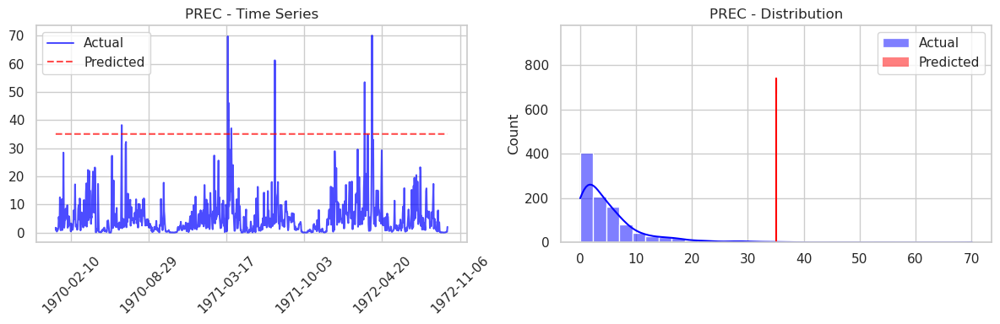


🌟 Training model for variable: PS
Epoch [0/100], Loss: 0.14138767399407667 min grad: -0.0117, max grad: 0.0290
Epoch [30/100], Loss: 0.08879951262396985 min grad: -0.0011, max grad: 0.0017
Epoch [60/100], Loss: 0.08765714185248161 min grad: -0.0017, max grad: 0.0019
Epoch [90/100], Loss: 0.08694706121780749 min grad: -0.0012, max grad: 0.0010
✅ Training complete!


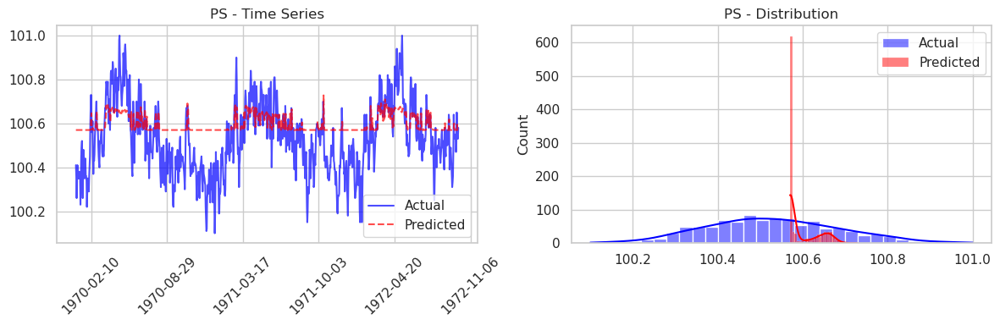


🌟 Training model for variable: T2M
Epoch [0/100], Loss: 0.2501272587105632 min grad: -0.1367, max grad: 0.0152
Epoch [30/100], Loss: 0.10013833301591463 min grad: -0.0943, max grad: 0.0321
Epoch [60/100], Loss: 0.09948955513215785 min grad: -0.0957, max grad: 0.0286
Epoch [90/100], Loss: 0.09919056024980442 min grad: -0.0806, max grad: 0.0266
✅ Training complete!


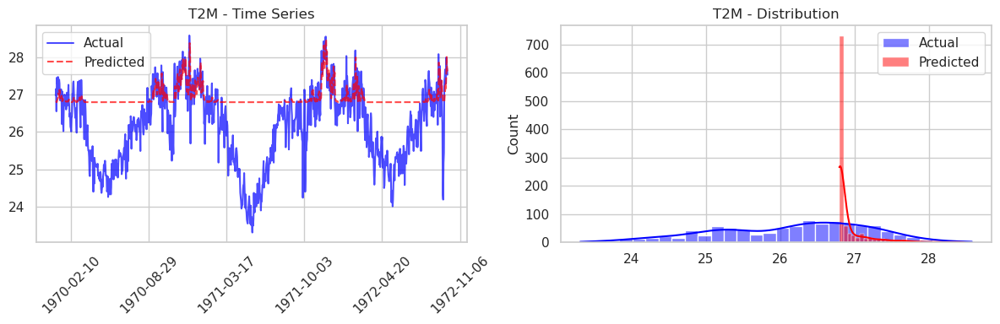

In [644]:
# Assumed imports already done:
# import torch, nn, optim, etc.
# from your_modules import TKAN, BSplineActivation
# Plus: matplotlib, seaborn, etc.
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
def train_model(model, loader, criterion, optimizer, device, epochs=100):
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        for X_batch, y_batch in loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).reshape(-1, 1)
            optimizer.zero_grad()
            outputs, _ = model(X_batch)
            outputs = outputs[:, -1]
            loss = criterion(outputs, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            epoch_loss += loss.item()
        with torch.no_grad():
            grad = torch.cat([p.grad.view(-1) for p in model.parameters() if p.grad is not None])
        if epoch % 30 == 0:
            print(f"Epoch [{epoch}/{epochs}], Loss: {epoch_loss / len(loader)} min grad: {torch.min(grad):.4f}, max grad: {torch.max(grad):.4f}")
    print("✅ Training complete!")

def evaluate_model(model, test_loader, device, scaler, col, var_name, city,date_test, model_name="TKAN",obs_length=14):

    y_true_list, y_pred_list = [], []
    dates = date_test[obs_length:]  # Ensure this is defined in your scope

    model.eval()
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).squeeze()
            outputs, _ = model(X_batch)
            outputs = outputs[:, -1, :].reshape(-1, 1)
            y_true_list.append(y_batch.cpu().numpy())
            y_pred_list.append(outputs.cpu().numpy())

    y_true = np.concatenate(y_true_list)
    y_pred = np.concatenate(y_pred_list)

    dummy_features = np.zeros((y_true.shape[0], X_batch.shape[2] - 1))
    actuals_padded = np.hstack([dummy_features, y_true.reshape(-1, 1)])
    predictions_padded = np.hstack([dummy_features, y_pred.reshape(-1, 1)])
    actuals_ = scaler[col].inverse_transform(actuals_padded)[:, -1]
    predictions_ = scaler[col].inverse_transform(predictions_padded)[:, -1]

    mse_ = np.mean((actuals_ - predictions_) ** 2)
    rmse_ = np.sqrt(mse_)
    mae_ = np.mean(np.abs(actuals_ - predictions_))
    r2_ = 1 - (np.sum((actuals_ - predictions_) ** 2) / np.sum((actuals_ - np.mean(actuals_)) ** 2))
    mask = actuals_ != 0
    mape_ = np.mean(np.abs((actuals_[mask] - predictions_[mask]) / actuals_[mask]) * 100) if mask.any() else np.nan

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(dates, actuals_, label="Actual", color="blue", alpha=0.7)
    axes[0].plot(dates, predictions_, label="Predicted", color="red", linestyle="--", alpha=0.7)
    axes[0].set_title(f"{var_name} - Time Series")
    axes[0].xaxis.set_major_locator(mdates.DayLocator(interval=200))
    axes[0].xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].legend()

    sns.histplot(actuals_, label="Actual", color="blue", kde=True, bins=30, alpha=0.5, ax=axes[1])
    sns.histplot(predictions_, label="Predicted", color="red", kde=True, bins=30, alpha=0.5, ax=axes[1])
    axes[1].set_title(f"{var_name} - Distribution")
    axes[1].legend()

    plt.tight_layout()
    plt.savefig(f"{city}_{var_name}_{model_name}.png")
    plt.show()

    return {
        "City": city,
        "Model": model_name,
        "Variable": var_name,
        "MSE": round(mse_, 4),
        "RMSE": round(rmse_, 4),
        "MAE": round(mae_, 4),
        "R²": round(r2_, 4),
        "MAPE": round(mape_, 4)
    }

# 🔁 Main Loop over variables
# Abj_dt
def move_column_to_end(df, colname):
    df = df.copy()
    col = df.pop(colname)
    df[colname] = col
    return df

def train_evaluate_city_model(city_name, city_df, device, variables= ['T2M','PS','PREC'], epochs=100):
    

    print(f"\n🏙️ Starting training for city: {city_name}")
    metrics_all = []
    scaler={}
    for var in variables:
        print(f"\n🌟 Training model for variable: {var}")
        target_names = [var]
        scaler_i = MinMaxScaler(feature_range=(-1, 1))
        date=city_df.index.astype(str).tolist()
        city_df_copy = city_df.copy()
        # target_col = city_df_copy.pop(var)
        # city_df_copy.insert(len(city_df_copy.columns),var, target_col)
        city_df_copy=move_column_to_end(city_df_copy, var)
        # Create loaders
        # list_data = Make_tidydata_for_kan(data_copy,scaler[idx])
        _,_,dates=Make_tidydata_t(date, scaler_i,data_type="date")
        train_loader, val_loader, test_loader = create_data_loaders_t(
            TimeSeriesDataset, Make_tidydata_t, city_df_copy, target_names, scaler_i,
            window_length=1, obs_length=14, batch_size=64
        )
        scaler[var]=[scaler_i]
        input_shape = city_df.shape
        sub_kan_input_dim = input_shape[-1]
        sub_kan_output_dim = sub_kan_input_dim
        units = 1

        model = TKAN(units, input_shape, sub_kan_output_dim, sub_kan_input_dim,
                     tkan_activations=[BSplineActivation(3)]).to(device)

        optimizer = optim.Adam(model.parameters(), lr=0.001)
        criterion = nn.MSELoss()

        train_model(model, train_loader, criterion, optimizer, device, epochs=epochs)

        metrics = evaluate_model(model, test_loader, device, scaler[var], 0, var, city_name,dates)
        metrics_all.append(metrics)

    return pd.DataFrame(metrics_all)


# # 📊 Results Summary
# metrics_df = pd.DataFrame(metrics_all)
# print("\n📈 Final Evaluation Metrics:")
# print(metrics_df)
city_name,city_df="Abidjan",Abj_dt
metrics_df= train_evaluate_city_model(city_name, city_df, device, variables=["PREC", "PS", "T2M"], epochs=100)

In [459]:
# # pd.reduce(robustness_all_metrics,all_metrics)
# result_Abj = robustness_all_metrics[robustness_all_metrics["City"] == "Abidjan"][['MSE', 'RMSE', 'MAE', 'R²', 'MAPE']] - \
#              all_metrics[all_metrics["City"] == "Abidjan"][['MSE', 'RMSE', 'MAE', 'R²', 'MAPE']]

# result_Abj
import pandas as pd

def compute_city_difference(city, data, robust_data):
    """
    Compute the difference in metrics between robust_data and data for a given city.

    Parameters:
    city (str): The name of the city to filter on.
    data (pd.DataFrame): The original metrics dataframe.
    robust_data (pd.DataFrame): The robustness metrics dataframe.

    Returns:
    pd.DataFrame: A dataframe containing the differences in metrics while preserving non-numerical columns.
    """
    # Filter data for the given city
    df_robust = robust_data[robust_data["City"] == city]
    df_all = data[data["City"] == city]

    # Select numerical columns for subtraction
    num_cols = ['MSE', 'RMSE', 'MAE', 'R²', 'MAPE']
    
    if df_robust.empty or df_all.empty:
        raise ValueError(f"No data found for city: {city}")

    # Compute the difference for numerical columns
    result = df_robust[num_cols].reset_index(drop=True) - df_all[num_cols].reset_index(drop=True)

    # Keep non-numerical columns and merge them back
    non_num_cols = df_robust.drop(columns=num_cols).reset_index(drop=True)
    result = pd.concat([non_num_cols, result], axis=1)

    return result

# Example usage:
# result_Abj = compute_city_difference("Abidjan", all_metrics, robustness_all_metrics)
city="Abidjan"
data=all_metrics
robust_data=robustness_all_metrics
robust_metrics_rnn=compute_city_difference(city, data, robust_data)
robust_metrics_kan=compute_city_difference(city,  kan_metrics,robust_kan_)

# Combine  both data
final_metrics_difference=pd.concat((robust_metrics_rnn,robust_metrics_kan))


,City,Model,Variable,MSE,RMSE,MAE,R²,MAPE
0,Abidjan,LSTMModel,T2M,9.8040,1.4364,1.2589,-0.2229,2.1918
1,Abidjan,LSTMModel,PS,0.0006,0.0048,0.0034,-0.0239,0.0033
2,Abidjan,LSTMModel,PREC,2.2574,0.1854,0.0752,-0.0463,142.5321
3,Abidjan,GRUModel,T2M,8.4348,1.2540,1.0806,-0.1918,1.9020
4,Abidjan,GRUModel,PS,0.0005,0.0035,0.0019,-0.0177,0.0019
5,Abidjan,GRUModel,PREC,2.0659,0.1705,0.0582,-0.0423,83.1676
6,Abidjan,BiLSTM,T2M,6.6776,1.0879,0.9717,-0.1518,1.6879
7,Abidjan,BiLSTM,PS,0.0005,0.0042,0.0034,-0.0211,0.0034
8,Abidjan,BiLSTM,PREC,1.2980,0.1064,0.0297,-0.0266,-53.2390
9,Abidjan,BiGRU,T2M,8.5095,1.3438,1.1346,-0.1935,2.0223


In [460]:
final_metrics_difference.to_csv("metrics_difference_inD_VS_OOD.csv")

/tmp/ipykernel_1914949/2670955330.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


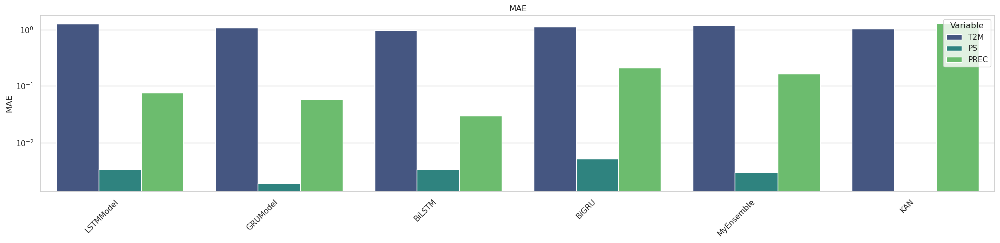

In [473]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_model_comparison(df):
    """
    Create a bar plot showing metric differences per model and per variable for a given city.

    Parameters:
    df (pd.DataFrame): The dataframe containing City, Model, Variable, and metrics.
    city (str): The city to filter the data.

    Returns:
    None: Displays the plot.
    """
    # # Filter data for the specified city
    # df_city = df[df["City"] == city]

    # Define metrics to plot
    metrics = 'MAE'#, 'RMSE', 'MAE', 'R²', 'MAPE']

    # Set Seaborn style
    sns.set(style="whitegrid")

    # Create subplots
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 5), sharey=True)

    # for i, metric in enumerate(metrics):
    ax = axes
    sns.barplot(
        data=df,
        x="Model", y=metrics, hue="Variable",
        ax=ax, palette="viridis"
    )
    ax.set_title(metrics)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    ax.set_xlabel("")
        # if i == 0:
        #     ax.set_ylabel("Value")
        # else:
        #     ax.set_ylabel("")

    # Adjust layout
    plt.yscale("log")
    plt.tight_layout()
    plt.show()


plot_model_comparison(final_metrics_difference)


In [471]:
city="Kigali"
data_kgl=all_metrics
robust_data_kgl=robustness_all_metrics
robust_metrics_rnn_kgl=compute_city_difference(city, data_kgl, robust_data_kgl)
robust_metrics_kan_kgl=compute_city_difference(city,  kan_metrics,robust_kan_)

# Combine  both data
final_metrics_difference_kgl=pd.concat((robust_metrics_rnn_kgl,robust_metrics_kan_kgl))

/tmp/ipykernel_1914949/2670955330.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


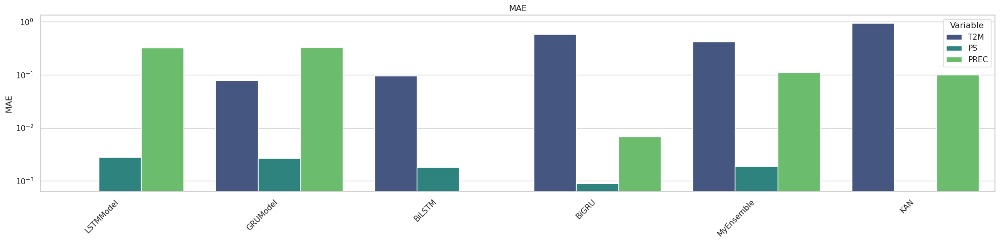

In [474]:
plot_model_comparison(final_metrics_difference_kgl)